# 2021-mid-term-report : HAL Data processing

In [1]:
import requests
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import unidecode
import json
import re
from typing import Any, Dict, List, Callable
import textwrap

# Constants

Define primary constants

* `LAB_STRUCT_ID` : The identifier in HAL of the CES (15080)
* `NON_ALPHA_NUMERIC_REGEX` : Regex to cleanup all non alpha numeric characters
* `JSON_FILENAME` : Extration from HAL API.
* `JSON_DIFF_FILENAME` : Extraction from HAL API for correction
* `CSV_DIFF_FILENAME` : All results from `JSON_DIFF_FILENAME` that should be integrate in the report.

In [2]:
LAB_STRUCT_ID = 15080
NON_ALPHA_NUMERIC_REGEX = re.compile('[^a-z0-9_-]', re.IGNORECASE)
JSON_FILENAME = './result.2021-10-30T16-38.json'
JSON_DIFF_FILENAME = './result-diff.2021-10-30T13-31.json'
CSV_DIFF_FILENAME = './diff.result-traite.csv'

#  Datasets

This dataset has been saved by another notebook : `load-json-data-file.ipynb`

Here, we just load the data. For more information, see [./load-json-data-file.ipynb](./load-json-data-file.ipynb) another


## HAL APIs

### Load HAL API results

Load the HAP API results from filaneme named `JSON_FILENAME`

In [3]:
with open(JSON_FILENAME, 'r') as fp:
    data = json.load(fp)
df = pd.DataFrame.from_dict(data['response']['docs'])
df

,label_s,openAccess_bool,journalTitle_s,journalIssn_s,authId_i,authLastName_s,authFirstName_s,authFullName_s,authStructId_i,authIdHasPrimaryStructure_fs,...,uri_s,keyword_s,files_s,jel_s,funding_s,anrProjectTitle_s,anrProjectAcronym_s,anrProjectReference_s,europeanProjectAcronym_s,europeanProjectReference_s
0,"Aurélien Goutsmedt, Erich Pinzón-Fuchs, Matthi...",False,History of Political Economy,0018-2702,"[11213136, 1381941, 1381943, 1120988]","[Goutsmedt, Pinzón-Fuchs, Renault, Sergi]","[Aurélien, Erich, Matthieu, Francesco]","[Aurélien Goutsmedt, Erich Pinzón-Fuchs, Matth...","[15080, 229853, 129868, 365626]",[11213136_FacetSep_Aurélien Goutsmedt_JoinSep_...,...,https://hal.archives-ouvertes.fr/hal-03228974,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,"Aurélien Goutsmedt, Danielle Guizzo, Francesco...",True,Œconomia - History/Methodology/Philosophy,2113-5207,"[11213136, 12297624, 1120988]","[Goutsmedt, Guizzo, Sergi]","[Aurélien, Danielle, Francesco]","[Aurélien Goutsmedt, Danielle Guizzo, Francesc...","[15080, 365626]",[11213136_FacetSep_Aurélien Goutsmedt_JoinSep_...,...,https://hal.archives-ouvertes.fr/hal-03228955,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Wladimir Andreff. New-Wave Emerging Multinatio...,True,Chinese Business Review,1537-1506,[1261461],[Andreff],[Wladimir],[Wladimir Andreff],[15080],[1261461_FacetSep_Wladimir Andreff_JoinSep_150...,...,https://hal.archives-ouvertes.fr/hal-03231804,"[Emerging countries, Multinational companies, ...",[https://hal.archives-ouvertes.fr/hal-03231804...,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Wladimir Andreff. Le modèle économique du foot...,False,Pôle Sud - Revue de science politique de l'Eur...,1262-1676,[1261461],[Andreff],[Wladimir],[Wladimir Andreff],[15080],[1261461_FacetSep_Wladimir Andreff_JoinSep_150...,...,https://hal.archives-ouvertes.fr/hal-03232617,"[Economie du sport, Equilibre compétitif, Reve...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,"Hayette Gatfaoui, Philippe de Peretti. Flicker...",True,Scientific Reports,2045-2322,"[578576, 573239]","[Gatfaoui, De Peretti]","[Hayette, Philippe]","[Hayette Gatfaoui, Philippe de Peretti]","[469630, 15080, 15080]",[578576_FacetSep_Hayette Gatfaoui_JoinSep_4696...,...,https://hal.archives-ouvertes.fr/hal-02098605,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
470,"Delphine Brochard, Marion Charpenel, Sophie Po...",False,French Politics,1476-3419,"[561732, 11444687, 553079]","[Brochard, Charpenel, Pochic]","[Delphine, Marion, Sophie]","[Delphine Brochard, Marion Charpenel, Sophie P...","[15080, 521960, 20824]",[561732_FacetSep_Delphine Brochard_JoinSep_150...,...,https://hal.archives-ouvertes.fr/hal-02493250,"[Collective bargaining, Feminism, Equal employ...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
471,"Laurence Lizé, Mireille Bruyère. L’impact des ...",False,Relations Industrielles / Industrial Relations,0034-379X,"[1319866, 787175]","[Lizé, Bruyère]","[Laurence, Mireille]","[Laurence Lizé, Mireille Bruyère]","[15080, 560]",[1319866_FacetSep_Laurence Lizé_JoinSep_15080_...,...,https://hal.archives-ouvertes.fr/hal-03023385,"[Working conditions, Sense of work, Financiali...",[https://hal.archives-ouvertes.fr/hal-03023385...,[J],NaN,NaN,NaN,NaN,NaN,NaN
472,"Yi-Fang Liu, Jørgen Vitting Andersen, Philippe...",True,"Chaos, Solitons and Fractals",0960-0779,"[1338542, 1253002, 573239]","[Liu, Andersen, De Peretti]","[Yi-Fang, Jørgen Vitting, Philippe]","[Yi-Fang Liu, Jørgen Vitting Andersen, Philipp...","[439373, 441569, 15080, 7550, 15080]",[1338542_FacetSep_Yi-Fang Liu_JoinSep_439373_F...,...,https://hal.archives-ouvertes.fr/hal-03029555,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
473,"Marie-Christine Bureau, Antonella Corsani, Ber...",False,Relations Industrielles / Industrial Relations,0034-379X,"[733418, 849652, 184227]","[Bureau, Corsani, Gazier]","[Marie-Christine, Antonella, Bernard]","[Marie-Christine Bureau, Antonella Corsani, Be...","[172735, 193999, 243735, 15080]",[733418_FacetSep_Marie-

### Load HAL API Diff JSON Results

Load the Diff JSON filename named `JSON_DIFF_FILENAME` and the CSV named `CSV_DIFF_FILENAME`

The file named `CSV_DIFF_FILENAME` should contains the following columns :

* `TO_RETRIEVE`: `True` or `False`
* `uri_s` : Hal uri of the publication



In [4]:
with open(JSON_DIFF_FILENAME, 'r') as fp:
    data = json.load(fp)
ddf = pd.DataFrame.from_dict(data['response']['docs'])
cddf = pd.read_csv(CSV_DIFF_FILENAME, sep=',')
ddf = cddf[cddf.TO_RETRIEVE].merge(ddf, on='uri_s').drop(columns=['TO_RETRIEVE'])
ddf

,uri_s,label_s,openAccess_bool,journalId_i,journalTitle_s,authId_i,authLastName_s,authFirstName_s,authFullName_s,authStructId_i,...,language_s,files_s,keyword_s,funding_s,jel_s,anrProjectTitle_s,anrProjectAcronym_s,anrProjectReference_s,europeanProjectAcronym_s,europeanProjectReference_s
0,https://hal.archives-ouvertes.fr/hal-03153465,"René van den Brink, Dinko Dimitrov, Agnieszka ...",True,18986,Social Choice and Welfare,"[1620212, 11632766, 1011125]","[Van Den Brink, Dimitrov, Rusinowska]","[René, Dinko, Agnieszka]","[René van den Brink, Dinko Dimitrov, Agnieszka...","[303390, 110922, 441569, 15080, 301309]",...,[en],[https://hal.archives-ouvertes.fr/hal-03153465...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,https://hal.archives-ouvertes.fr/hal-03034701,"Antoine Billot, Xiangyu Qu. Utilitarian Aggreg...",True,73680,American Economic Journal: Microeconomics,"[371828, 1455965]","[Billot, QU]","[Antoine, Xiangyu]","[Antoine Billot, Xiangyu Qu]","[219652, 15080, 441569]",...,[en],[https://hal.archives-ouvertes.fr/hal-03034701...,NaN,[Billot is grateful to the project Labex mmedi...,"[D.D1.D11, D.D7.D71, D.D8.D83]",[Modèles Mathématiques et Economiques de la Dy...,"[MME-DII, CHOp]","[ANR-11-LABX-0023, ANR-17-CE26-0003]",NaN,NaN
2,https://hal.archives-ouvertes.fr/hal-02367200v3,Eduardo Abi Jaber. The Laplace transform of th...,True,16917,Mathematical Finance,[11351062],[Abi Jaber],[Eduardo],[Eduardo Abi Jaber],"[15080, 174914]",...,[en],[https://hal.archives-ouvertes.fr/hal-02367200...,"[Wishart processes, Gaussian processes, Fredho...",NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,https://halshs.archives-ouvertes.fr/halshs-023...,"Antoine Mandel, Davoud Taghawi-Nejad, Vipin Ve...",True,15364,Journal of Economic Behavior and Organization,"[1386562, 11621608, 11621609]","[Mandel, Taghawi-Nejad, Veetil]","[Antoine, Davoud, Vipin]","[Antoine Mandel, Davoud Taghawi-Nejad, Vipin V...","[15080, 301309, 302612, 302030, 411853]",...,[en],[https://halshs.archives-ouvertes.fr/halshs-02...,"[Prices, Money, Networks, Monetary shocks, Age...",[Antoine Mandel and Vipin P. Veetil acknowledg...,"[C.C6.C63, C.C6.C67, D.D8.D80, E.E3.E31, E.E5....",NaN,NaN,NaN,"[DOLFINS, IMPRESSIONS]","[640772, 603416]"
4,https://halshs.archives-ouvertes.fr/halshs-032...,"Adélaïde Favrat, Vincent Lignon, Muriel Pucci....",True,20664,Economie et Statistique / Economics and Statis...,"[1322802, 12269558, 554560]","[Favrat, Lignon, Pucci]","[Adélaïde, Vincent, Muriel]","[Adélaïde Favrat, Vincent Lignon, Muriel Pucci]","[82495, 101475, 15080]",...,[fr],[https://halshs.archives-ouvertes.fr/halshs-03...,"[Redistribution, Microsimulation, Family polic...",NaN,"[I.I3.I38, H.H5.H53, C.C6.C63]",NaN,NaN,NaN,NaN,NaN
5,https://hal.archives-ouvertes.fr/hal-02093378,"van Phu Nguyen, Cuong Le Van, Phu Nguyen-Van, ...",True,16112,Journal of Public Economic Theory,"[11455755, 318368, 615520, 11455756, 11455757]","[NGUYEN, Le Van, Nguyen-Van, Barbier-Gauchard,...","[Van Phu, Cuong, Phu, Amélie, Duc-Anh]","[van Phu Nguyen, Cuong Le Van, Phu Nguyen-Van,...","[93745, 199013, 557622, 542840, 15080, 301309,...",...,[en],[https://hal.archives-ouvertes.fr/hal-02093378...,"[Public expenditure, Public debt, Economic gro...",[Cuong Le Van is partially funded by Vietnam N...,NaN,NaN,NaN,NaN,NaN,NaN
6,https://halshs.archives-ouvertes.fr/halshs-023...,"Nicolas Carayol, Laurent Bergé, Lorenzo Cassi,...",True,15364,Journal of Economic Behavior and Organization,"[305925, 552607, 380315, 305926]","[Carayol, Bergé, Cassi, Roux]","[Nicolas, Laurent, Lorenzo, Pascale]","[Nicolas Carayol, Laurent Bergé, Lorenzo Cassi...","[27589, 106421, 15080, 301309, 27589]",...,[en],[https://halshs.archives-ouvertes.fr/halshs-02...,"[Patents, Social networks, Monte Carlo simulat...",NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Aggregate results - HAL API Dataset consolidation

In [5]:
df = pd.concat([df, ddf]).drop_duplicates(subset=['uri_s'], ignore_index=True)
print(f'Number of articles : {df["uri_s"].size}')
df

Number of articles : 482


,label_s,openAccess_bool,journalTitle_s,journalIssn_s,authId_i,authLastName_s,authFirstName_s,authFullName_s,authStructId_i,authIdHasPrimaryStructure_fs,...,keyword_s,files_s,jel_s,funding_s,anrProjectTitle_s,anrProjectAcronym_s,anrProjectReference_s,europeanProjectAcronym_s,europeanProjectReference_s,journalId_i
0,"Aurélien Goutsmedt, Erich Pinzón-Fuchs, Matthi...",False,History of Political Economy,0018-2702,"[11213136, 1381941, 1381943, 1120988]","[Goutsmedt, Pinzón-Fuchs, Renault, Sergi]","[Aurélien, Erich, Matthieu, Francesco]","[Aurélien Goutsmedt, Erich Pinzón-Fuchs, Matth...","[15080, 229853, 129868, 365626]",[11213136_FacetSep_Aurélien Goutsmedt_JoinSep_...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,"Aurélien Goutsmedt, Danielle Guizzo, Francesco...",True,Œconomia - History/Methodology/Philosophy,2113-5207,"[11213136, 12297624, 1120988]","[Goutsmedt, Guizzo, Sergi]","[Aurélien, Danielle, Francesco]","[Aurélien Goutsmedt, Danielle Guizzo, Francesc...","[15080, 365626]",[11213136_FacetSep_Aurélien Goutsmedt_JoinSep_...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Wladimir Andreff. New-Wave Emerging Multinatio...,True,Chinese Business Review,1537-1506,[1261461],[Andreff],[Wladimir],[Wladimir Andreff],[15080],[1261461_FacetSep_Wladimir Andreff_JoinSep_150...,...,"[Emerging countries, Multinational companies, ...",[https://hal.archives-ouvertes.fr/hal-03231804...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Wladimir Andreff. Le modèle économique du foot...,False,Pôle Sud - Revue de science politique de l'Eur...,1262-1676,[1261461],[Andreff],[Wladimir],[Wladimir Andreff],[15080],[1261461_FacetSep_Wladimir Andreff_JoinSep_150...,...,"[Economie du sport, Equilibre compétitif, Reve...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,"Hayette Gatfaoui, Philippe de Peretti. Flicker...",True,Scientific Reports,2045-2322,"[578576, 573239]","[Gatfaoui, De Peretti]","[Hayette, Philippe]","[Hayette Gatfaoui, Philippe de Peretti]","[469630, 15080, 15080]",[578576_FacetSep_Hayette Gatfaoui_JoinSep_4696...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
477,Eduardo Abi Jaber. The Laplace transform of th...,True,Mathematical Finance,NaN,[11351062],[Abi Jaber],[Eduardo],[Eduardo Abi Jaber],"[15080, 174914]",[11351062_FacetSep_Eduardo Abi Jaber_JoinSep_1...,...,"[Wishart processes, Gaussian processes, Fredho...",[https://hal.archives-ouvertes.fr/hal-02367200...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,16917.0
478,"Antoine Mandel, Davoud Taghawi-Nejad, Vipin Ve...",True,Journal of Economic Behavior and Organization,NaN,"[1386562, 11621608, 11621609]","[Mandel, Taghawi-Nejad, Veetil]","[Antoine, Davoud, Vipin]","[Antoine Mandel, Davoud Taghawi-Nejad, Vipin V...","[15080, 301309, 302612, 302030, 411853]",[1386562_FacetSep_Antoine Mandel_JoinSep_15080...,...,"[Prices, Money, Networks, Monetary shocks, Age...",[https://halshs.archives-ouvertes.fr/halshs-02...,"[C.C6.C63, C.C6.C67, D.D8.D80, E.E3.E31, E.E5....",[Antoine Mandel and Vipin P. Veetil acknowledg...,NaN,NaN,NaN,"[DOLFINS, IMPRESSIONS]","[640772, 603416]",15364.0
479,"Adélaïde Favrat, Vincent Lignon, Muriel Pucci....",True,Economie et Statistique / Economics and Statis...,NaN,"[1322802, 12269558, 554560]","[Favrat, Lignon, Pucci]","[Adélaïde, Vincent, Muriel]","[Adélaïde Favrat, Vincent Lignon, Muriel Pucci]","[82495, 101475, 15080]",[1322802_FacetSep_Adélaïde Favrat_JoinSep_8249...,...,"[Redistribution, Microsimulation, Family polic...",[https://halshs.archives-ouvertes.fr/halshs-03...,"[I.I3.I38, H.H5.H53, C.C6.C63]",NaN,NaN,NaN,NaN,NaN,NaN,20664.0
480,"van Phu Nguyen, Cuong Le Van, Phu Nguyen-Van, ...",True,Journal of Public Economic Theory,NaN,"[11455755, 318368, 615520, 11455756, 11455757]","[NGUYEN, Le Van, Nguyen-Van, Barbier-Gauchard,...","[Van Phu, Cuong, Phu, Amélie, Duc-Anh]","[van Phu Nguyen, Cuong Le Van, Phu Nguyen-Van,...","[93745, 199013, 557622, 542840, 15080, 301309,...",[11455755_FacetSep_van Phu Nguyen_JoinSep_93

In [6]:
# List all non nan row for each columns
df.count().to_frame().to_csv('./exports/rows-having-values.csv', index=True)
df.count().to_frame()

,0
label_s,482
openAccess_bool,482
journalTitle_s,482
journalIssn_s,449
authId_i,482
authLastName_s,482
authFirstName_s,482
authFullName_s,482
authStructId_i,482
authIdHasPrimaryStructure_fs,482


## Authors Datasets

In this section, we will work on the authors to find all forms of the authors


### Authors and structure...

As an author may have multiple structures, the number of items in `auth*` columns will not be the same !

We will have the same length in the following list :

* `authId_i`, `authLastName_s`, `authFirstName_s`, `authFullName_s`
* `authStructId_i`, `authIdHasPrimaryStructure_fs`

But the length of list `authId_i` and `authStructId_i` may be different.

We will use the facet `authIdHasPrimaryStructure_fs` to correlate an author with its `authStructId_i`.

In [7]:
# Cleanup useles columns for authors and explode on same list length
authors = df[['authId_i', 'authLastName_s', 'authFirstName_s', 'authFullName_s', 'authStructId_i', 'authIdHasPrimaryStructure_fs']]
authors = authors.explode(['authId_i', 'authLastName_s', 'authFirstName_s', 'authFullName_s'])
authors = authors.explode(['authStructId_i', 'authIdHasPrimaryStructure_fs'])
# Correlate authIdHasPrimaryStructure_fs with author fullname
authors = authors[authors.apply(lambda r: r.authFullName_s in r.authIdHasPrimaryStructure_fs, axis=1)]
authors = authors.drop(columns=['authIdHasPrimaryStructure_fs']).drop_duplicates(ignore_index=True)
authors.head(n=5)

,authId_i,authLastName_s,authFirstName_s,authFullName_s,authStructId_i
0,11213136,Goutsmedt,Aurélien,Aurélien Goutsmedt,15080
1,1381941,Pinzón-Fuchs,Erich,Erich Pinzón-Fuchs,229853
2,1381943,Renault,Matthieu,Matthieu Renault,129868
3,1120988,Sergi,Francesco,Francesco Sergi,365626
4,1261461,Andreff,Wladimir,Wladimir Andreff,15080


### Current structure

Now, we extrat authors of the current structure

In [8]:
# Retrieve only row having the right structure id
struct_authors = authors[(authors.authStructId_i == LAB_STRUCT_ID)]
struct_authors = struct_authors.drop(columns=['authId_i', 'authStructId_i'])
struct_authors = struct_authors.drop_duplicates(ignore_index=True).sort_values(by=['authLastName_s']).reset_index(drop=True)
struct_authors.to_csv(f'./exports/authors_{LAB_STRUCT_ID}.csv', index=False)
struct_authors

,authLastName_s,authFirstName_s,authFullName_s
0,Abi Jaber,Eduardo,Eduardo Abi Jaber
1,Affes,Zeineb,Zeineb Affes
2,Aguilar-Lleyda,David,David Aguilar-Lleyda
3,Ahamada,Ibrahim,Ibrahim Ahamada
4,Aktuna-Gunes,Armagan Tuna,Armagan Tuna Aktuna-Gunes
...,...,...,...
183,Wang,Dan-Xia,Dan-Xia Wang
184,Worack,Stephan,Stephan Worack
185,Yvrande-Billon,Anne,Anne Yvrande-Billon
186,Zemmour,Michaël,Michaël Zemmour


### DataSet : Teams

We load the file `./members_teams_ces.csv` to associate an authors with its `team` and `theme`

In [9]:
author_teams = pd.read_csv('./members_teams_ces.csv', sep=',')
# Ensure that all authors of the current structure will be in the author_teams data frame
author_teams = struct_authors.merge(author_teams[['authFullName_s', 'EQUIPE', 'THEME']], how='left', on='authFullName_s').fillna('N/A').drop_duplicates(ignore_index=True)
author_teams.to_csv(f'./exports/authors_{LAB_STRUCT_ID}_with_team.csv', index=False)
author_teams

,authLastName_s,authFirstName_s,authFullName_s,EQUIPE,THEME
0,Abi Jaber,Eduardo,Eduardo Abi Jaber,modélisation financière,thème 1
1,Affes,Zeineb,Zeineb Affes,globalisation financière,thème 2
2,Aguilar-Lleyda,David,David Aguilar-Lleyda,sciences du comportement,thème 1
3,Ahamada,Ibrahim,Ibrahim Ahamada,sciences du comportement,thème 1
4,Aktuna-Gunes,Armagan Tuna,Armagan Tuna Aktuna-Gunes,microéconomie théorique,thème 1
...,...,...,...,...,...
183,Wang,Dan-Xia,Dan-Xia Wang,microéconomie théorique,thème 1
184,Worack,Stephan,Stephan Worack,économie du développement,thème 2
185,Yvrande-Billon,Anne,Anne Yvrande-Billon,politiques publiques,thème 3
186,Zemmour,Michaël,Michaël Zemmour,économie politique,thème 3


In [10]:
author_teams['THEME'].value_counts()

thème 1    87
thème 3    51
thème 2    46
N/A         4
Name: THEME, dtype: int64

In [11]:
teams = author_teams[['EQUIPE', 'THEME']].drop_duplicates(ignore_index=True).sort_values(by=['EQUIPE']).reset_index(drop=True)
teams

,EQUIPE,THEME
0,N/A,N/A
1,globalisation financière,thème 2
2,microéconomie théorique,thème 1
3,modélisation financière,thème 1
4,politiques publiques,thème 3
5,sciences du comportement,thème 1
6,économie du développement,thème 2
7,économie internationale,thème 2
8,économie politique,thème 3


### DataSet : Article teams

Now that we have the authors with the teams, we will create a new DataFrame with new columns `EQUIPE` and `THEME` and without any authors columns.

The result of this operation will create a new dataframe named `dft` (without authors).

**Warning :** The resulting dataframe will contains more rows than the original dataframe because some articles may have been written with multiples teams of the same structure. 

In [12]:
dft = df.explode(['authFullName_s']).merge(author_teams[['authFullName_s', 'EQUIPE', 'THEME']], how='inner', on='authFullName_s')
dft = dft[['uri_s', 'EQUIPE', 'THEME']].drop_duplicates().reset_index()
dft

,index,uri_s,EQUIPE,THEME
0,0,https://hal.archives-ouvertes.fr/hal-03228974,économie politique,thème 3
1,1,https://hal.archives-ouvertes.fr/hal-03228955,économie politique,thème 3
2,3,https://hal.archives-ouvertes.fr/hal-01570068,économie politique,thème 3
3,4,https://hal.archives-ouvertes.fr/hal-03231804,économie internationale,thème 2
4,5,https://hal.archives-ouvertes.fr/hal-03232617,économie internationale,thème 2
...,...,...,...,...
496,597,https://halshs.archives-ouvertes.fr/halshs-032...,économie du développement,thème 2
497,602,https://hal.archives-ouvertes.fr/hal-02367727,économie politique,thème 3
498,603,https://hal.archives-ouvertes.fr/hal-02112904,économie politique,thème 3
499,604,https://halshs.archives-ouvertes.fr/halshs-032...,économie politique,thème 3


### N/A authors

We extract the articles of authors not attributed to a team. 

In [13]:
na_authors = author_teams[author_teams.EQUIPE == 'N/A']
na_authors = df.explode('authFullName_s').merge(na_authors, on='authFullName_s', how='inner')[['uri_s', 'authFullName_s']]
na_authors = na_authors.drop_duplicates().sort_values(by=['uri_s'], ignore_index=True)
na_authors.to_csv('./exports/na-authors.csv', index=False)
na_authors

,uri_s,authFullName_s
0,https://hal-univ-paris8.archives-ouvertes.fr/h...,Georges Daw
1,https://hal.archives-ouvertes.fr/hal-01088831,Vincent Boitier
2,https://hal.archives-ouvertes.fr/hal-02800608,Mikita Kniahin
3,https://halshs.archives-ouvertes.fr/halshs-019...,Georges Daw
4,https://halshs.archives-ouvertes.fr/halshs-023...,Lorenzo Cassi


## Rerefentials Datasets

### Econlit

EconLit referential is available at https://www.aeaweb.org/econlit/journal_list.php .

A JSON Datasets can be extract from a web browser (such as Chrome or Firefox) using the simple following commands in a web console:

```javascript
$$('.journaldesc')
  .toArray()
  .map(item => $(item).text().split('\n'))
  .map(arr => Object.assign(
    { Title: arr[0].trim() },
    Object.fromEntries(
      arr
      .slice(1)
      .map(val => val.trim())
      .map(line => [
        line.split(':', 1).join().trim(),
        line.split(':').slice(1).join(':').trim()
      ]))
  ));
```

This will extract all the required code in a object that can be copy/paste into a JSON file

**Note 1 :** It's possible to have some ISSN duplicated here. For example, `0013-0117` have several titles (_Economic History Review_ or _Economic History Review, Second Series_)

**Note 2 :** For formating purpose, `$$` should be replace with a single `$`

In [14]:
econlit_df = pd.read_json('./ref.econlit.json').drop(columns=['EconLit Coverage', 'Formerly','See'])
print(f'Econlit original size : {econlit_df["Title"].size}')
# Cleaning data
econlit_df['ISSN'] = econlit_df['ISSN'].transform(lambda x: x.strip())
econlit_df = econlit_df.drop_duplicates(subset=['ISSN'], ignore_index=True)
print(f'Econlit size after droping duplicates : {econlit_df["Title"].size}')
econlit_df

Econlit original size : 2007
Econlit size after droping duplicates : 1879


,Title,ISSN
0,4OR: A Quarterly Journal of Operations Research,1619-4500
1,Academia Economic Papers,1018-161X
2,"Accounting, Business and Financial History",0958-5206
3,"Accounting, Economics, and Law: A Convivium",2194-6051
4,Accounting History Review,2155-2851
...,...,...
1874,Zeitschrift für Wirtschafts- und Sozialwissens...,0342-1783
1875,Zeitschrift für Wirtschafts- und Unternehmense...,1439-880X
1876,Zeitschrift für Wirtschaftspolitik,0721-3808
1877,Zeitschrift fur offentliche und gemeinwirtscha...,0344-9777


### MathSciNet

MathSciNet referential is available at https://mathscinet.ams.org/mathscinet/mrcit/journal_list.html

A JSON Datasets can be extract from browser using the simple following commands in a web console:

```javascript
$$('table tr')
  .toArray()
  .map(i => $(i).find('td'))
  .filter(a => a.length === 4)
  .map(a => ({
    ISSN: $(a[0]).text().trim(),
    Series_Abbrev_OR_Journal_Abbrev: $(a[1]).text().trim(),
    Publisher: $(a[2]).text().trim(),
    Start_Year: $(a[3]).text().trim()
  }))
```

**Note 1:** We may have duplicates in `ISSN` columns

**Note 2 :** For formating purpose, `$$` should be replace with a single `$`

In [15]:
mathscinet_df = pd.read_json('./ref.mathscinet.json').drop(columns=['Publisher', 'Start_Year'])
print(f'MathSciNet original size : {mathscinet_df["Title"].size}')
mathscinet_df['ISSN'] = mathscinet_df['ISSN'].transform(lambda x: x.strip())
mathscinet_df = mathscinet_df.drop_duplicates(subset=['ISSN'], ignore_index=True)
print(f'MathSciNet size after cleaning duplicates : {mathscinet_df["Title"].size}')
mathscinet_df

MathSciNet original size : 813
MathSciNet size after cleaning duplicates : 661


,ISSN,Title
0,0271-4132,Contemp. Math.
1,0302-9743,Lecture Notes in Comput. Sci.
2,0160-7634,Proc. Sympos. Appl. Math.
3,0082-0717,Proc. Sympos. Pure Math.
4,0025-5858,Abh. Math. Semin. Univ. Hambg.
...,...,...
656,1822-511X,Šiauliai Math. Semin.
657,0165-2125,Wave Motion
658,0232-2064,Z. Anal. Anwend.
659,0044-2275,Z. Angew. Math. Phys.


### Scimago

A CSV is already available on the [scimago website](https://www.scimagojr.com/journalrank.php) and can be donwload with the following links: https://www.scimagojr.com/journalrank.php?out=xls


**Note :** The `Issn` columns may contains multiples ISSN 

In [16]:
scimagojr_df = pd.read_csv('./ref.scimagojr_2020.csv', sep=';')[['Title', 'Issn', 'Categories', 'SJR Best Quartile']]
scimagojr_df = scimagojr_df.rename(columns={'Issn': 'ISSNs', 'SJR Best Quartile': 'SJR_BEST_QUARTILE', 'Categories': 'CATEGORIES'})
print(f'Scimago original size : {scimagojr_df["Title"].size}')

scimagojr_df['ISSN'] = scimagojr_df['ISSNs'].apply(lambda x: x.split(','))
scimagojr_df = scimagojr_df.explode('ISSN')
print(f'Scimago size after exploding "ISSNs" columns : {scimagojr_df["Title"].size}')

scimagojr_df['ISSN'] = scimagojr_df['ISSN'].transform(lambda x: '-'.join(textwrap.wrap(x.strip(),4)))
scimagojr_df = scimagojr_df.drop(columns=['ISSNs']).drop_duplicates(subset=['ISSN'], ignore_index=True)
print(f'Scimago size after exploding "ISSNs" and droping duplicates : {scimagojr_df["Title"].size}')

scimagojr_df

Scimago original size : 25231
Scimago size after exploding "ISSNs" columns : 40272
Scimago size after exploding "ISSNs" and droping duplicates : 40266


,Title,CATEGORIES,SJR_BEST_QUARTILE,ISSN
0,Ca-A Cancer Journal for Clinicians,Hematology (Q1); Oncology (Q1),Q1,1542-4863
1,Ca-A Cancer Journal for Clinicians,Hematology (Q1); Oncology (Q1),Q1,0007-9235
2,MMWR Recommendations and Reports,Epidemiology (Q1); Health Information Manageme...,Q1,1057-5987
3,MMWR Recommendations and Reports,Epidemiology (Q1); Health Information Manageme...,Q1,1545-8601
4,Nature Reviews Molecular Cell Biology,Cell Biology (Q1); Molecular Biology (Q1),Q1,1471-0072
...,...,...,...,...
40261,Zhonghua kou qiang yi xue za zhi = Zhonghua ko...,Medicine (miscellaneous),-,1002-0098
40262,Zhonghua liu xing bing xue za zhi = Zhonghua l...,Medicine (miscellaneous),-,0254-6450
40263,Zhonghua nei ke za zhi [Chinese journal of int...,Medicine (miscellaneous),-,0578-1426
40264,Zhonghua wai ke za zhi [Chinese journal of sur...,Medicine (miscellaneous),-,0529-5815


### HCERES

Arf, this is most painfull format (a old school PDF) ! This should be done (almost) manually...

The current file is available here:
https://www.hceres.fr/sites/default/files/media/downloads/hceres_2021_liste_domaine_shs1_economie_et_gestion.pdf

**Steps :**

* Extract a flat text of the PDF
* Remove useles data such as the presentation, the page numbers, ...
* Replace using regex :
  * Searched: `^(.{9})\s+(.*)\s+([^\s]+)\s+([^\s]+)\s+([^\s]+)\s?$`
  * Replacement: `{"ISSN":"$1", "Title": "$2", "CoNRS_2020": "$3"; "FNEGE_2019": "$4", "HCERES_2021": "$5" },`
* Remove the `,` char at the end of the document
* Append `[` char at the beginning and `]` at the end of the document

**Note :** We may have duplicates in `ISSN` columns

In [17]:
hceres_df = pd.read_json('./ref.hceres.json')
print(f'HCERES original size : {hceres_df["Title"].size}')

hceres_df['ISSN'] = hceres_df['ISSN'].transform(lambda x: x.strip())
hceres_df = hceres_df.drop_duplicates(subset=['ISSN'], ignore_index=True)
hceres_df = hceres_df.replace('-', np.nan)
print(f'HCERES size after cleaning duplicates : {mathscinet_df["Title"].size}')

hceres_df

HCERES original size : 937
HCERES size after cleaning duplicates : 661


,ISSN,Title,CoNRS_2020,FNEGE_2019,HCERES_2021
0,2034-9130,@GRH,NaN,3,B
1,1619-4500,4OR: A Quarterly Journal of Operations Research,3,NaN,B
2,0001-3072,Abacus,3,2,A
3,1941-6520,Academy of Management Annals,2,1,A
4,0001-4273,Academy of Management Journal,1,1,A
...,...,...,...,...,...
919,1011-4548,World Competition. Law and Economics Review,3,NaN,B
920,0305-750X,World Development,1,NaN,A
921,0378-5920,World Economy,2,NaN,A
922,1474-7456,World Trade Review,4,NaN,C


# Data Processing

## Keywords

Count the number of keywords for all articles

In [18]:
keywords = df.explode('keyword_s')
keywords = keywords[['keyword_s']].value_counts(dropna=False).to_frame(name='count').reset_index()
keywords.to_csv(path_or_buf='./exports/keywords.csv', index=False)
print(f'Number of articles without keywords : {keywords[keywords.keyword_s.isnull()]["count"].sum()}')
print(f'Number of keywords : {keywords["keyword_s"].dropna().size}')
keywords.head(n=5)

Number of articles without keywords : 154
Number of keywords : 1449


,keyword_s,count
0,NaN,154
1,France,11
2,Malaria,7
3,Climate change,6
4,Stochastic optimal control,6


In [19]:
top_count_keywords = keywords.dropna()
top_count_keywords = top_count_keywords[top_count_keywords['count'] >= 4].sort_values(by=['count']).reset_index().sort_values(by=['count'], ascending=False)
top_count_keywords

,index,keyword_s,count
17,1,France,11
16,2,Malaria,7
15,3,Climate change,6
14,4,Stochastic optimal control,6
13,5,Inequality,6
10,7,Uncertainty,5
12,8,Redistribution,5
11,6,Blockchain,5
9,9,Regulation,5
8,10,Metacognition,5


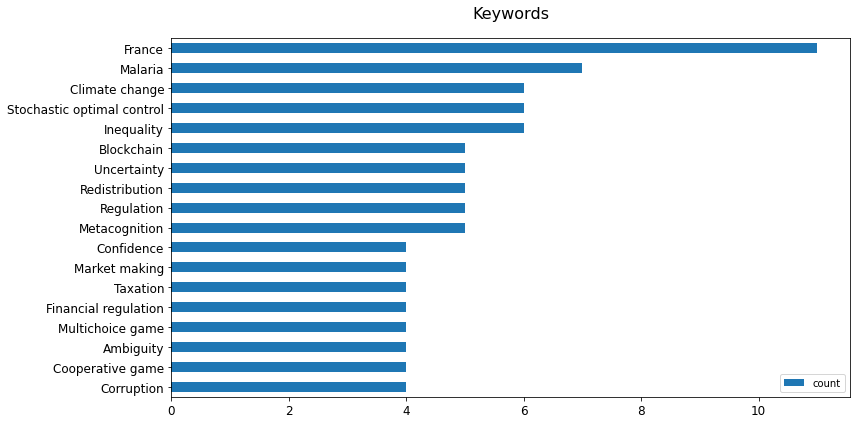

In [20]:
p = top_count_keywords.sort_values(by=['count'], ascending=True).plot(
    kind='barh',
    title='Keywords',
    x='keyword_s',
    y='count',
    xlabel='',
    ylabel='',
    figsize=(12, 6),
    rot=0,
    fontsize=12
)
p.set_title('Keywords', pad=20, fontdict={'fontsize': 16})
plt.tight_layout()
p.get_figure().savefig(f'./exports/keywords_repartition.png')

## Journals

### Journals occurrences 

In [21]:
journals = df[['journalTitle_s']].value_counts(dropna=False).to_frame(name='count').reset_index()
journals.to_csv(path_or_buf='./exports/journals.csv', index=False)
print(f'Number of journals : {journals["journalTitle_s"].size}')
journals.head(n=5)

Number of journals : 276


,journalTitle_s,count
0,Revue Economique,13
1,Journal of Mathematical Economics,10
2,Scientific Reports,7
3,Journal of Economic Behavior and Organization,7
4,Mathematical Social Sciences,6


In [22]:
top_count_journals = journals[journals['count'] >= 4].sort_values(by=['count'], ascending=False)
top_count_journals

,journalTitle_s,count
0,Revue Economique,13
1,Journal of Mathematical Economics,10
2,Scientific Reports,7
3,Journal of Economic Behavior and Organization,7
4,Mathematical Social Sciences,6
5,Revue d'Economie Politique,6
6,Soft Computing,6
7,Journal of Economic Theory,6
8,Revue française des affaires sociales,6
9,Economic Theory,6


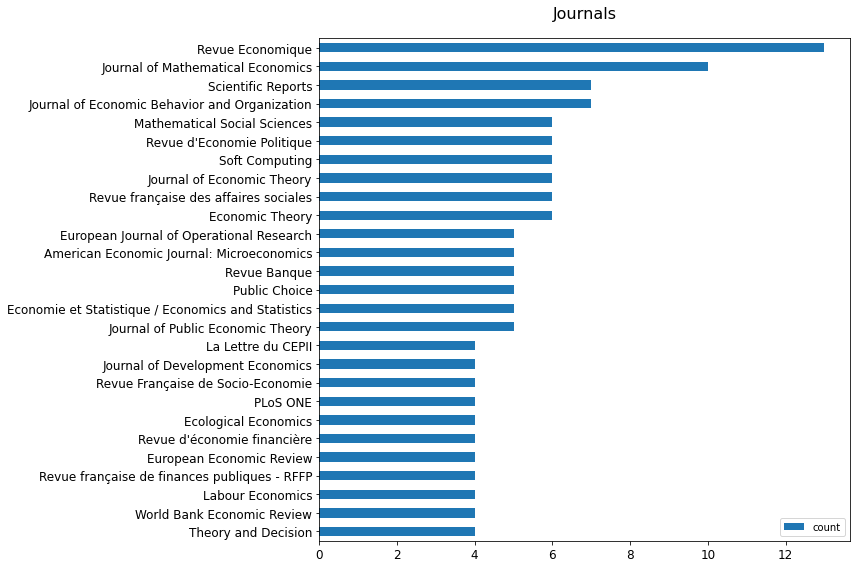

In [23]:
p = top_count_journals.sort_values(by=['count']).plot(
    kind='barh',
    title='Journals',
    x='journalTitle_s',
    y='count',
    xlabel='',
    ylabel='',
    figsize=(12, 8),
    fontsize=12
)
p.set_title('Journals', pad=20, fontdict={'fontsize': 16})
plt.tight_layout()
p.get_figure().savefig(f'./exports/journals_repartition.png')

### Journal without ISSN

In [24]:
journal_without_issns = df[df.journalIssn_s.isnull()][['uri_s', 'journalTitle_s']].reset_index(drop=True)
journal_without_issns.to_csv(f'./exports/journals_without_issn.csv', index=False)
journal_without_issns

,uri_s,journalTitle_s
0,https://hal.archives-ouvertes.fr/hal-01981066,P@ges Europe
1,https://hal.archives-ouvertes.fr/hal-02380958,JOURNAL OF CONSUMER PROTECTION AND FOOD SAFETY
2,https://hal.archives-ouvertes.fr/hal-02958766,Nature Human Behaviour
3,https://hal.archives-ouvertes.fr/hal-03171653,Journal of Global Economic Analysis
4,https://halshs.archives-ouvertes.fr/halshs-023...,INSEE Méthodes
5,https://hal.archives-ouvertes.fr/hal-01438848,Journal of Economics
6,https://hal.archives-ouvertes.fr/hal-03219314,Neue Gesellschaft Frankfurter Hefte
7,https://hal.archives-ouvertes.fr/hal-03219324,Education permanente
8,https://hal.archives-ouvertes.fr/hal-03219329,Personnel. La revue de l'ANDRH
9,https://hal.archives-ouvertes.fr/hal-03219320,Neue Gesellschaft Frankfurter Hefte


## JEL

In [25]:
# Number of Non NA Values
df[['uri_s', 'jel_s']].count()

uri_s    482
jel_s    201
dtype: int64

In [26]:
jels = df[['uri_s', 'jel_s']].explode('jel_s')
jels.to_csv(path_or_buf='./exports/jels.csv', index=False)
jels = jels.dropna()
jels

,uri_s,jel_s
9,https://hal.archives-ouvertes.fr/hal-01619040,C.C7.C70
9,https://hal.archives-ouvertes.fr/hal-01619040,D.D0.D01
9,https://hal.archives-ouvertes.fr/hal-01619040,D.D4.D44
9,https://hal.archives-ouvertes.fr/hal-01619040,D.D8.D83
9,https://hal.archives-ouvertes.fr/hal-01619040,D.D9.D91
...,...,...
478,https://halshs.archives-ouvertes.fr/halshs-023...,E.E3.E31
478,https://halshs.archives-ouvertes.fr/halshs-023...,E.E5.E52
479,https://halshs.archives-ouvertes.fr/halshs-032...,I.I3.I38
479,https://halshs.archives-ouvertes.fr/halshs-032...,H.H5.H53


In [27]:
jels['jel_s_code'] = jels['jel_s'].apply(lambda x: x.split('.')[0])
count_jels = jels.value_counts(subset=['jel_s_code']).to_frame(name='count').reset_index()
count_jels

,jel_s_code,count
0,D,128
1,C,105
2,J,66
3,O,55
4,G,52
5,F,43
6,E,41
7,H,34
8,Q,25
9,B,25


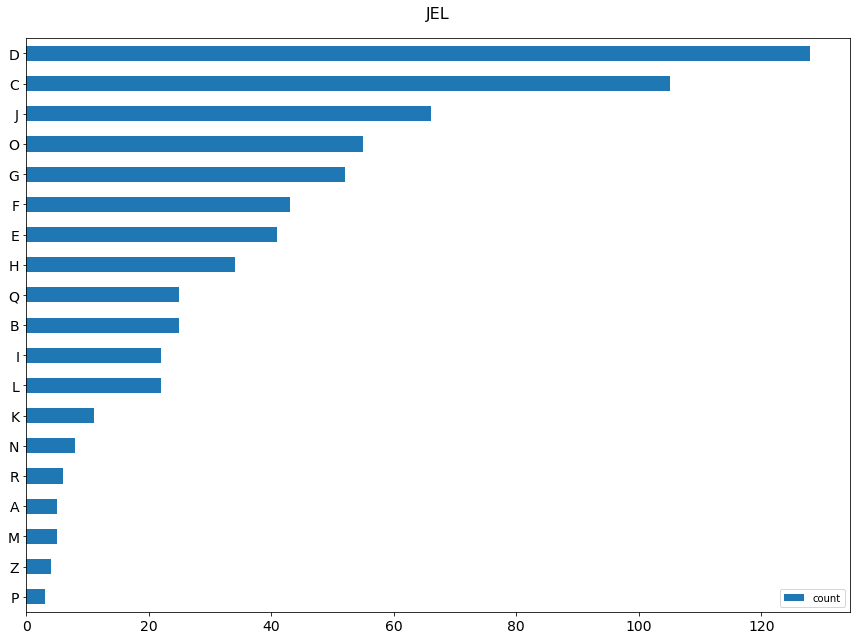

In [28]:
p = count_jels.sort_values(by=['count']).plot(
    kind='barh',
    title='JEL',
    x='jel_s_code',
    y='count',
    xlabel='',
    ylabel='',
    figsize=(12, 9),
    fontsize=14,
    rot=0,
)
p.set_title('JEL', pad=20, fontdict={'fontsize': 16})
plt.tight_layout()
p.get_figure().savefig(f'./exports/jel_first_level_repartition.png')

## Funding

In [29]:
def funding_stats(dataframe: pd.core.frame.DataFrame,
                  filename: str,
                  columns: List[str],
                  occurence_params: Dict[str, Any] = dict(),
                  repartition_params: Dict[str, Any] = dict()):
    print(f'==> Start processing funding for output filename "{filename}" based on columns : {columns}')
    
    # Extract dataframe data
    exploded = dataframe.explode(columns)
    exploded = exploded[['uri_s'] + columns]
    exploded.dropna().to_csv(path_or_buf=f'./exports/fundings_{filename}_uri.csv', index=False)
    print(f'  ==> Saving CSV to "./exports/fundings_{filename}_uri.csv" (number of rows: {len(exploded.dropna().index)})')
    
    # Occurences stats
    occurence_exploded = exploded[columns].value_counts(dropna=True).to_frame(name='count').reset_index()
    occurence_exploded.to_csv(path_or_buf=f'./exports/fundings_{filename}_occurence.csv', index=False)
    print(f'  ==> Saving CSV to "./exports/fundings_{filename}_occurence.csv" (number of rows: {len(occurence_exploded.index)})')
    if not occurence_exploded.empty:
        occurence_default_params = dict(
            kind='pie',
            subplots=True,
            sharex=False,
            sharey=False,
            title='Occurence',
            ylabel='',
            labels=occurence_exploded[columns[0]],
            figsize=(12, 12),
            autopct='%1.1f%%',
            pctdistance=0.85,
            rotatelabels=True,
            labeldistance=1.02
        )
        occurence_exploded['count'].plot(**{**occurence_default_params, **occurence_params})
        plt.tight_layout()
        plt.figure(1).savefig(f'./exports/fundings_{filename}_occurence.png')
        plt.show()
        print(f'  ==> Saving figure to "./exports/fundings_{filename}_occurence.png"')
    else:
        print(f'  ==> Skip figure of occurence for "{filename}" as the dataframe is empty')
        
    
    # Repartition of having value
    count_exploded = exploded.dropna()[['uri_s']].value_counts().to_frame(name='count').reset_index()
    count_exploded = dataframe.merge(count_exploded, how='left', on='uri_s')
    count_exploded = count_exploded[['uri_s', 'count']].fillna(0).astype({'count': int}).drop_duplicates()
    count_exploded.to_csv(path_or_buf=f'./exports/fundings_{filename}_count.csv', index=False)
    print(f'Saving CSV to : ./exports/fundings_{filename}_count.csv (number of rows: {len(count_exploded.index)})')
    
    repartition_count_exploded = count_exploded[['count']].value_counts().to_frame(name='number_of_count').reset_index()
    repartition_count_exploded.to_csv(path_or_buf=f'./exports/fundings_{filename}_repartition.csv', index=False)
    print(f'Saving CSV to : ./exports/fundings_{filename}_repartition.csv (number of rows: {len(repartition_count_exploded.index)})')
    
    if not repartition_count_exploded.empty:
        repartition_default_params = dict(
            kind='pie',
            subplots=True,
            sharex=False,
            sharey=False,
            title='Repartition',
            ylabel='',
            labels=repartition_count_exploded['count'],
            figsize=(12, 12),
            autopct=lambda p: '{total} ({p:.2f}%)'.format(p=p, total=round(p * repartition_count_exploded['number_of_count'].sum() / 100)),
            pctdistance=0.8,
        )
        repartition_count_exploded['number_of_count'].plot(**{**repartition_default_params, **repartition_params})
        plt.tight_layout()
        plt.figure(1).savefig(f'./exports/fundings_{filename}_repartition.png')
        plt.show()
        print(f'Saving figure to "./exports/fundings_{filename}_repartition.png"')
    else:
        print(f'  ==> Skip figure of repartition for "{filename}" as the dataframe is empty')
    
    print(f'==> End processing funding for filemane "{filename}" outputs')


### Global

#### ANR

==> Start processing funding for output filename "anr_global" based on columns : ['anrProjectAcronym_s', 'anrProjectReference_s']
  ==> Saving CSV to "./exports/fundings_anr_global_uri.csv" (number of rows: 120)
  ==> Saving CSV to "./exports/fundings_anr_global_occurence.csv" (number of rows: 42)


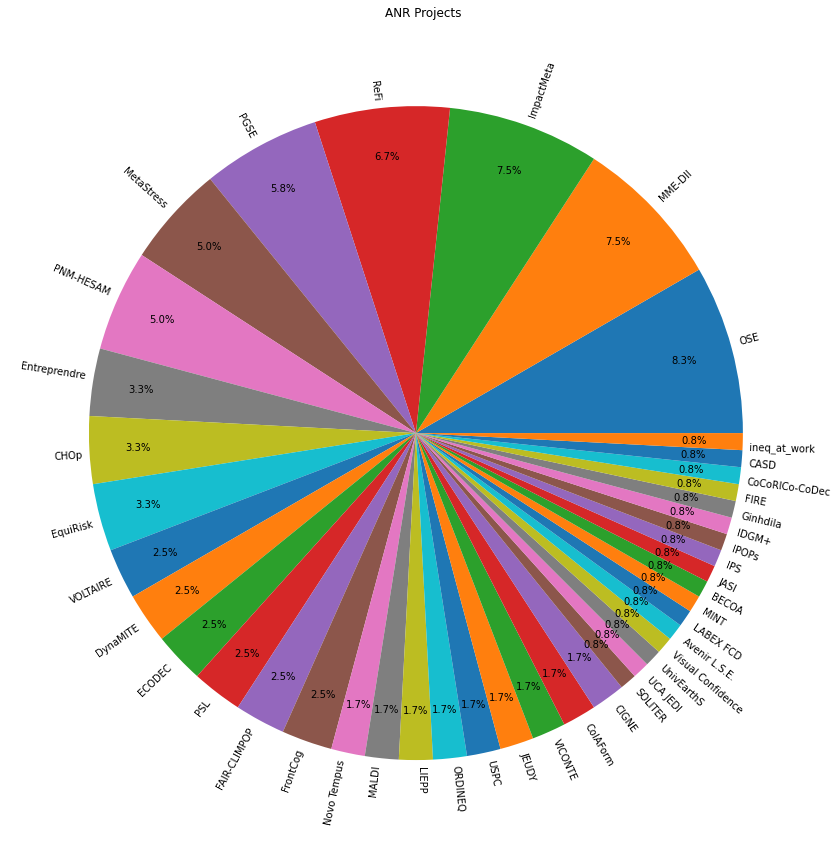

  ==> Saving figure to "./exports/fundings_anr_global_occurence.png"
Saving CSV to : ./exports/fundings_anr_global_count.csv (number of rows: 482)
Saving CSV to : ./exports/fundings_anr_global_repartition.csv (number of rows: 5)


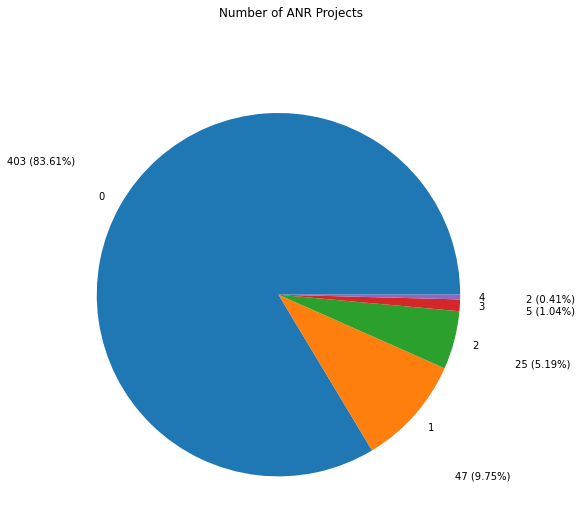

Saving figure to "./exports/fundings_anr_global_repartition.png"
==> End processing funding for filemane "anr_global" outputs


In [30]:
funding_stats(
    dataframe=df,
    columns=['anrProjectAcronym_s', 'anrProjectReference_s'],
    filename='anr_global',
    occurence_params=dict(title='ANR Projects'),
    repartition_params=dict(title='Number of ANR Projects', figsize=(8,8), pctdistance=1.5),
)

#### European

==> Start processing funding for output filename "european_global" based on columns : ['europeanProjectAcronym_s', 'europeanProjectReference_s']
  ==> Saving CSV to "./exports/fundings_european_global_uri.csv" (number of rows: 42)
  ==> Saving CSV to "./exports/fundings_european_global_occurence.csv" (number of rows: 27)


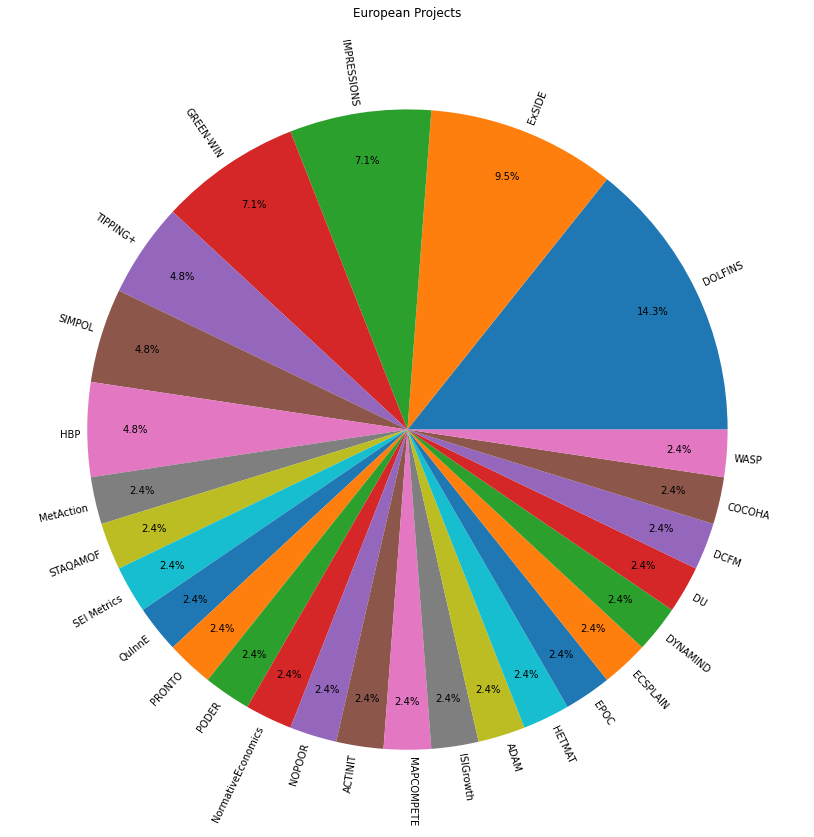

  ==> Saving figure to "./exports/fundings_european_global_occurence.png"
Saving CSV to : ./exports/fundings_european_global_count.csv (number of rows: 482)
Saving CSV to : ./exports/fundings_european_global_repartition.csv (number of rows: 5)


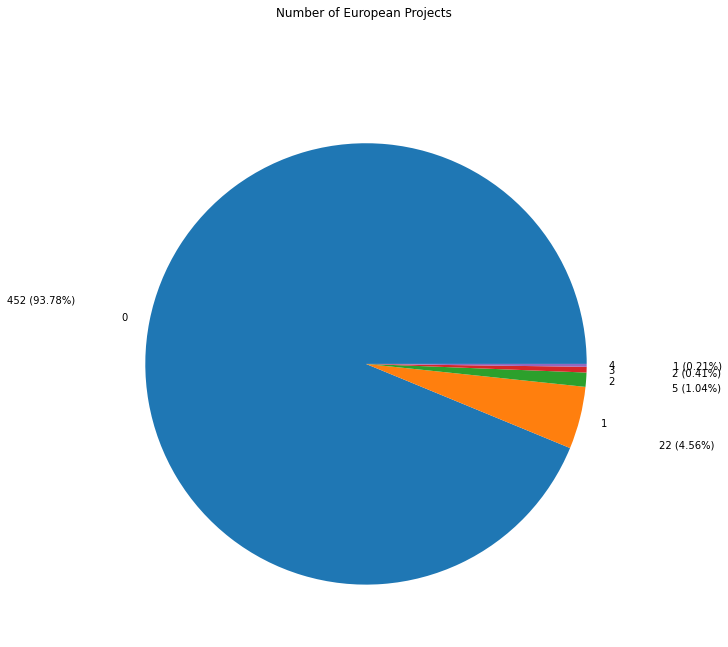

Saving figure to "./exports/fundings_european_global_repartition.png"
==> End processing funding for filemane "european_global" outputs


In [31]:
funding_stats(
    dataframe=df,
    columns=['europeanProjectAcronym_s', 'europeanProjectReference_s'],
    filename='european_global',
    occurence_params=dict(title='European Projects'),
    repartition_params=dict(title='Number of European Projects', figsize=(10,10), pctdistance=1.5),
)

#### Others

In [32]:
other_fundings = df.explode(['funding_s'])
other_fundings = other_fundings[['uri_s', 'funding_s']]
other_fundings.dropna().to_csv(path_or_buf='./exports/fundings_other_uri.csv', index=False)
other_fundings = other_fundings[['funding_s']].value_counts(dropna=False).to_frame(name='count').reset_index()
other_fundings.to_csv(path_or_buf='./exports/fundings_other_stats.csv', index=False)
other_fundings.head(n=5)

,funding_s,count
0,NaN,383
1,This work was achieved through the Laboratory ...,2
2,This research was supported by FONDECYT MetaDy...,1
3,This work was achieved through studies conduct...,1
4,This work benefited from the support of the En...,1


### By Teams


For each `EQUIPE`, we will retrieve the number of ANR and European projects

#### ANR

=> process team: N/A
==> Start processing funding for output filename "anr_by_teams_N_A_" based on columns : ['anrProjectAcronym_s', 'anrProjectReference_s']
  ==> Saving CSV to "./exports/fundings_anr_by_teams_N_A__uri.csv" (number of rows: 0)
  ==> Saving CSV to "./exports/fundings_anr_by_teams_N_A__occurence.csv" (number of rows: 0)
  ==> Skip figure of occurence for "anr_by_teams_N_A_" as the dataframe is empty
Saving CSV to : ./exports/fundings_anr_by_teams_N_A__count.csv (number of rows: 5)
Saving CSV to : ./exports/fundings_anr_by_teams_N_A__repartition.csv (number of rows: 1)


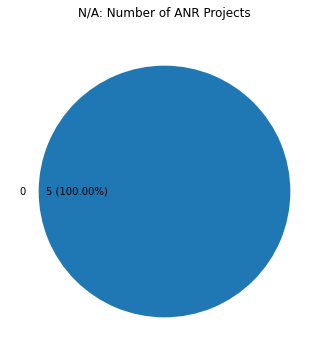

Saving figure to "./exports/fundings_anr_by_teams_N_A__repartition.png"
==> End processing funding for filemane "anr_by_teams_N_A_" outputs
=> process team: globalisation financière
==> Start processing funding for output filename "anr_by_teams_globalisation_financiere_" based on columns : ['anrProjectAcronym_s', 'anrProjectReference_s']
  ==> Saving CSV to "./exports/fundings_anr_by_teams_globalisation_financiere__uri.csv" (number of rows: 9)
  ==> Saving CSV to "./exports/fundings_anr_by_teams_globalisation_financiere__occurence.csv" (number of rows: 5)


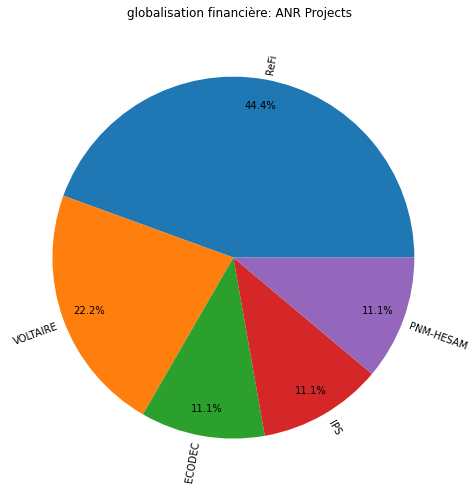

  ==> Saving figure to "./exports/fundings_anr_by_teams_globalisation_financiere__occurence.png"
Saving CSV to : ./exports/fundings_anr_by_teams_globalisation_financiere__count.csv (number of rows: 57)
Saving CSV to : ./exports/fundings_anr_by_teams_globalisation_financiere__repartition.csv (number of rows: 3)


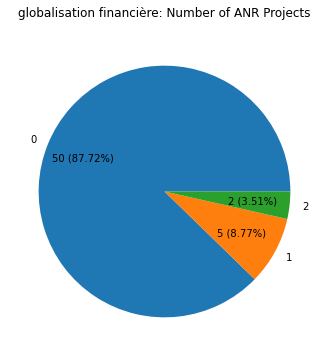

Saving figure to "./exports/fundings_anr_by_teams_globalisation_financiere__repartition.png"
==> End processing funding for filemane "anr_by_teams_globalisation_financiere_" outputs
=> process team: microéconomie théorique
==> Start processing funding for output filename "anr_by_teams_microeconomie_theorique_" based on columns : ['anrProjectAcronym_s', 'anrProjectReference_s']
  ==> Saving CSV to "./exports/fundings_anr_by_teams_microeconomie_theorique__uri.csv" (number of rows: 56)
  ==> Saving CSV to "./exports/fundings_anr_by_teams_microeconomie_theorique__occurence.csv" (number of rows: 22)


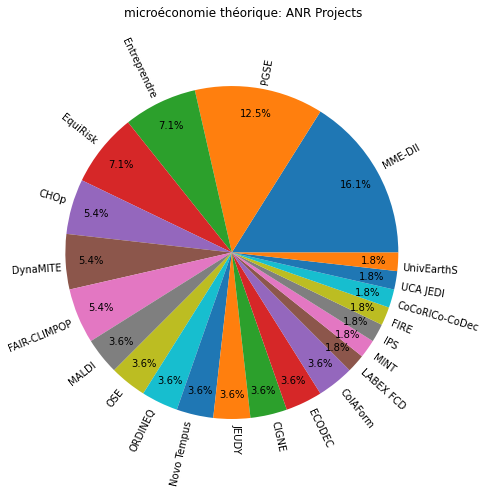

  ==> Saving figure to "./exports/fundings_anr_by_teams_microeconomie_theorique__occurence.png"
Saving CSV to : ./exports/fundings_anr_by_teams_microeconomie_theorique__count.csv (number of rows: 115)
Saving CSV to : ./exports/fundings_anr_by_teams_microeconomie_theorique__repartition.csv (number of rows: 4)


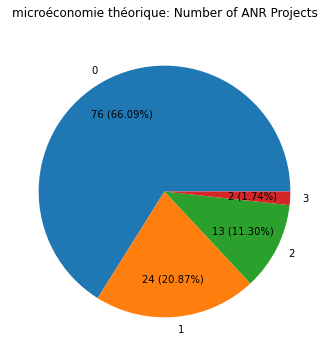

Saving figure to "./exports/fundings_anr_by_teams_microeconomie_theorique__repartition.png"
==> End processing funding for filemane "anr_by_teams_microeconomie_theorique_" outputs
=> process team: modélisation financière
==> Start processing funding for output filename "anr_by_teams_modelisation_financiere_" based on columns : ['anrProjectAcronym_s', 'anrProjectReference_s']
  ==> Saving CSV to "./exports/fundings_anr_by_teams_modelisation_financiere__uri.csv" (number of rows: 11)
  ==> Saving CSV to "./exports/fundings_anr_by_teams_modelisation_financiere__occurence.csv" (number of rows: 2)


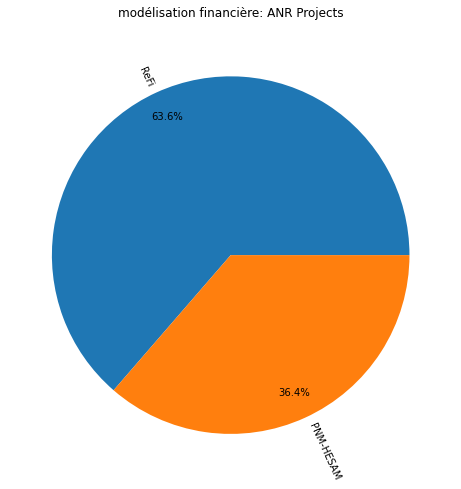

  ==> Saving figure to "./exports/fundings_anr_by_teams_modelisation_financiere__occurence.png"
Saving CSV to : ./exports/fundings_anr_by_teams_modelisation_financiere__count.csv (number of rows: 51)
Saving CSV to : ./exports/fundings_anr_by_teams_modelisation_financiere__repartition.csv (number of rows: 3)


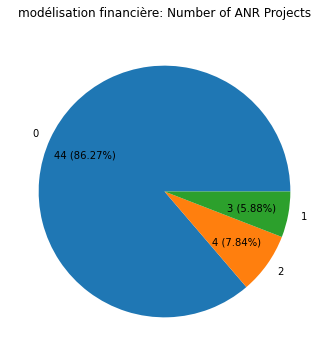

Saving figure to "./exports/fundings_anr_by_teams_modelisation_financiere__repartition.png"
==> End processing funding for filemane "anr_by_teams_modelisation_financiere_" outputs
=> process team: politiques publiques
==> Start processing funding for output filename "anr_by_teams_politiques_publiques_" based on columns : ['anrProjectAcronym_s', 'anrProjectReference_s']
  ==> Saving CSV to "./exports/fundings_anr_by_teams_politiques_publiques__uri.csv" (number of rows: 1)
  ==> Saving CSV to "./exports/fundings_anr_by_teams_politiques_publiques__occurence.csv" (number of rows: 1)


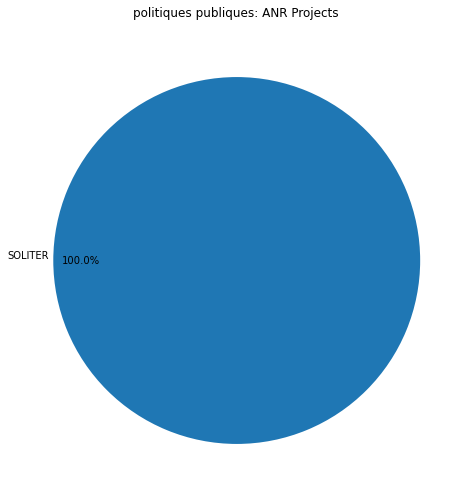

  ==> Saving figure to "./exports/fundings_anr_by_teams_politiques_publiques__occurence.png"
Saving CSV to : ./exports/fundings_anr_by_teams_politiques_publiques__count.csv (number of rows: 31)
Saving CSV to : ./exports/fundings_anr_by_teams_politiques_publiques__repartition.csv (number of rows: 2)


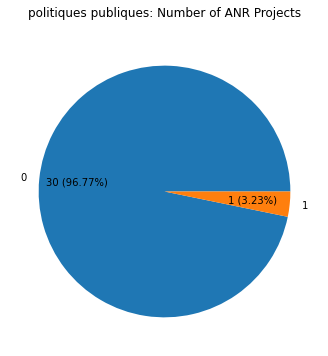

Saving figure to "./exports/fundings_anr_by_teams_politiques_publiques__repartition.png"
==> End processing funding for filemane "anr_by_teams_politiques_publiques_" outputs
=> process team: sciences du comportement
==> Start processing funding for output filename "anr_by_teams_sciences_du_comportement_" based on columns : ['anrProjectAcronym_s', 'anrProjectReference_s']
  ==> Saving CSV to "./exports/fundings_anr_by_teams_sciences_du_comportement__uri.csv" (number of rows: 40)
  ==> Saving CSV to "./exports/fundings_anr_by_teams_sciences_du_comportement__occurence.csv" (number of rows: 16)


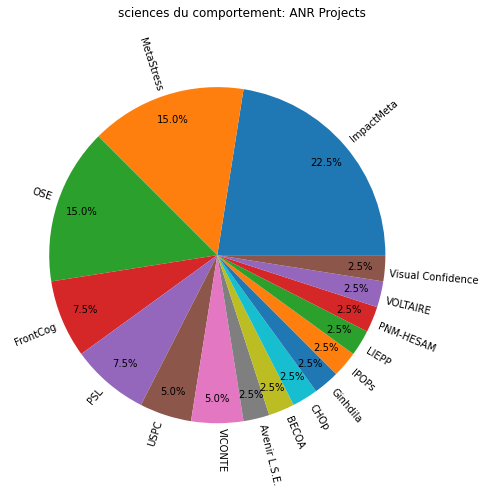

  ==> Saving figure to "./exports/fundings_anr_by_teams_sciences_du_comportement__occurence.png"
Saving CSV to : ./exports/fundings_anr_by_teams_sciences_du_comportement__count.csv (number of rows: 72)
Saving CSV to : ./exports/fundings_anr_by_teams_sciences_du_comportement__repartition.csv (number of rows: 5)


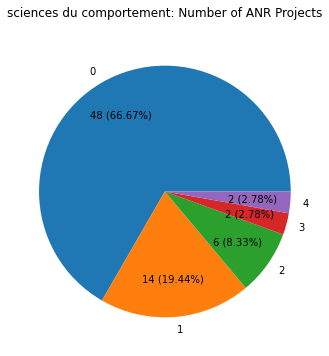

Saving figure to "./exports/fundings_anr_by_teams_sciences_du_comportement__repartition.png"
==> End processing funding for filemane "anr_by_teams_sciences_du_comportement_" outputs
=> process team: économie du développement
==> Start processing funding for output filename "anr_by_teams_economie_du_developpement_" based on columns : ['anrProjectAcronym_s', 'anrProjectReference_s']
  ==> Saving CSV to "./exports/fundings_anr_by_teams_economie_du_developpement__uri.csv" (number of rows: 5)
  ==> Saving CSV to "./exports/fundings_anr_by_teams_economie_du_developpement__occurence.csv" (number of rows: 4)


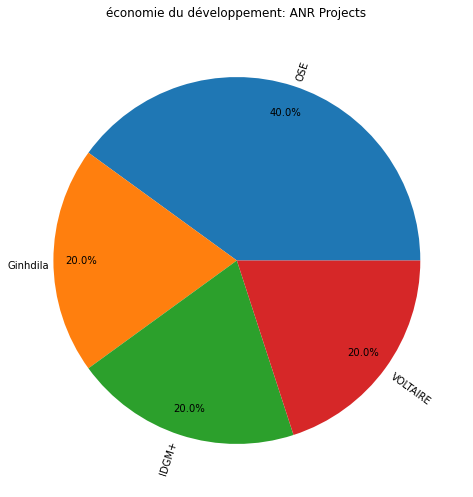

  ==> Saving figure to "./exports/fundings_anr_by_teams_economie_du_developpement__occurence.png"
Saving CSV to : ./exports/fundings_anr_by_teams_economie_du_developpement__count.csv (number of rows: 41)
Saving CSV to : ./exports/fundings_anr_by_teams_economie_du_developpement__repartition.csv (number of rows: 2)


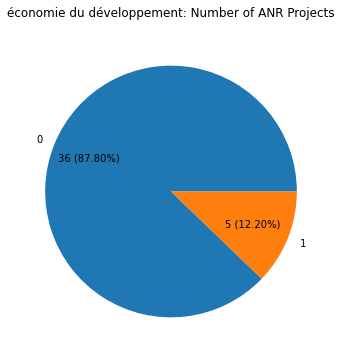

Saving figure to "./exports/fundings_anr_by_teams_economie_du_developpement__repartition.png"
==> End processing funding for filemane "anr_by_teams_economie_du_developpement_" outputs
=> process team: économie internationale
==> Start processing funding for output filename "anr_by_teams_economie_internationale_" based on columns : ['anrProjectAcronym_s', 'anrProjectReference_s']
  ==> Saving CSV to "./exports/fundings_anr_by_teams_economie_internationale__uri.csv" (number of rows: 5)
  ==> Saving CSV to "./exports/fundings_anr_by_teams_economie_internationale__occurence.csv" (number of rows: 5)


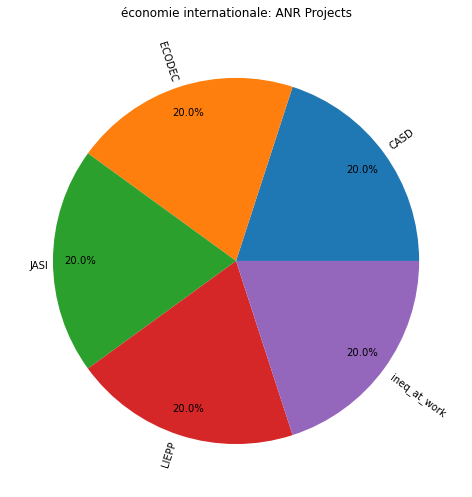

  ==> Saving figure to "./exports/fundings_anr_by_teams_economie_internationale__occurence.png"
Saving CSV to : ./exports/fundings_anr_by_teams_economie_internationale__count.csv (number of rows: 46)
Saving CSV to : ./exports/fundings_anr_by_teams_economie_internationale__repartition.csv (number of rows: 3)


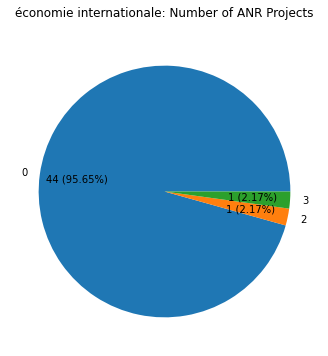

Saving figure to "./exports/fundings_anr_by_teams_economie_internationale__repartition.png"
==> End processing funding for filemane "anr_by_teams_economie_internationale_" outputs
=> process team: économie politique
==> Start processing funding for output filename "anr_by_teams_economie_politique_" based on columns : ['anrProjectAcronym_s', 'anrProjectReference_s']
  ==> Saving CSV to "./exports/fundings_anr_by_teams_economie_politique__uri.csv" (number of rows: 2)
  ==> Saving CSV to "./exports/fundings_anr_by_teams_economie_politique__occurence.csv" (number of rows: 2)


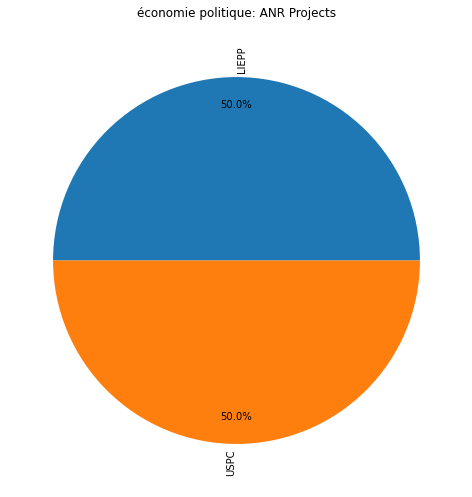

  ==> Saving figure to "./exports/fundings_anr_by_teams_economie_politique__occurence.png"
Saving CSV to : ./exports/fundings_anr_by_teams_economie_politique__count.csv (number of rows: 83)
Saving CSV to : ./exports/fundings_anr_by_teams_economie_politique__repartition.csv (number of rows: 2)


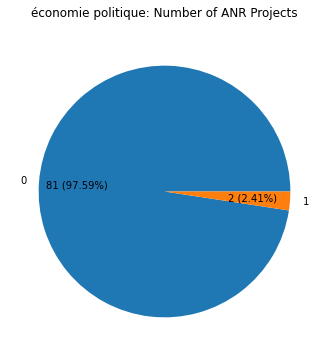

Saving figure to "./exports/fundings_anr_by_teams_economie_politique__repartition.png"
==> End processing funding for filemane "anr_by_teams_economie_politique_" outputs
All teams have been process


In [33]:
for _team_name in teams['EQUIPE'].tolist():
    _team_filename_part = NON_ALPHA_NUMERIC_REGEX.sub("_", unidecode.unidecode(_team_name))
    print(f'=> process team: {_team_name}')
    # Proportions of ANR funding
    by_teams_df = dft.merge(df, on='uri_s')
    by_teams_df = by_teams_df[(by_teams_df.EQUIPE == _team_name)]
    by_teams_df = by_teams_df.drop_duplicates(subset=['uri_s'], ignore_index=True)
    funding_stats(
        dataframe=by_teams_df,
        columns=['anrProjectAcronym_s', 'anrProjectReference_s'],
        filename=f'anr_by_teams_{_team_filename_part}_',
        occurence_params=dict(title=f'{_team_name}: ANR Projects', figsize=(7,7), pctdistance=0.85, labeldistance=1.025),
        repartition_params=dict(title=f'{_team_name}: Number of ANR Projects', figsize=(5,5), pctdistance=0.7),
    )
print('All teams have been process')

#### European

=> process team: N/A
==> Start processing funding for output filename "european_by_teams_N_A" based on columns : ['europeanProjectAcronym_s', 'europeanProjectReference_s']
  ==> Saving CSV to "./exports/fundings_european_by_teams_N_A_uri.csv" (number of rows: 0)
  ==> Saving CSV to "./exports/fundings_european_by_teams_N_A_occurence.csv" (number of rows: 0)
  ==> Skip figure of occurence for "european_by_teams_N_A" as the dataframe is empty
Saving CSV to : ./exports/fundings_european_by_teams_N_A_count.csv (number of rows: 5)
Saving CSV to : ./exports/fundings_european_by_teams_N_A_repartition.csv (number of rows: 1)


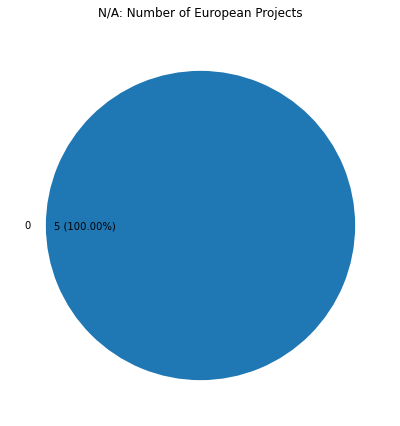

Saving figure to "./exports/fundings_european_by_teams_N_A_repartition.png"
==> End processing funding for filemane "european_by_teams_N_A" outputs
=> process team: globalisation financière
==> Start processing funding for output filename "european_by_teams_globalisation_financiere" based on columns : ['europeanProjectAcronym_s', 'europeanProjectReference_s']
  ==> Saving CSV to "./exports/fundings_european_by_teams_globalisation_financiere_uri.csv" (number of rows: 0)
  ==> Saving CSV to "./exports/fundings_european_by_teams_globalisation_financiere_occurence.csv" (number of rows: 0)
  ==> Skip figure of occurence for "european_by_teams_globalisation_financiere" as the dataframe is empty
Saving CSV to : ./exports/fundings_european_by_teams_globalisation_financiere_count.csv (number of rows: 57)
Saving CSV to : ./exports/fundings_european_by_teams_globalisation_financiere_repartition.csv (number of rows: 1)


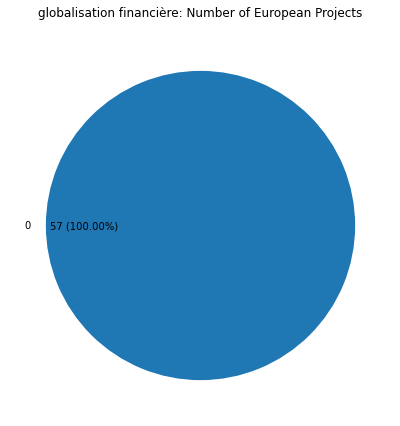

Saving figure to "./exports/fundings_european_by_teams_globalisation_financiere_repartition.png"
==> End processing funding for filemane "european_by_teams_globalisation_financiere" outputs
=> process team: microéconomie théorique
==> Start processing funding for output filename "european_by_teams_microeconomie_theorique" based on columns : ['europeanProjectAcronym_s', 'europeanProjectReference_s']
  ==> Saving CSV to "./exports/fundings_european_by_teams_microeconomie_theorique_uri.csv" (number of rows: 25)
  ==> Saving CSV to "./exports/fundings_european_by_teams_microeconomie_theorique_occurence.csv" (number of rows: 11)


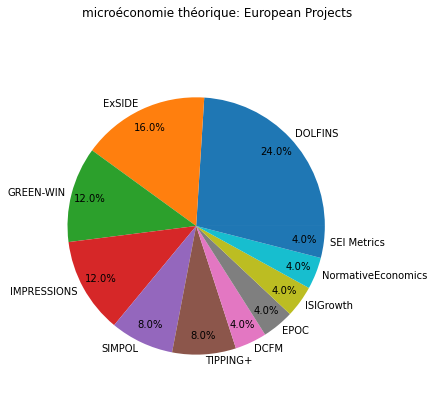

  ==> Saving figure to "./exports/fundings_european_by_teams_microeconomie_theorique_occurence.png"
Saving CSV to : ./exports/fundings_european_by_teams_microeconomie_theorique_count.csv (number of rows: 115)
Saving CSV to : ./exports/fundings_european_by_teams_microeconomie_theorique_repartition.csv (number of rows: 5)


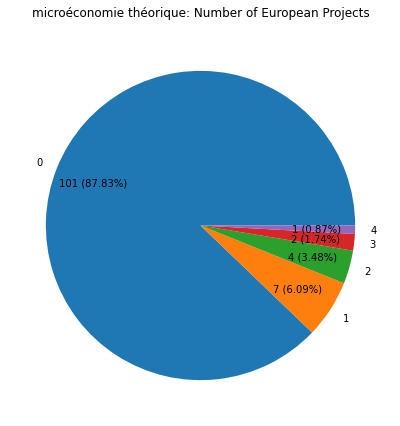

Saving figure to "./exports/fundings_european_by_teams_microeconomie_theorique_repartition.png"
==> End processing funding for filemane "european_by_teams_microeconomie_theorique" outputs
=> process team: modélisation financière
==> Start processing funding for output filename "european_by_teams_modelisation_financiere" based on columns : ['europeanProjectAcronym_s', 'europeanProjectReference_s']
  ==> Saving CSV to "./exports/fundings_european_by_teams_modelisation_financiere_uri.csv" (number of rows: 1)
  ==> Saving CSV to "./exports/fundings_european_by_teams_modelisation_financiere_occurence.csv" (number of rows: 1)


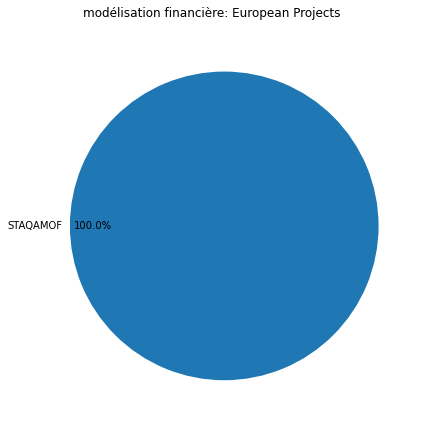

  ==> Saving figure to "./exports/fundings_european_by_teams_modelisation_financiere_occurence.png"
Saving CSV to : ./exports/fundings_european_by_teams_modelisation_financiere_count.csv (number of rows: 51)
Saving CSV to : ./exports/fundings_european_by_teams_modelisation_financiere_repartition.csv (number of rows: 2)


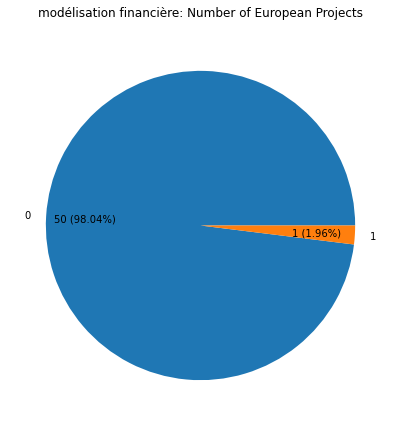

Saving figure to "./exports/fundings_european_by_teams_modelisation_financiere_repartition.png"
==> End processing funding for filemane "european_by_teams_modelisation_financiere" outputs
=> process team: politiques publiques
==> Start processing funding for output filename "european_by_teams_politiques_publiques" based on columns : ['europeanProjectAcronym_s', 'europeanProjectReference_s']
  ==> Saving CSV to "./exports/fundings_european_by_teams_politiques_publiques_uri.csv" (number of rows: 0)
  ==> Saving CSV to "./exports/fundings_european_by_teams_politiques_publiques_occurence.csv" (number of rows: 0)
  ==> Skip figure of occurence for "european_by_teams_politiques_publiques" as the dataframe is empty
Saving CSV to : ./exports/fundings_european_by_teams_politiques_publiques_count.csv (number of rows: 31)
Saving CSV to : ./exports/fundings_european_by_teams_politiques_publiques_repartition.csv (number of rows: 1)


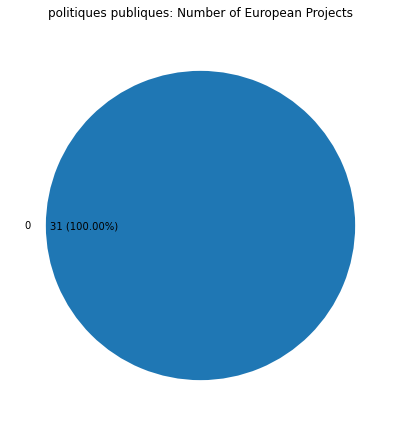

Saving figure to "./exports/fundings_european_by_teams_politiques_publiques_repartition.png"
==> End processing funding for filemane "european_by_teams_politiques_publiques" outputs
=> process team: sciences du comportement
==> Start processing funding for output filename "european_by_teams_sciences_du_comportement" based on columns : ['europeanProjectAcronym_s', 'europeanProjectReference_s']
  ==> Saving CSV to "./exports/fundings_european_by_teams_sciences_du_comportement_uri.csv" (number of rows: 9)
  ==> Saving CSV to "./exports/fundings_european_by_teams_sciences_du_comportement_occurence.csv" (number of rows: 8)


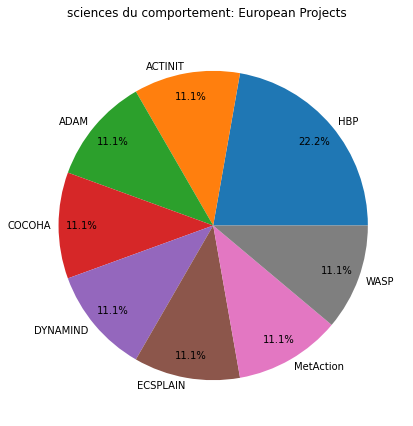

  ==> Saving figure to "./exports/fundings_european_by_teams_sciences_du_comportement_occurence.png"
Saving CSV to : ./exports/fundings_european_by_teams_sciences_du_comportement_count.csv (number of rows: 72)
Saving CSV to : ./exports/fundings_european_by_teams_sciences_du_comportement_repartition.csv (number of rows: 3)


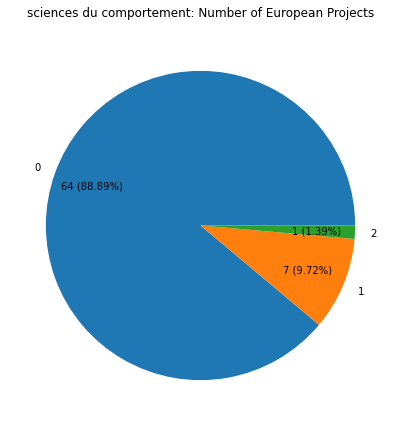

Saving figure to "./exports/fundings_european_by_teams_sciences_du_comportement_repartition.png"
==> End processing funding for filemane "european_by_teams_sciences_du_comportement" outputs
=> process team: économie du développement
==> Start processing funding for output filename "european_by_teams_economie_du_developpement" based on columns : ['europeanProjectAcronym_s', 'europeanProjectReference_s']
  ==> Saving CSV to "./exports/fundings_european_by_teams_economie_du_developpement_uri.csv" (number of rows: 3)
  ==> Saving CSV to "./exports/fundings_european_by_teams_economie_du_developpement_occurence.csv" (number of rows: 3)


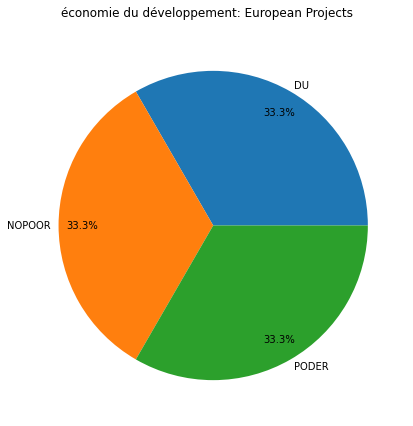

  ==> Saving figure to "./exports/fundings_european_by_teams_economie_du_developpement_occurence.png"
Saving CSV to : ./exports/fundings_european_by_teams_economie_du_developpement_count.csv (number of rows: 41)
Saving CSV to : ./exports/fundings_european_by_teams_economie_du_developpement_repartition.csv (number of rows: 2)


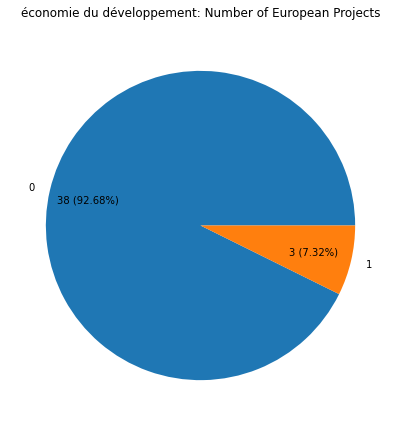

Saving figure to "./exports/fundings_european_by_teams_economie_du_developpement_repartition.png"
==> End processing funding for filemane "european_by_teams_economie_du_developpement" outputs
=> process team: économie internationale
==> Start processing funding for output filename "european_by_teams_economie_internationale" based on columns : ['europeanProjectAcronym_s', 'europeanProjectReference_s']
  ==> Saving CSV to "./exports/fundings_european_by_teams_economie_internationale_uri.csv" (number of rows: 3)
  ==> Saving CSV to "./exports/fundings_european_by_teams_economie_internationale_occurence.csv" (number of rows: 3)


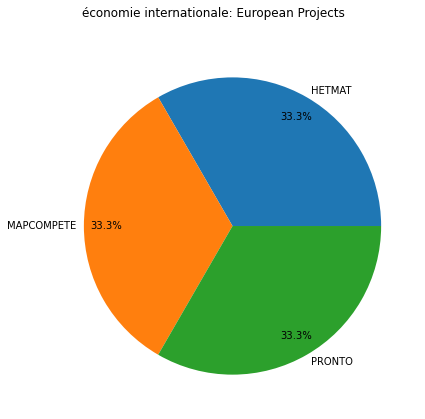

  ==> Saving figure to "./exports/fundings_european_by_teams_economie_internationale_occurence.png"
Saving CSV to : ./exports/fundings_european_by_teams_economie_internationale_count.csv (number of rows: 46)
Saving CSV to : ./exports/fundings_european_by_teams_economie_internationale_repartition.csv (number of rows: 2)


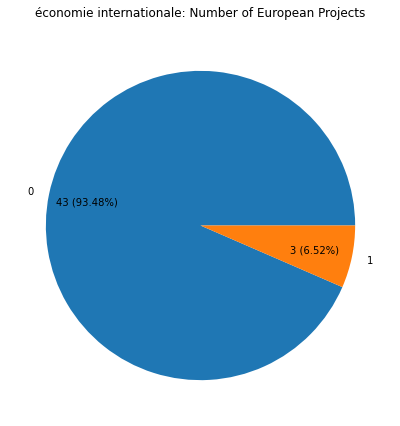

Saving figure to "./exports/fundings_european_by_teams_economie_internationale_repartition.png"
==> End processing funding for filemane "european_by_teams_economie_internationale" outputs
=> process team: économie politique
==> Start processing funding for output filename "european_by_teams_economie_politique" based on columns : ['europeanProjectAcronym_s', 'europeanProjectReference_s']
  ==> Saving CSV to "./exports/fundings_european_by_teams_economie_politique_uri.csv" (number of rows: 1)
  ==> Saving CSV to "./exports/fundings_european_by_teams_economie_politique_occurence.csv" (number of rows: 1)


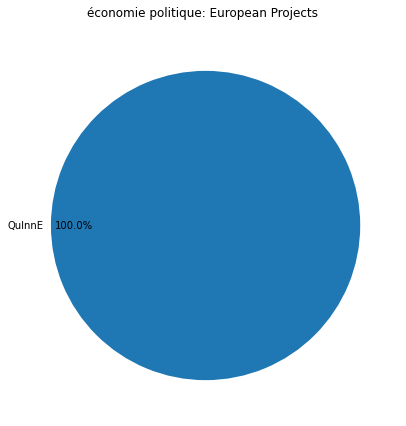

  ==> Saving figure to "./exports/fundings_european_by_teams_economie_politique_occurence.png"
Saving CSV to : ./exports/fundings_european_by_teams_economie_politique_count.csv (number of rows: 83)
Saving CSV to : ./exports/fundings_european_by_teams_economie_politique_repartition.csv (number of rows: 2)


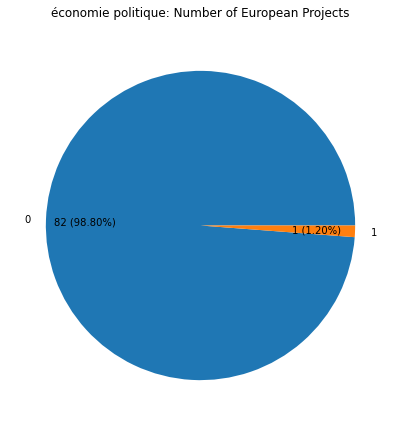

Saving figure to "./exports/fundings_european_by_teams_economie_politique_repartition.png"
==> End processing funding for filemane "european_by_teams_economie_politique" outputs
All teams have been process


In [34]:
# With multiples co
for _team_name in teams['EQUIPE'].tolist():
    _team_filename_part = NON_ALPHA_NUMERIC_REGEX.sub("_", unidecode.unidecode(_team_name))
    print(f'=> process team: {_team_name}')
    # Proportions of European funding
    by_teams_df = df.merge(dft, on='uri_s')
    by_teams_df = by_teams_df[(by_teams_df.EQUIPE == _team_name)]
    by_teams_df = by_teams_df.drop_duplicates(subset=['uri_s'], ignore_index=True)
    funding_stats(
        dataframe=by_teams_df,
        columns=['europeanProjectAcronym_s', 'europeanProjectReference_s'],
        filename=f'european_by_teams_{_team_filename_part}',
        occurence_params=dict(title=f'{_team_name}: European Projects', figsize=(6,6), pctdistance=0.85, rotatelabels=False, labeldistance=1.05),
        repartition_params=dict(title=f'{_team_name}: Number of European Projects', figsize=(6,6), pctdistance=0.75),
    )
print('All teams have been process')

### By Themes

#### ANR

=> process theme: N/A
==> Start processing funding for output filename "anr_by_themes_N_A" based on columns : ['anrProjectAcronym_s', 'anrProjectReference_s']
  ==> Saving CSV to "./exports/fundings_anr_by_themes_N_A_uri.csv" (number of rows: 0)
  ==> Saving CSV to "./exports/fundings_anr_by_themes_N_A_occurence.csv" (number of rows: 0)
  ==> Skip figure of occurence for "anr_by_themes_N_A" as the dataframe is empty
Saving CSV to : ./exports/fundings_anr_by_themes_N_A_count.csv (number of rows: 5)
Saving CSV to : ./exports/fundings_anr_by_themes_N_A_repartition.csv (number of rows: 1)


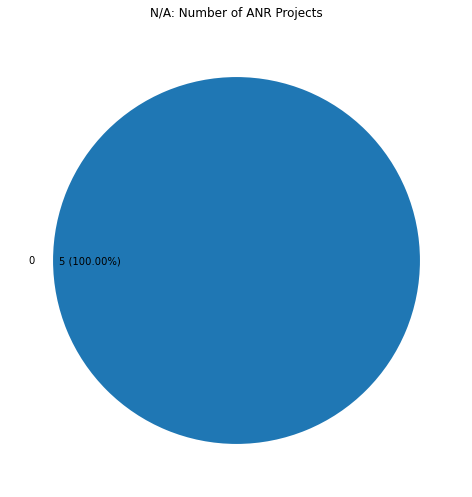

Saving figure to "./exports/fundings_anr_by_themes_N_A_repartition.png"
==> End processing funding for filemane "anr_by_themes_N_A" outputs
=> process theme: thème 2
==> Start processing funding for output filename "anr_by_themes_theme_2" based on columns : ['anrProjectAcronym_s', 'anrProjectReference_s']
  ==> Saving CSV to "./exports/fundings_anr_by_themes_theme_2_uri.csv" (number of rows: 19)
  ==> Saving CSV to "./exports/fundings_anr_by_themes_theme_2_occurence.csv" (number of rows: 12)


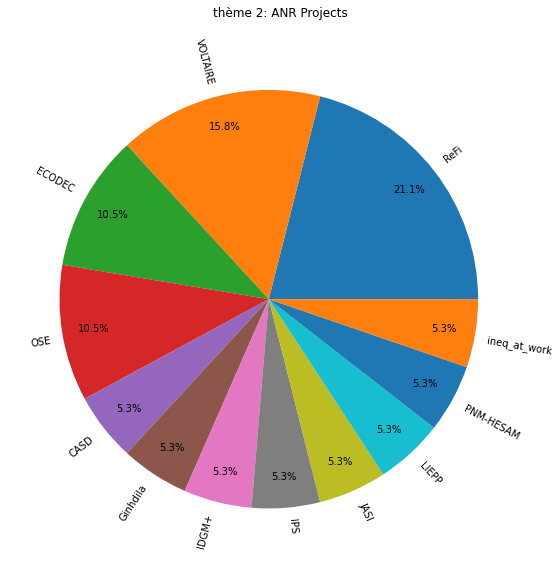

  ==> Saving figure to "./exports/fundings_anr_by_themes_theme_2_occurence.png"
Saving CSV to : ./exports/fundings_anr_by_themes_theme_2_count.csv (number of rows: 142)
Saving CSV to : ./exports/fundings_anr_by_themes_theme_2_repartition.csv (number of rows: 4)


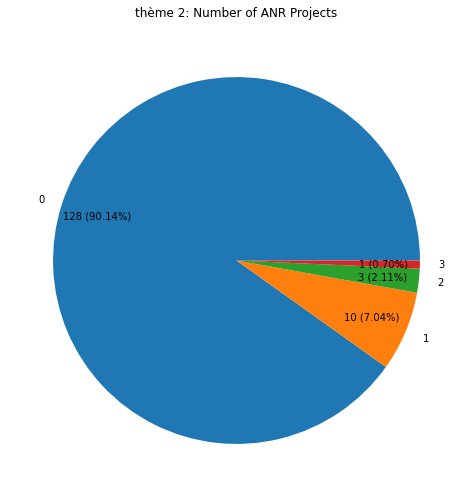

Saving figure to "./exports/fundings_anr_by_themes_theme_2_repartition.png"
==> End processing funding for filemane "anr_by_themes_theme_2" outputs
=> process theme: thème 1
==> Start processing funding for output filename "anr_by_themes_theme_1" based on columns : ['anrProjectAcronym_s', 'anrProjectReference_s']
  ==> Saving CSV to "./exports/fundings_anr_by_themes_theme_1_uri.csv" (number of rows: 107)
  ==> Saving CSV to "./exports/fundings_anr_by_themes_theme_1_occurence.csv" (number of rows: 37)


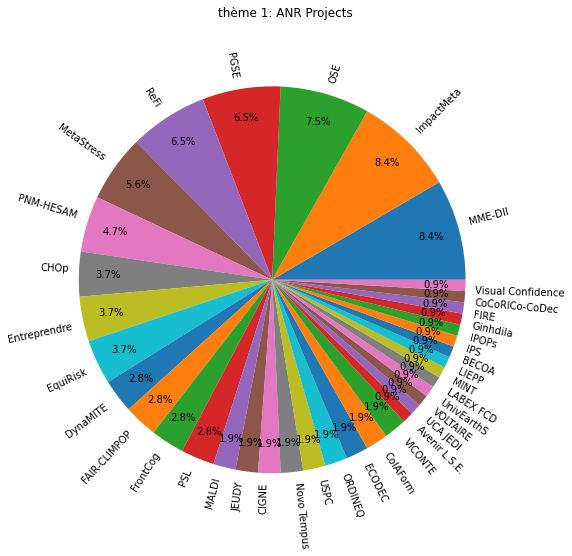

  ==> Saving figure to "./exports/fundings_anr_by_themes_theme_1_occurence.png"
Saving CSV to : ./exports/fundings_anr_by_themes_theme_1_count.csv (number of rows: 236)
Saving CSV to : ./exports/fundings_anr_by_themes_theme_1_repartition.csv (number of rows: 5)


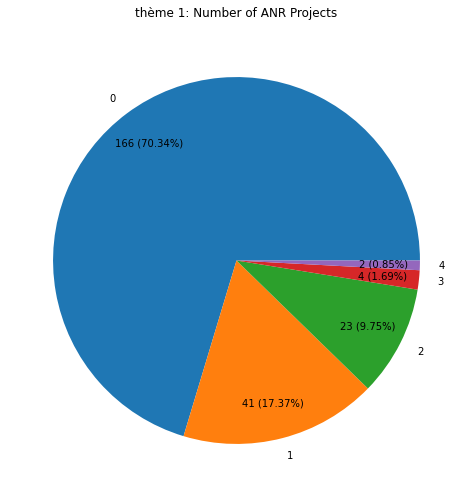

Saving figure to "./exports/fundings_anr_by_themes_theme_1_repartition.png"
==> End processing funding for filemane "anr_by_themes_theme_1" outputs
=> process theme: thème 3
==> Start processing funding for output filename "anr_by_themes_theme_3" based on columns : ['anrProjectAcronym_s', 'anrProjectReference_s']
  ==> Saving CSV to "./exports/fundings_anr_by_themes_theme_3_uri.csv" (number of rows: 3)
  ==> Saving CSV to "./exports/fundings_anr_by_themes_theme_3_occurence.csv" (number of rows: 3)


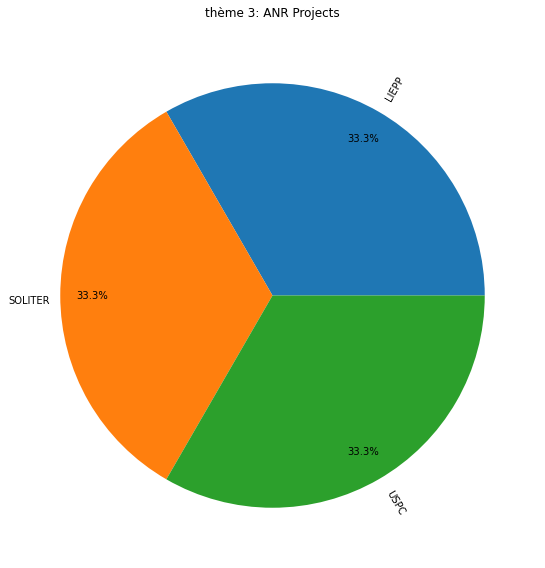

  ==> Saving figure to "./exports/fundings_anr_by_themes_theme_3_occurence.png"
Saving CSV to : ./exports/fundings_anr_by_themes_theme_3_count.csv (number of rows: 114)
Saving CSV to : ./exports/fundings_anr_by_themes_theme_3_repartition.csv (number of rows: 2)


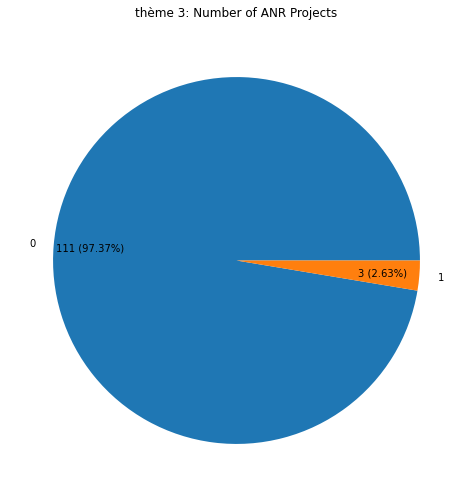

Saving figure to "./exports/fundings_anr_by_themes_theme_3_repartition.png"
==> End processing funding for filemane "anr_by_themes_theme_3" outputs
All themes have been process


In [35]:
for _theme in teams['THEME'].drop_duplicates().tolist():
    _theme_filename_part = NON_ALPHA_NUMERIC_REGEX.sub("_", unidecode.unidecode(_theme))
    print(f'=> process theme: {_theme}')
    # Proportions of ANR by theme
    by_themes_df = df.merge(dft, on='uri_s')
    by_themes_df = by_themes_df[(by_themes_df.THEME == _theme)]
    by_themes_df = by_themes_df.drop_duplicates(subset=['uri_s'], ignore_index=True)
    funding_stats(
        dataframe=by_themes_df,
        columns=['anrProjectAcronym_s', 'anrProjectReference_s'],
        filename=f'anr_by_themes_{_theme_filename_part}',
        occurence_params=dict(title=f'{_theme}: ANR Projects', figsize=(8,8), pctdistance=0.85, rotatelabels=True, labeldistance=1.05),
        repartition_params=dict(title=f'{_theme}: Number of ANR Projects', figsize=(7,7), pctdistance=0.80, rotatelabels=False, labeldistance=1.1),
    )
print('All themes have been process')

#### European

=> process theme: N/A
==> Start processing funding for output filename "european_by_themes_N_A" based on columns : ['europeanProjectAcronym_s', 'europeanProjectReference_s']
  ==> Saving CSV to "./exports/fundings_european_by_themes_N_A_uri.csv" (number of rows: 0)
  ==> Saving CSV to "./exports/fundings_european_by_themes_N_A_occurence.csv" (number of rows: 0)
  ==> Skip figure of occurence for "european_by_themes_N_A" as the dataframe is empty
Saving CSV to : ./exports/fundings_european_by_themes_N_A_count.csv (number of rows: 5)
Saving CSV to : ./exports/fundings_european_by_themes_N_A_repartition.csv (number of rows: 1)


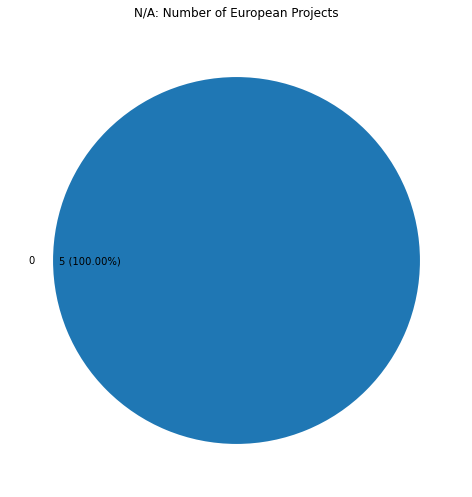

Saving figure to "./exports/fundings_european_by_themes_N_A_repartition.png"
==> End processing funding for filemane "european_by_themes_N_A" outputs
=> process theme: thème 2
==> Start processing funding for output filename "european_by_themes_theme_2" based on columns : ['europeanProjectAcronym_s', 'europeanProjectReference_s']
  ==> Saving CSV to "./exports/fundings_european_by_themes_theme_2_uri.csv" (number of rows: 6)
  ==> Saving CSV to "./exports/fundings_european_by_themes_theme_2_occurence.csv" (number of rows: 6)


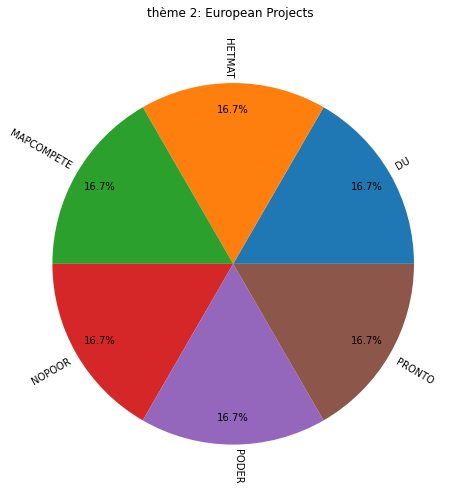

  ==> Saving figure to "./exports/fundings_european_by_themes_theme_2_occurence.png"
Saving CSV to : ./exports/fundings_european_by_themes_theme_2_count.csv (number of rows: 142)
Saving CSV to : ./exports/fundings_european_by_themes_theme_2_repartition.csv (number of rows: 2)


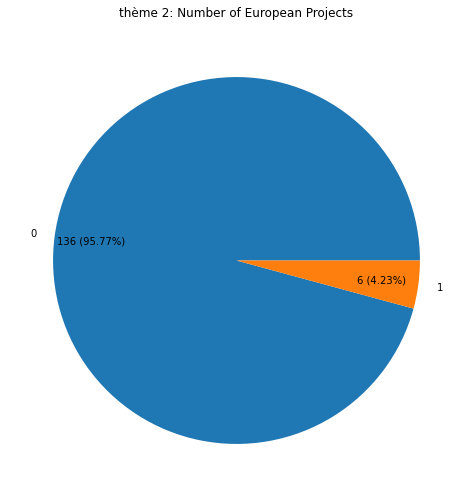

Saving figure to "./exports/fundings_european_by_themes_theme_2_repartition.png"
==> End processing funding for filemane "european_by_themes_theme_2" outputs
=> process theme: thème 1
==> Start processing funding for output filename "european_by_themes_theme_1" based on columns : ['europeanProjectAcronym_s', 'europeanProjectReference_s']
  ==> Saving CSV to "./exports/fundings_european_by_themes_theme_1_uri.csv" (number of rows: 35)
  ==> Saving CSV to "./exports/fundings_european_by_themes_theme_1_occurence.csv" (number of rows: 20)


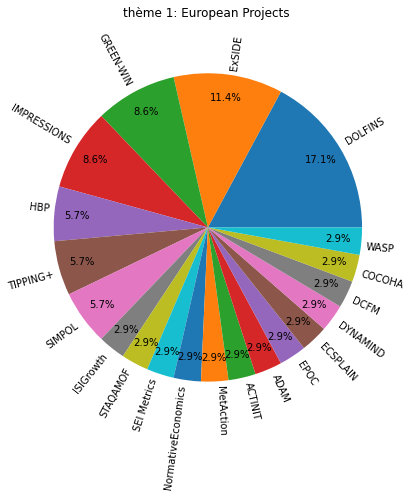

  ==> Saving figure to "./exports/fundings_european_by_themes_theme_1_occurence.png"
Saving CSV to : ./exports/fundings_european_by_themes_theme_1_count.csv (number of rows: 236)
Saving CSV to : ./exports/fundings_european_by_themes_theme_1_repartition.csv (number of rows: 5)


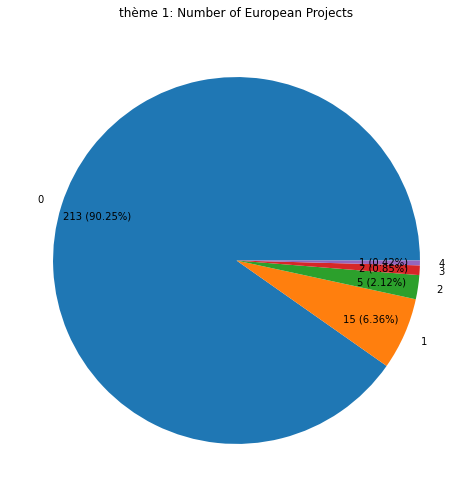

Saving figure to "./exports/fundings_european_by_themes_theme_1_repartition.png"
==> End processing funding for filemane "european_by_themes_theme_1" outputs
=> process theme: thème 1
==> Start processing funding for output filename "european_by_themes_theme_1" based on columns : ['europeanProjectAcronym_s', 'europeanProjectReference_s']
  ==> Saving CSV to "./exports/fundings_european_by_themes_theme_1_uri.csv" (number of rows: 35)
  ==> Saving CSV to "./exports/fundings_european_by_themes_theme_1_occurence.csv" (number of rows: 20)


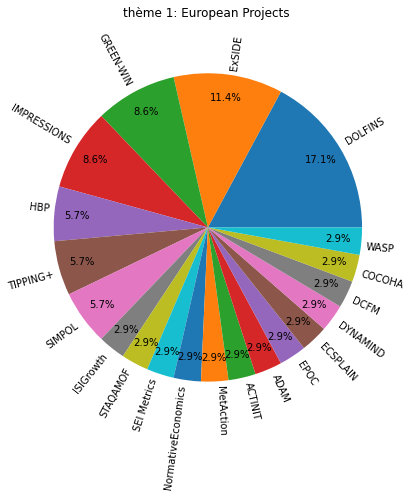

  ==> Saving figure to "./exports/fundings_european_by_themes_theme_1_occurence.png"
Saving CSV to : ./exports/fundings_european_by_themes_theme_1_count.csv (number of rows: 236)
Saving CSV to : ./exports/fundings_european_by_themes_theme_1_repartition.csv (number of rows: 5)


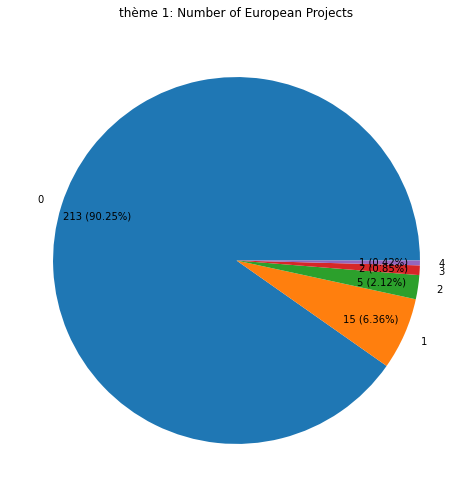

Saving figure to "./exports/fundings_european_by_themes_theme_1_repartition.png"
==> End processing funding for filemane "european_by_themes_theme_1" outputs
=> process theme: thème 3
==> Start processing funding for output filename "european_by_themes_theme_3" based on columns : ['europeanProjectAcronym_s', 'europeanProjectReference_s']
  ==> Saving CSV to "./exports/fundings_european_by_themes_theme_3_uri.csv" (number of rows: 1)
  ==> Saving CSV to "./exports/fundings_european_by_themes_theme_3_occurence.csv" (number of rows: 1)


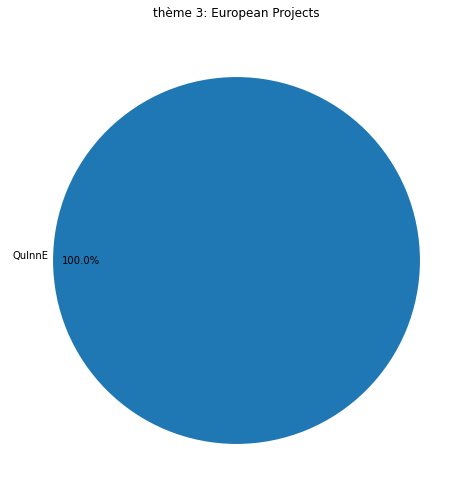

  ==> Saving figure to "./exports/fundings_european_by_themes_theme_3_occurence.png"
Saving CSV to : ./exports/fundings_european_by_themes_theme_3_count.csv (number of rows: 114)
Saving CSV to : ./exports/fundings_european_by_themes_theme_3_repartition.csv (number of rows: 2)


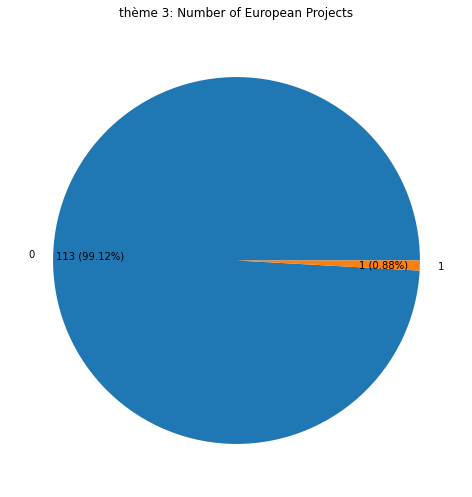

Saving figure to "./exports/fundings_european_by_themes_theme_3_repartition.png"
==> End processing funding for filemane "european_by_themes_theme_3" outputs
=> process theme: thème 1
==> Start processing funding for output filename "european_by_themes_theme_1" based on columns : ['europeanProjectAcronym_s', 'europeanProjectReference_s']
  ==> Saving CSV to "./exports/fundings_european_by_themes_theme_1_uri.csv" (number of rows: 35)
  ==> Saving CSV to "./exports/fundings_european_by_themes_theme_1_occurence.csv" (number of rows: 20)


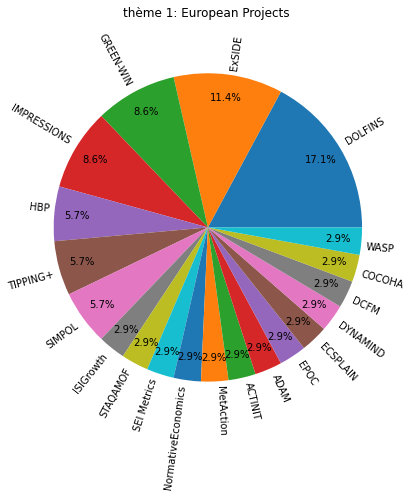

  ==> Saving figure to "./exports/fundings_european_by_themes_theme_1_occurence.png"
Saving CSV to : ./exports/fundings_european_by_themes_theme_1_count.csv (number of rows: 236)
Saving CSV to : ./exports/fundings_european_by_themes_theme_1_repartition.csv (number of rows: 5)


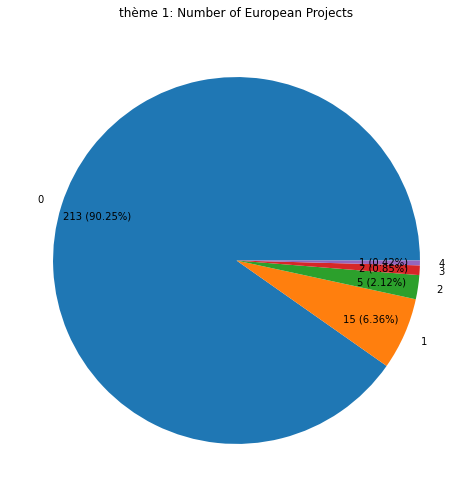

Saving figure to "./exports/fundings_european_by_themes_theme_1_repartition.png"
==> End processing funding for filemane "european_by_themes_theme_1" outputs
=> process theme: thème 2
==> Start processing funding for output filename "european_by_themes_theme_2" based on columns : ['europeanProjectAcronym_s', 'europeanProjectReference_s']
  ==> Saving CSV to "./exports/fundings_european_by_themes_theme_2_uri.csv" (number of rows: 6)
  ==> Saving CSV to "./exports/fundings_european_by_themes_theme_2_occurence.csv" (number of rows: 6)


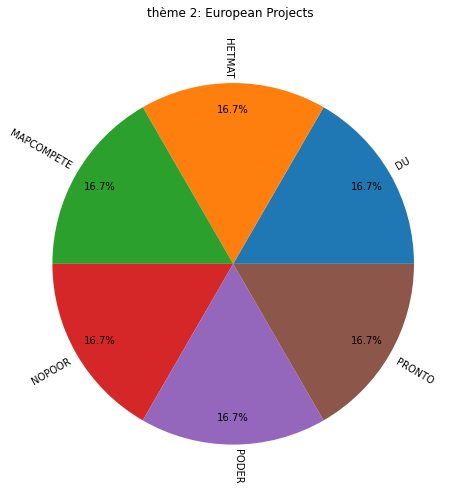

  ==> Saving figure to "./exports/fundings_european_by_themes_theme_2_occurence.png"
Saving CSV to : ./exports/fundings_european_by_themes_theme_2_count.csv (number of rows: 142)
Saving CSV to : ./exports/fundings_european_by_themes_theme_2_repartition.csv (number of rows: 2)


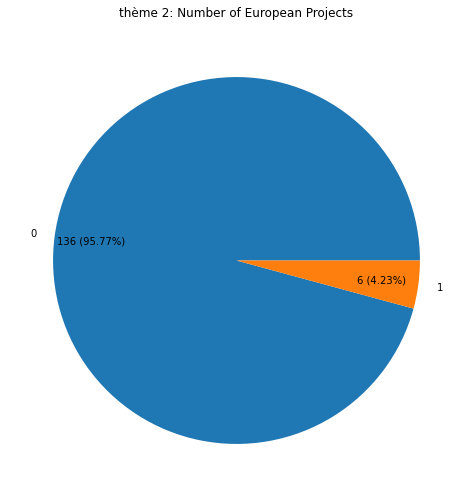

Saving figure to "./exports/fundings_european_by_themes_theme_2_repartition.png"
==> End processing funding for filemane "european_by_themes_theme_2" outputs
=> process theme: thème 2
==> Start processing funding for output filename "european_by_themes_theme_2" based on columns : ['europeanProjectAcronym_s', 'europeanProjectReference_s']
  ==> Saving CSV to "./exports/fundings_european_by_themes_theme_2_uri.csv" (number of rows: 6)
  ==> Saving CSV to "./exports/fundings_european_by_themes_theme_2_occurence.csv" (number of rows: 6)


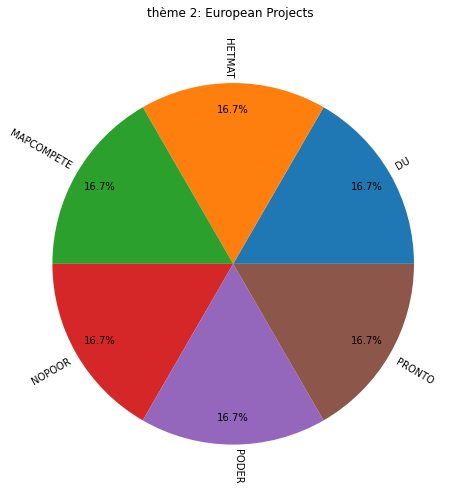

  ==> Saving figure to "./exports/fundings_european_by_themes_theme_2_occurence.png"
Saving CSV to : ./exports/fundings_european_by_themes_theme_2_count.csv (number of rows: 142)
Saving CSV to : ./exports/fundings_european_by_themes_theme_2_repartition.csv (number of rows: 2)


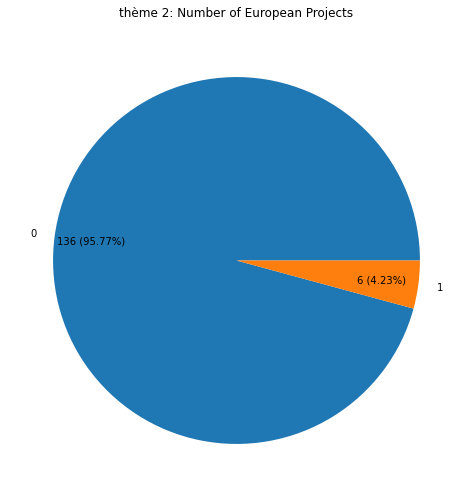

Saving figure to "./exports/fundings_european_by_themes_theme_2_repartition.png"
==> End processing funding for filemane "european_by_themes_theme_2" outputs
=> process theme: thème 3
==> Start processing funding for output filename "european_by_themes_theme_3" based on columns : ['europeanProjectAcronym_s', 'europeanProjectReference_s']
  ==> Saving CSV to "./exports/fundings_european_by_themes_theme_3_uri.csv" (number of rows: 1)
  ==> Saving CSV to "./exports/fundings_european_by_themes_theme_3_occurence.csv" (number of rows: 1)


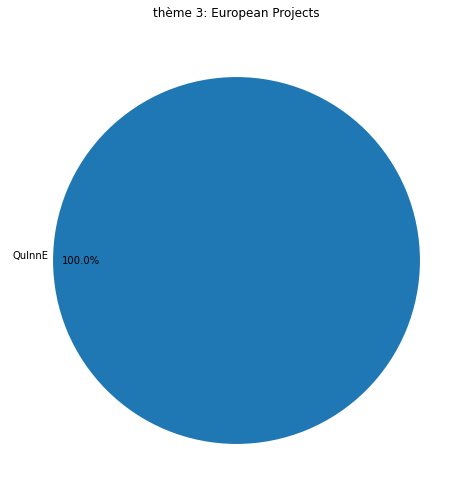

  ==> Saving figure to "./exports/fundings_european_by_themes_theme_3_occurence.png"
Saving CSV to : ./exports/fundings_european_by_themes_theme_3_count.csv (number of rows: 114)
Saving CSV to : ./exports/fundings_european_by_themes_theme_3_repartition.csv (number of rows: 2)


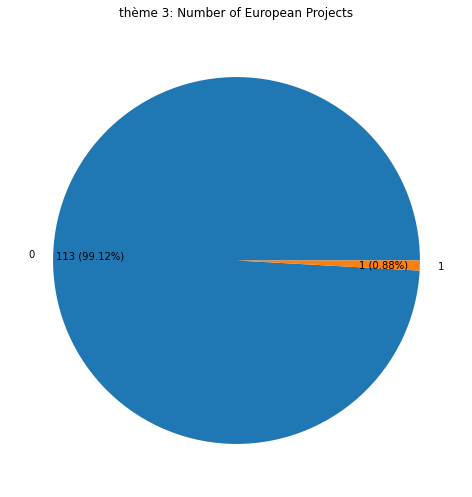

Saving figure to "./exports/fundings_european_by_themes_theme_3_repartition.png"
==> End processing funding for filemane "european_by_themes_theme_3" outputs
All teams have been process


In [36]:
for _theme in teams['THEME'].tolist():
    _theme_filename_part = NON_ALPHA_NUMERIC_REGEX.sub("_", unidecode.unidecode(_theme))
    print(f'=> process theme: {_theme}')
    # Proportions of European by theme
    by_themes_df = df.merge(dft, on='uri_s')
    by_themes_df = by_themes_df[(by_themes_df.THEME == _theme)]
    by_themes_df = by_themes_df.drop_duplicates(subset=['uri_s'], ignore_index=True)
    funding_stats(
        dataframe=by_themes_df,
        columns=['europeanProjectAcronym_s', 'europeanProjectReference_s'],
        filename=f'european_by_themes_{_theme_filename_part}',
        occurence_params=dict(title=f'{_theme}: European Projects',figsize=(7,7), pctdistance=0.85, rotatelabels=True, labeldistance=1.025),
        repartition_params=dict(title=f'{_theme}: Number of European Projects',figsize=(7,7), pctdistance=0.80)
    )
print('All teams have been process')

## Collaborations

### Global


#### Structure/institution: Country (instStructCountry_s)

An article, may have several `instStructCountry_s`.

We explode the dataset based on the field `instStructCountry_s` to have only one country by row.

In [37]:
collaboration_struct_countries = df[['uri_s', 'instStructCountry_s']]
collaboration_struct_countries = collaboration_struct_countries.explode(['instStructCountry_s'])
collaboration_struct_countries

,uri_s,instStructCountry_s
0,https://hal.archives-ouvertes.fr/hal-03228974,fr
0,https://hal.archives-ouvertes.fr/hal-03228974,fr
0,https://hal.archives-ouvertes.fr/hal-03228974,co
0,https://hal.archives-ouvertes.fr/hal-03228974,fr
0,https://hal.archives-ouvertes.fr/hal-03228974,gb
...,...,...
481,https://halshs.archives-ouvertes.fr/halshs-023...,fr
481,https://halshs.archives-ouvertes.fr/halshs-023...,fr
481,https://halshs.archives-ouvertes.fr/halshs-023...,fr
481,https://halshs.archives-ouvertes.fr/halshs-023...,fr


In [38]:
collaboration_struct_country_values = collaboration_struct_countries[['instStructCountry_s']].value_counts().to_frame(name='count').reset_index()
collaboration_struct_country_values.to_csv(f'./exports/colloborations_inst_struct_country.csv', index=False)
collaboration_struct_country_values.head(n=5)

,instStructCountry_s,count
0,fr,3021
1,us,59
2,gb,46
3,it,40
4,ch,29


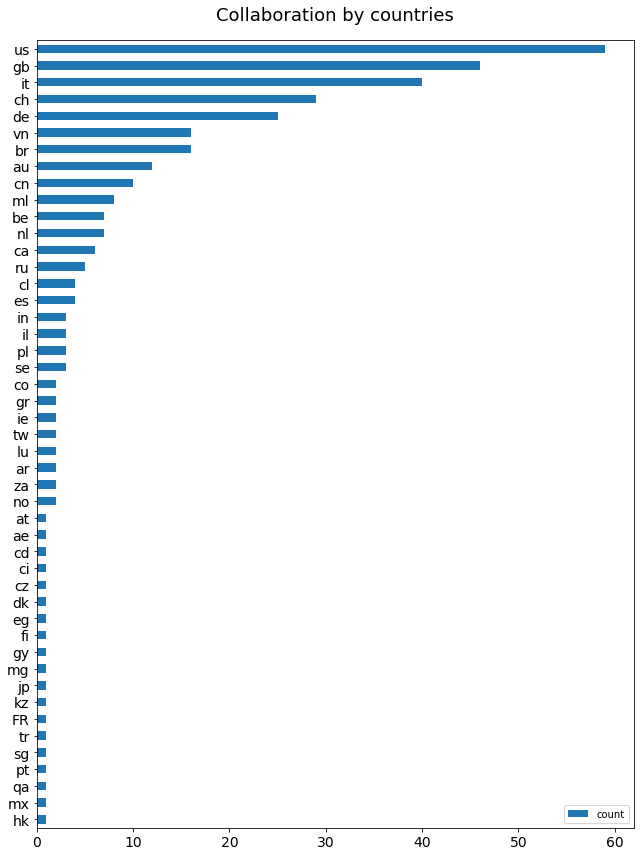

In [39]:
p = collaboration_struct_country_values[(collaboration_struct_country_values.instStructCountry_s != 'fr')].sort_values(by=['count'], ascending=True).plot(
    kind='barh',
    title='Collaboration by countries',
    x='instStructCountry_s',
    y='count',
    xlabel='',
    ylabel='',
    figsize=(9, 12),
    fontsize=14,
    rot=0,
)
p.set_title('Collaboration by countries',pad=20, fontdict={'fontsize':18})
plt.tight_layout()
p.get_figure().savefig(f'./exports/collaboration_struct_country_count.png')

#### Structure/institution: Name (instStructName_s)

An article, may have several `instStructName_s`.

We explode the dataset based on the field `instStructName_s` to have only one structure by row.

In [40]:
collaboration_struct_names = df[['uri_s', 'instStructName_s']]
collaboration_struct_names = collaboration_struct_names.explode(['instStructName_s'])
collaboration_struct_names

,uri_s,instStructName_s
0,https://hal.archives-ouvertes.fr/hal-03228974,Université Paris 1 Panthéon-Sorbonne
0,https://hal.archives-ouvertes.fr/hal-03228974,Centre National de la Recherche Scientifique
0,https://hal.archives-ouvertes.fr/hal-03228974,Universidad de los Andes [Bogota]
0,https://hal.archives-ouvertes.fr/hal-03228974,Université Paris 8 Vincennes-Saint-Denis
0,https://hal.archives-ouvertes.fr/hal-03228974,University of the West of England [Bristol]
...,...,...
481,https://halshs.archives-ouvertes.fr/halshs-023...,École normale supérieure - Paris
481,https://halshs.archives-ouvertes.fr/halshs-023...,Université Paris 1 Panthéon-Sorbonne
481,https://halshs.archives-ouvertes.fr/halshs-023...,Centre National de la Recherche Scientifique
481,https://halshs.archives-ouvertes.fr/halshs-023...,École des hautes études en sciences sociales


In [41]:
collaboration_struct_name_values = collaboration_struct_names[['instStructName_s']].value_counts().to_frame(name='count').reset_index()
collaboration_struct_name_values.to_csv(f'./exports/colloborations_inst_struct_name.csv', index=False)
collaboration_struct_name_values = collaboration_struct_name_values[(collaboration_struct_name_values.instStructName_s != 'Centre National de la Recherche Scientifique')]
collaboration_struct_name_values = collaboration_struct_name_values[(collaboration_struct_name_values.instStructName_s != 'Université Paris 1 Panthéon-Sorbonne')]
# Retrieve small collaboration to create a new row 'others'
collaboration_struct_name_others = collaboration_struct_name_values[(collaboration_struct_name_values['count'] <= 5)]
collaboration_struct_name_others_size = collaboration_struct_name_others['instStructName_s'].size
collaboration_struct_name_others = pd.DataFrame(
    dict(
        instStructName_s=f'Others ({collaboration_struct_name_others_size})',
        count=collaboration_struct_name_others['count'].sum()
    ),
    index=[0]
)
# Cleanup base df for collaboration
collaboration_struct_name_values = collaboration_struct_name_values[(collaboration_struct_name_values['count'] > 5)]
collaboration_struct_name_values = collaboration_struct_name_values.append(collaboration_struct_name_others)
collaboration_struct_name_values = collaboration_struct_name_values.sort_values(by=['count'], ascending=False)
collaboration_struct_name_values.to_csv('./exports/colloborations_inst_struct_name_filtered_5.csv', index=False)
collaboration_struct_name_values.head(n=5)

/tmp/ipykernel_478/1573096838.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  collaboration_struct_name_values = collaboration_struct_name_values.append(collaboration_struct_name_others)


,instStructName_s,count
0,Others (372),547
2,École des hautes études en sciences sociales,205
3,École normale supérieure - Paris,191
4,École des Ponts ParisTech,178
5,Institut National de Recherche pour l’Agricult...,174


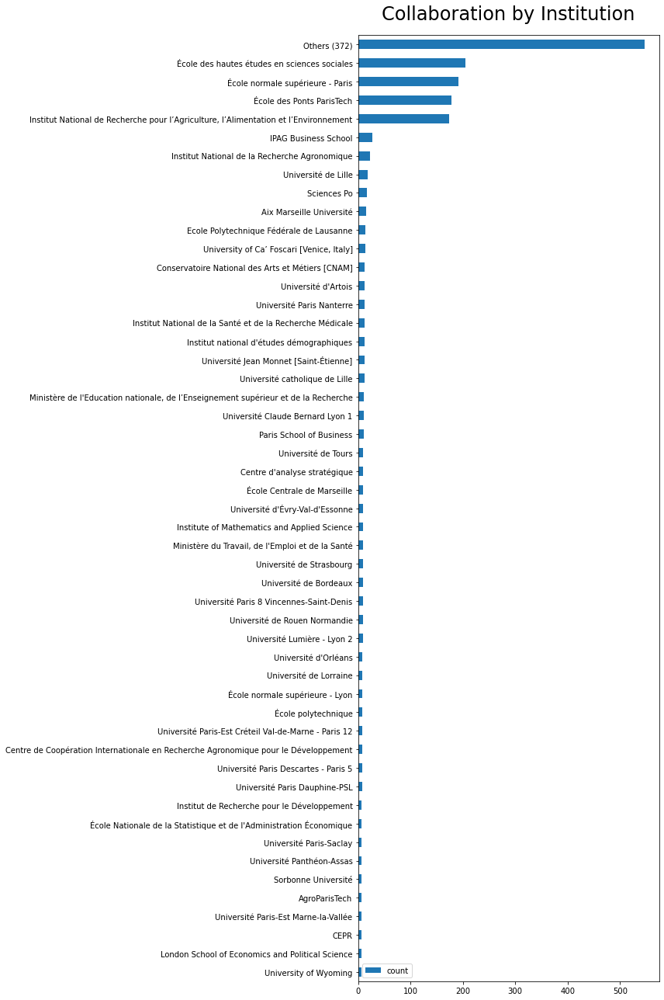

In [42]:
p = collaboration_struct_name_values.sort_values(by=['count']).plot(
    kind='barh',
    title='Collaboration by Institution',
    x='instStructName_s',
    y='count',
    xlabel='',
    ylabel='',
    figsize=(12, 18)
)
p.set_title('Collaboration by Institution', pad=20, fontdict={'fontsize':24})
plt.tight_layout()
p.get_figure().savefig(f'./exports/collaboration_struct_name_count.png')

## Attached files

Also named Full text

An article may have multiple attached files. We will count the number of attached files here by document.

In [43]:
def full_text(dataframe, filename: str, title: str, params: Dict[str, Any] = dict()):
    attached_files = dataframe[['uri_s', 'files_s']].copy()
    attached_files['attached_files_count'] = attached_files['files_s'].apply(lambda x: len(x) if pd.notnull(x) else 0)
    attached_files[['uri_s', 'attached_files_count']].to_csv(f'./exports/full_text_{filename}.csv', index=False)
    print(f'Saving CSV to : ./exports/full_text_{filename}.csv')
     
    attached_files_number = attached_files['attached_files_count'].value_counts().sort_index()
    attached_files_number.to_csv(f'./exports/full_text_{filename}_repartition.csv', index=False)
    print(f'Saving figure to : ./exports/full_text_{filename}_repartition.csv')
    
    default_params = dict(   
        kind='pie',
        subplots=True,
        sharex=False,
        sharey=False,
        title=title,
        ylabel='',
        labels=attached_files_number.index.tolist(),
        figsize=(6, 6),
        autopct=lambda p: '{total} ({p:.2f}%)'.format(p=p, total=round(p * attached_files_number.sum() / 100)),
        pctdistance=0.7,
        fontsize=14,
    )
    p = attached_files_number.plot(**{**default_params, **params})
    plt.tight_layout()
    plt.figure(1).savefig(f'./exports/full_text_{filename}_repartition.png')
    plt.show()
    print(f'Saving figure to : ./exports/full_text_{filename}_repartition.png')
    return attached_files 

### Global

Saving CSV to : ./exports/full_text_global.csv
Saving figure to : ./exports/full_text_global_repartition.csv


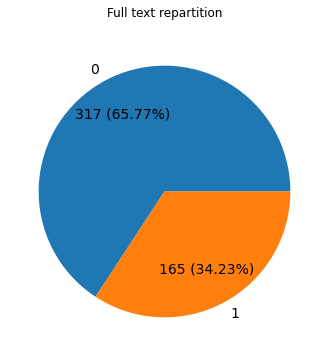

Saving figure to : ./exports/full_text_global_repartition.png


,uri_s,files_s,attached_files_count
0,https://hal.archives-ouvertes.fr/hal-03228974,NaN,0
1,https://hal.archives-ouvertes.fr/hal-03228955,NaN,0
2,https://hal.archives-ouvertes.fr/hal-03231804,[https://hal.archives-ouvertes.fr/hal-03231804...,1
3,https://hal.archives-ouvertes.fr/hal-03232617,NaN,0
4,https://hal.archives-ouvertes.fr/hal-02098605,NaN,0
...,...,...,...
477,https://hal.archives-ouvertes.fr/hal-02367200v3,[https://hal.archives-ouvertes.fr/hal-02367200...,1
478,https://halshs.archives-ouvertes.fr/halshs-023...,[https://halshs.archives-ouvertes.fr/halshs-02...,1
479,https://halshs.archives-ouvertes.fr/halshs-032...,[https://halshs.archives-ouvertes.fr/halshs-03...,1
480,https://hal.archives-ouvertes.fr/hal-02093378,[https://hal.archives-ouvertes.fr/hal-02093378...,1


In [44]:
full_text(df, filename='global', title='Full text repartition', params=dict(figsize=(5,5), pctdistance=0.70, labeldistance=1.1))

### By Teams

=> process team: N/A
Saving CSV to : ./exports/full_text_by_teams_N_A.csv
Saving figure to : ./exports/full_text_by_teams_N_A_repartition.csv


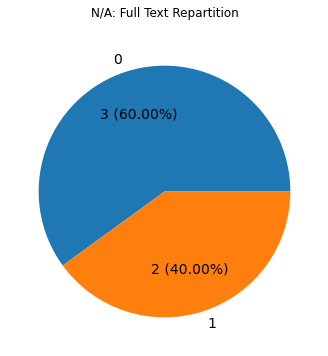

Saving figure to : ./exports/full_text_by_teams_N_A_repartition.png
=> process team: globalisation financière
Saving CSV to : ./exports/full_text_by_teams_globalisation_financiere.csv
Saving figure to : ./exports/full_text_by_teams_globalisation_financiere_repartition.csv


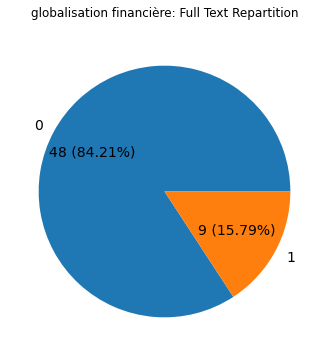

Saving figure to : ./exports/full_text_by_teams_globalisation_financiere_repartition.png
=> process team: microéconomie théorique
Saving CSV to : ./exports/full_text_by_teams_microeconomie_theorique.csv
Saving figure to : ./exports/full_text_by_teams_microeconomie_theorique_repartition.csv


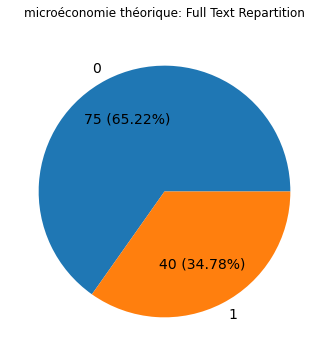

Saving figure to : ./exports/full_text_by_teams_microeconomie_theorique_repartition.png
=> process team: modélisation financière
Saving CSV to : ./exports/full_text_by_teams_modelisation_financiere.csv
Saving figure to : ./exports/full_text_by_teams_modelisation_financiere_repartition.csv


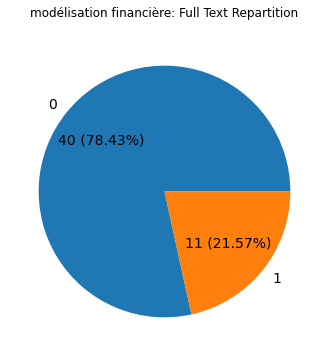

Saving figure to : ./exports/full_text_by_teams_modelisation_financiere_repartition.png
=> process team: politiques publiques
Saving CSV to : ./exports/full_text_by_teams_politiques_publiques.csv
Saving figure to : ./exports/full_text_by_teams_politiques_publiques_repartition.csv


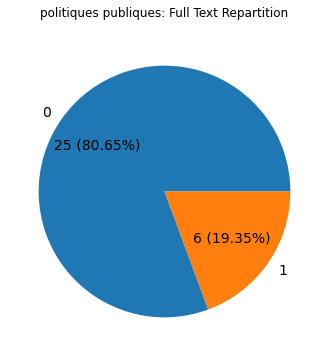

Saving figure to : ./exports/full_text_by_teams_politiques_publiques_repartition.png
=> process team: sciences du comportement
Saving CSV to : ./exports/full_text_by_teams_sciences_du_comportement.csv
Saving figure to : ./exports/full_text_by_teams_sciences_du_comportement_repartition.csv


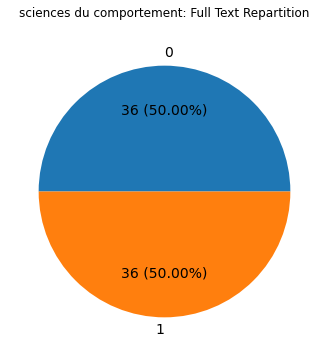

Saving figure to : ./exports/full_text_by_teams_sciences_du_comportement_repartition.png
=> process team: économie du développement
Saving CSV to : ./exports/full_text_by_teams_economie_du_developpement.csv
Saving figure to : ./exports/full_text_by_teams_economie_du_developpement_repartition.csv


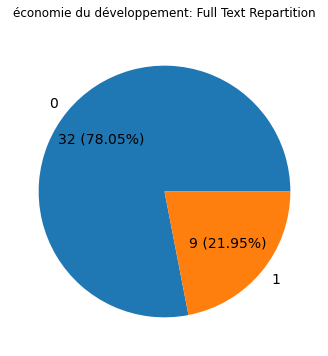

Saving figure to : ./exports/full_text_by_teams_economie_du_developpement_repartition.png
=> process team: économie internationale
Saving CSV to : ./exports/full_text_by_teams_economie_internationale.csv
Saving figure to : ./exports/full_text_by_teams_economie_internationale_repartition.csv


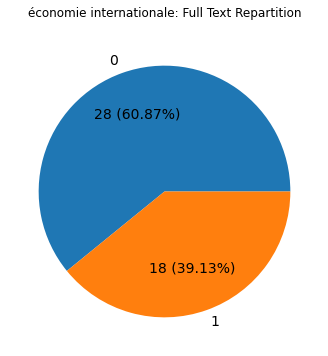

Saving figure to : ./exports/full_text_by_teams_economie_internationale_repartition.png
=> process team: économie politique
Saving CSV to : ./exports/full_text_by_teams_economie_politique.csv
Saving figure to : ./exports/full_text_by_teams_economie_politique_repartition.csv


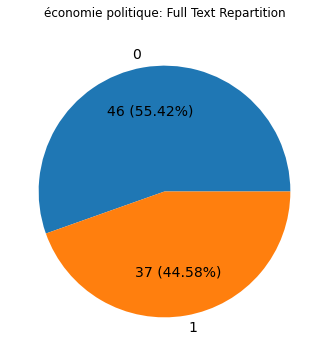

Saving figure to : ./exports/full_text_by_teams_economie_politique_repartition.png
All teams have been process


In [45]:
for _team_name in teams['EQUIPE'].drop_duplicates().tolist():
    _team_filename_part = NON_ALPHA_NUMERIC_REGEX.sub("_", unidecode.unidecode(_team_name))
    print(f'=> process team: {_team_name}')
    # Proportions of ANR funding
    by_teams_df = dft.merge(df, on='uri_s')
    by_teams_df = by_teams_df[(by_teams_df.EQUIPE == _team_name)]
    by_teams_df = by_teams_df.drop_duplicates(subset=['uri_s'], ignore_index=True)
    full_text(
        dataframe=by_teams_df,
        filename=f'by_teams_{_team_filename_part}',
        title=f'{_team_name}: Full Text Repartition',
        params=dict(figsize=(5,5), pctdistance=0.65, labeldistance=1.1)
    )
print('All teams have been process')

### By Themes

=> process theme: N/A
Saving CSV to : ./exports/full_text_by_themes_N_A.csv
Saving figure to : ./exports/full_text_by_themes_N_A_repartition.csv


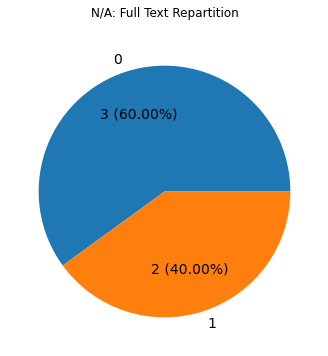

Saving figure to : ./exports/full_text_by_themes_N_A_repartition.png
=> process theme: thème 2
Saving CSV to : ./exports/full_text_by_themes_theme_2.csv
Saving figure to : ./exports/full_text_by_themes_theme_2_repartition.csv


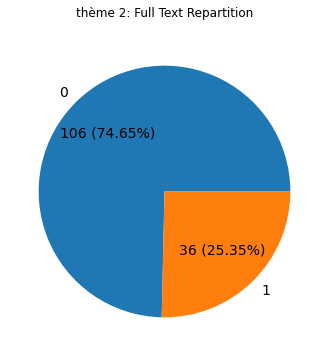

Saving figure to : ./exports/full_text_by_themes_theme_2_repartition.png
=> process theme: thème 1
Saving CSV to : ./exports/full_text_by_themes_theme_1.csv
Saving figure to : ./exports/full_text_by_themes_theme_1_repartition.csv


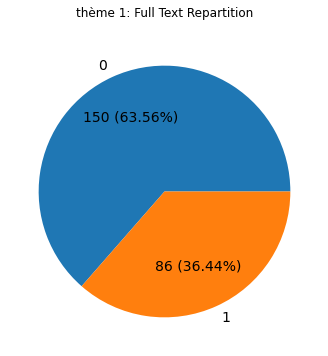

Saving figure to : ./exports/full_text_by_themes_theme_1_repartition.png
=> process theme: thème 3
Saving CSV to : ./exports/full_text_by_themes_theme_3.csv
Saving figure to : ./exports/full_text_by_themes_theme_3_repartition.csv


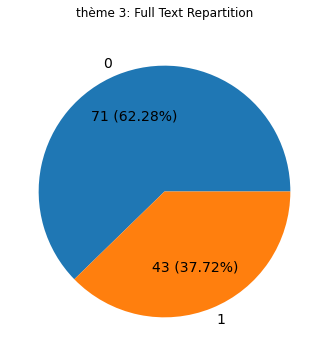

Saving figure to : ./exports/full_text_by_themes_theme_3_repartition.png
All themes have been process


In [46]:
for _theme in teams['THEME'].drop_duplicates().tolist():
    _theme_filename_part = NON_ALPHA_NUMERIC_REGEX.sub("_", unidecode.unidecode(_theme))
    print(f'=> process theme: {_theme}')
    # Proportions of European _theme
    by_themes_df = df.merge(dft, on='uri_s')
    by_themes_df = by_themes_df[(by_themes_df.THEME == _theme)]
    by_themes_df = by_themes_df.drop_duplicates(subset=['uri_s'], ignore_index=True)
    full_text(
        dataframe=by_themes_df,
        filename=f'by_themes_{_theme_filename_part}',
        title=f'{_theme}: Full Text Repartition',
        params=dict(figsize=(5,5), pctdistance=0.65, labeldistance=1.1)
    )
print('All themes have been process')

## Articles

**Warning :**

If an article have been written by authors in different teams, the articles will be count for each teams.

It will be the same for the fundings


### By Teams



In [47]:
article_by_teams = dft[['uri_s', 'EQUIPE']].drop_duplicates(ignore_index=True)
article_by_teams = article_by_teams[['EQUIPE']].value_counts().to_frame(name='count').reset_index()
article_by_teams.to_csv(path_or_buf='./exports/by_teams_articles_count.csv', index=False)
article_by_teams

,EQUIPE,count
0,microéconomie théorique,115
1,économie politique,83
2,sciences du comportement,72
3,globalisation financière,57
4,modélisation financière,51
5,économie internationale,46
6,économie du développement,41
7,politiques publiques,31
8,N/A,5


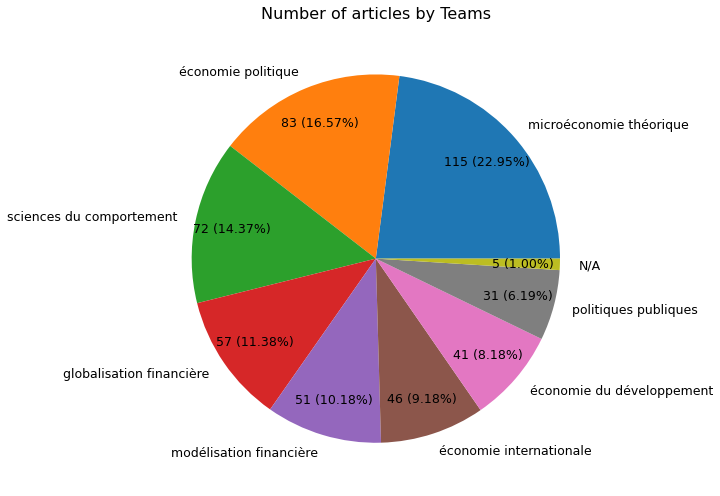

In [48]:
p = article_by_teams['count'].plot(
    kind='pie',
    ylabel='',
    legend=False,
    title='Number of articles by Teams',
    labels=article_by_teams['EQUIPE'],
    figsize=(10, 7),
    autopct=lambda p: '{total} ({p:.2f}%)'.format(p=p, total=round(p * article_by_teams['count'].sum() / 100)),
    pctdistance=0.8,
    startangle=0,
    fontsize=12.5
)
p.set_title('Number of articles by Teams', pad=10, fontdict={'fontsize': 16})
plt.tight_layout()
p.get_figure().savefig('./exports/by_teams_number_of_articles.png')
plt.show()

### By Themes

In [49]:
article_by_themes = dft[['uri_s', 'THEME']].drop_duplicates(ignore_index=True)
article_by_themes = article_by_themes[['THEME']].value_counts().to_frame(name='count').reset_index()
article_by_themes.to_csv(path_or_buf='./exports/by_themes_articles_count.csv', index=False)
article_by_themes

,THEME,count
0,thème 1,236
1,thème 2,142
2,thème 3,114
3,N/A,5


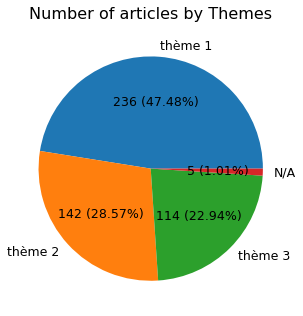

In [50]:
p = article_by_themes['count'].plot(
    kind='pie',
    ylabel='',
    legend=False,
    title='Number of articles by Themes',
    labels=article_by_themes['THEME'],
    figsize=(5, 4.5),
    autopct=lambda p: '{total} ({p:.2f}%)'.format(p=p, total=round(p * article_by_themes['count'].sum() / 100)),
    pctdistance=0.6,
    startangle=0,
    fontsize=12.5
)
p.set_title('Number of articles by Themes', pad=10, fontdict={'fontsize': 16})
plt.tight_layout()
p.get_figure().savefig('./exports/by_themes_number_of_articles.png')
plt.show()

## Open Access

In [51]:
def open_access(dataframe, filename: str, title: str, params: Dict[str, Any] = dict()):
    open_access_number_series = dataframe['openAccess_bool'].value_counts().reindex([True, False])
    open_access_number = open_access_number_series.to_frame(name='count').reset_index()
    open_access_number.to_csv(f'./exports/open_access_{filename}_repartition.csv', index=False)
    print(f'Saving figure to : ./exports/open_access_{filename}_repartition.csv')
    
    default_params = dict(
        kind='pie',
        subplots=True,
        sharex=False,
        sharey=False,
        title=title,
        ylabel='',
        labels=open_access_number_series.index.tolist(),
        figsize=(6, 6),
        autopct=lambda p: '{total} ({p:.2f}%)'.format(p=p, total=round(p * open_access_number['count'].sum() / 100)),
        pctdistance=0.7,
        fontsize=14,
    )
    p = open_access_number_series.plot(**{**default_params, **params})
    plt.tight_layout()
    plt.figure(1).savefig(f'./exports/open_access_{filename}_repartition.png')
    plt.show()
    print(f'Saving figure to : ./exports/open_access_{filename}_repartition.png')
    
    return open_access_number

### Global

Saving figure to : ./exports/open_access_global_repartition.csv


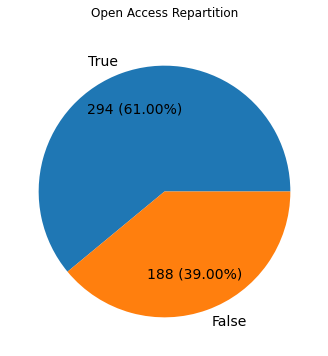

Saving figure to : ./exports/open_access_global_repartition.png


,index,count
0,True,294
1,False,188


In [52]:
open_access(df, filename='global', title='Open Access Repartition', params=dict(figsize=(5,5), pctdistance=0.70, labeldistance=1.1))

### By Teams


=> process team: N/A
Saving figure to : ./exports/open_access_by_teams_N_A_repartition.csv


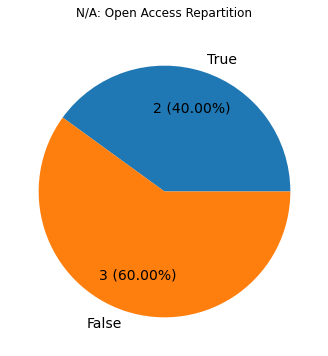

Saving figure to : ./exports/open_access_by_teams_N_A_repartition.png
=> process team: globalisation financière
Saving figure to : ./exports/open_access_by_teams_globalisation_financiere_repartition.csv


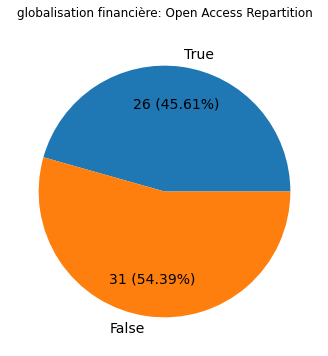

Saving figure to : ./exports/open_access_by_teams_globalisation_financiere_repartition.png
=> process team: microéconomie théorique
Saving figure to : ./exports/open_access_by_teams_microeconomie_theorique_repartition.csv


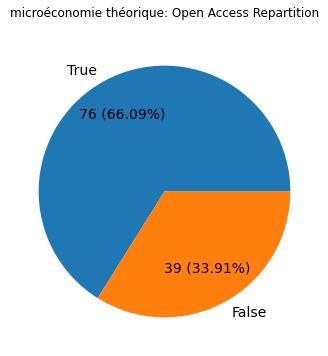

Saving figure to : ./exports/open_access_by_teams_microeconomie_theorique_repartition.png
=> process team: modélisation financière
Saving figure to : ./exports/open_access_by_teams_modelisation_financiere_repartition.csv


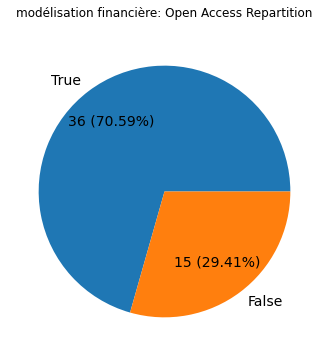

Saving figure to : ./exports/open_access_by_teams_modelisation_financiere_repartition.png
=> process team: politiques publiques
Saving figure to : ./exports/open_access_by_teams_politiques_publiques_repartition.csv


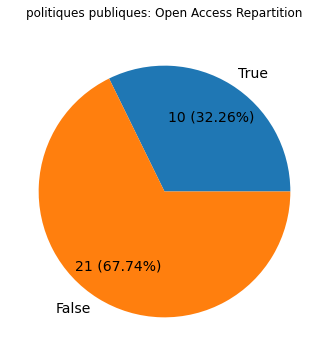

Saving figure to : ./exports/open_access_by_teams_politiques_publiques_repartition.png
=> process team: sciences du comportement
Saving figure to : ./exports/open_access_by_teams_sciences_du_comportement_repartition.csv


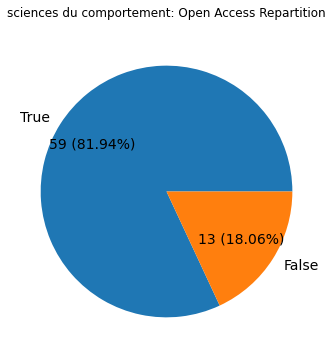

Saving figure to : ./exports/open_access_by_teams_sciences_du_comportement_repartition.png
=> process team: économie du développement
Saving figure to : ./exports/open_access_by_teams_economie_du_developpement_repartition.csv


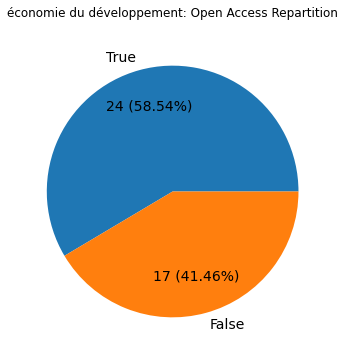

Saving figure to : ./exports/open_access_by_teams_economie_du_developpement_repartition.png
=> process team: économie internationale
Saving figure to : ./exports/open_access_by_teams_economie_internationale_repartition.csv


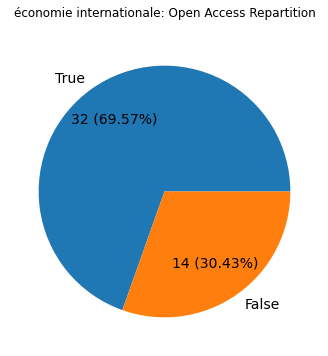

Saving figure to : ./exports/open_access_by_teams_economie_internationale_repartition.png
=> process team: économie politique
Saving figure to : ./exports/open_access_by_teams_economie_politique_repartition.csv


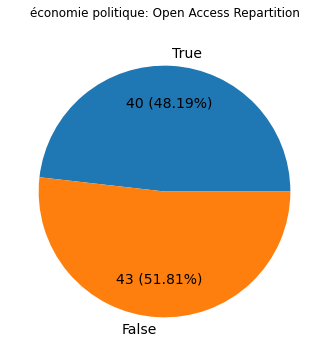

Saving figure to : ./exports/open_access_by_teams_economie_politique_repartition.png
All teams have been process


In [53]:
for _team_name in teams['EQUIPE'].drop_duplicates().tolist():
    _team_filename_part = NON_ALPHA_NUMERIC_REGEX.sub("_", unidecode.unidecode(_team_name))
    print(f'=> process team: {_team_name}')
    # Proportions of open access
    by_teams_df = dft.merge(df, on='uri_s')
    by_teams_df = by_teams_df[(by_teams_df.EQUIPE == _team_name)]
    by_teams_df = by_teams_df.drop_duplicates(subset=['uri_s'], ignore_index=True)
    open_access(
        dataframe=by_teams_df,
        filename=f'by_teams_{_team_filename_part}',
        title=f'{_team_name}: Open Access Repartition',
        params=dict(figsize=(5, 5),)
    )
print('All teams have been process')

### By Themes

=> process theme: N/A
Saving figure to : ./exports/open_access_by_themes_N_A_repartition.csv


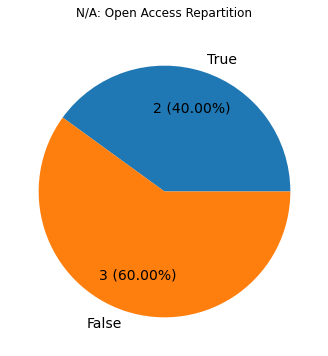

Saving figure to : ./exports/open_access_by_themes_N_A_repartition.png
=> process theme: thème 2
Saving figure to : ./exports/open_access_by_themes_theme_2_repartition.csv


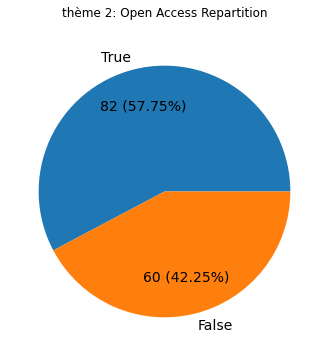

Saving figure to : ./exports/open_access_by_themes_theme_2_repartition.png
=> process theme: thème 1
Saving figure to : ./exports/open_access_by_themes_theme_1_repartition.csv


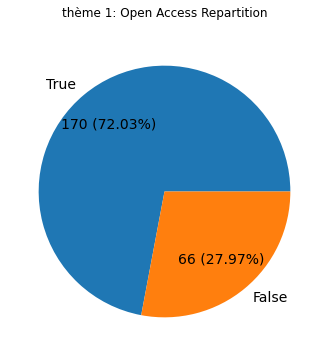

Saving figure to : ./exports/open_access_by_themes_theme_1_repartition.png
=> process theme: thème 3
Saving figure to : ./exports/open_access_by_themes_theme_3_repartition.csv


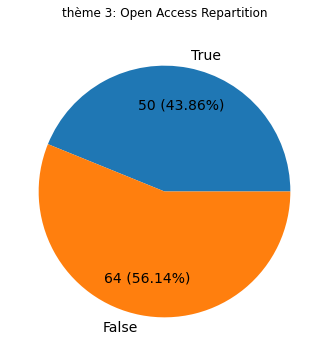

Saving figure to : ./exports/open_access_by_themes_theme_3_repartition.png
All themes have been process


In [54]:
for _theme in teams['THEME'].drop_duplicates().tolist():
    _theme_filename_part = NON_ALPHA_NUMERIC_REGEX.sub("_", unidecode.unidecode(_theme))
    print(f'=> process theme: {_theme}')
    # Proportions of open access
    by_themes_df = df.merge(dft, on='uri_s')
    by_themes_df = by_themes_df[(by_themes_df.THEME == _theme)]
    by_themes_df = by_themes_df.drop_duplicates(subset=['uri_s'], ignore_index=True)
    open_access(
        dataframe=by_themes_df,
        filename=f'by_themes_{_theme_filename_part}',
        title=f'{_theme}: Open Access Repartition',
        params=dict(figsize=(5, 5),))
print('All themes have been process')

## Ranking



In [55]:
def create_ranking_journals_df(dataframe: pd.core.frame.DataFrame, filename: str = None):
    ranking_journals = dataframe[['uri_s', 'journalTitle_s', 'journalIssn_s']].copy()
    ranking_journals['ISSN'] = ranking_journals['journalIssn_s']
    # Econlit
    ranking_journals = ranking_journals.merge(econlit_df, how='left', on='ISSN', validate='many_to_one')
    ranking_journals['ECONLIT'] = ranking_journals['Title'].notnull()
    ranking_journals = ranking_journals.drop(columns=['Title'])
    # MathSciNet
    ranking_journals = ranking_journals.merge(mathscinet_df, how='left', on='ISSN', validate='many_to_one')
    ranking_journals['MATHSCINET'] = ranking_journals['Title'].notnull()
    ranking_journals = ranking_journals.drop(columns=['Title'])
    # Scimago
    ranking_journals = ranking_journals.merge(scimagojr_df, how='left', on='ISSN', validate='many_to_one')
    ranking_journals['SCIMAGO'] = ranking_journals['Title'].notnull()
    ranking_journals = ranking_journals.drop(columns=['Title']).rename(columns={'CATEGORIES': 'SCIMAGO_CATEGORIES'})
    # HCERES
    ranking_journals = ranking_journals.merge(hceres_df, how='left', on='ISSN', validate='many_to_one')
    ranking_journals = ranking_journals.drop(columns=['Title'])
    ranking_journals['HCERES'] = ranking_journals['HCERES_2021'].notnull()
    ranking_journals = ranking_journals.rename(columns={'HCERES_2021': 'HCERES_RANK', 'CoNRS_2020': 'HCERES_CONRS_RANK', 'FNEGE_2019': 'HCERES_FNEGE_RANK'})
    # HCERES + Scimago + MathSciNet + Econlit
    ranking_journals['NUMBER_OF_REFERENTIALS'] = ranking_journals[['ECONLIT', 'MATHSCINET', 'SCIMAGO', 'HCERES']].apply(lambda x: x.sum(), axis=1, raw=True)
    
    # Cleanup data
    ranking_journals = ranking_journals.drop(columns=['ISSN'])
    if filename:
        ranking_journals.to_csv(f'./exports/rankings_{filename}.csv', index=False)
        print(f'  ==> Saved CSV at "./exports/rankings_{filename}.png"')
    return ranking_journals

In [56]:
def journals_ranking_plot(dataframe: pd.core.frame.DataFrame, title: str, filename: str):
    columns = ['MATHSCINET', 'SCIMAGO', 'ECONLIT', 'HCERES']
    dataframe[['uri_s'] + columns].to_csv(f'./exports/rankings_{filename}_filtered.csv', index=False)
    
    ranking_aggregation_transposed = dataframe[columns].apply(pd.Series.value_counts).transpose().fillna(0)
    ranking_aggregation_transposed.to_csv(f'./exports/rankings_{filename}_count.csv', index=True)
    print(f'  ==> Saved CSV at "./exports/rankings_{filename}_count.csv"')

    true_values = ranking_aggregation_transposed[True].tolist()
    true_labels = round(100 * ranking_aggregation_transposed[True] / ranking_aggregation_transposed.sum(axis='columns'), 1)
    true_labels = ranking_aggregation_transposed[True].combine(true_labels, func=lambda v, p: f'{v} ({p}%)').tolist()

    false_values = ranking_aggregation_transposed[False].tolist()
    false_labels = round(100 * ranking_aggregation_transposed[False] / ranking_aggregation_transposed.sum(axis='columns'), 1)
    false_labels = ranking_aggregation_transposed[False].combine(false_labels, func=lambda v, p: f'{v} ({p}%)').tolist()

    ind = np.arange(len(true_values)) 
    width = 0.60

    fig, ax = plt.subplots(figsize=(12,6))

    true_plot = ax.barh(columns, true_values, width, label='True', linewidth=0 )
    false_plot = ax.barh(columns, false_values, width, left=true_values, label='False', linewidth=0)

    ax.set_title(f'{title} articles ranking', fontsize=18)
    ax.set_xlabel('Articles', fontsize=13)
    ax.bar_label(true_plot, label_type='center', fontsize=13, labels=true_labels)
    ax.bar_label(false_plot, label_type='center', fontsize=13, labels=false_labels)
    ax.legend(loc='center left', bbox_to_anchor=(1.0, 0.5), fontsize=13)
    fig.tight_layout()
    fig.savefig(f'./exports/rankings_{filename}_general.png')
    print(f'  ==> Saved figure at "./exports/rankings_{filename}_general.png"')
    plt.show()

In [57]:
def hceres_ranking_plot(dataframe: pd.core.frame.DataFrame, title: str, filename: str, params:Dict[str, Any] = dict()):
    print(f'==> Create ranking plot {title} for HCERES (filemane={filename}, params={params})')
    hceres_rankings = dataframe['HCERES_RANK'].dropna().value_counts().sort_index()
    hceres_rankings.to_frame(name='count_hceres_ranks').to_csv(f'./exports/rankings_{filename}_hceres.csv', index=False)
    default_params = dict(
        kind='pie',
        subplots=True,
        sharex=False,
        sharey=False,
        ylabel='',
        labels=hceres_rankings.index.tolist(),
        figsize=(6, 6),
        autopct=lambda p: '{total} ({p:.2f}%)'.format(p=p, total=round(p * hceres_rankings.sum() / 100)),
        pctdistance=0.6,
        fontsize=14,
    )
    hceres_rankings.plot(**{**default_params, **params})
    plt.figure(1).axes[0].set_title(f'{title} HCERES articles ranking', pad=0, fontdict={'fontsize':15})
    plt.tight_layout()
    plt.figure(1).savefig(f'./exports/rankings_{filename}_hceres.png')
    print(f'  ==> Saved figure at "./exports/rankings_{filename}_hceres.png"')
    plt.show()

In [58]:
def create_scimajo_df(dataframe: pd.core.frame.DataFrame, filename: str, suffix: int = 0, quantile: float = 0.0):
    scimagojr_categories = dataframe[['uri_s', 'journalTitle_s', 'SCIMAGO_CATEGORIES']].copy().dropna()
    scimagojr_categories['CATEGORY'] = scimagojr_categories['SCIMAGO_CATEGORIES'].str.split(';')
    scimagojr_categories = scimagojr_categories.explode('CATEGORY')
    scimagojr_categories['CATEGORY'] = scimagojr_categories['CATEGORY'].str.strip()
    scimagojr_categories['SCIMAGO_JOURNAL_RANKING'] = scimagojr_categories['CATEGORY'].str.extract('^.*\((?P<sjr>Q[1-4])\)\s*$')
    scimagojr_categories['CATEGORY_WITHOUT_SJR'] = scimagojr_categories['CATEGORY'].str.extract('^(?P<cat>.*)\s+\(Q[1-4]\)\s*$')
    scimagojr_categories = scimagojr_categories.reset_index(drop=True)
    scimagojr_categories.to_csv(f'./exports/rankings_{filename}_scimago.csv', index=False)
    print(f'  ==> Saved CSV at "./exports/rankings_{filename}_scimago.csv"')
    
    # Add a category others when we have to small values
    if quantile > 0:
        print(f'  ==> Rework dataframe to group the less used categories (quantile={quantile})')
        scimagojr_category_names = scimagojr_categories['CATEGORY_WITHOUT_SJR'].value_counts()
        bottom_value = scimagojr_category_names.quantile(q=quantile)
        less_freq_scimagojr_category_names = scimagojr_category_names[scimagojr_category_names <= bottom_value]
        scimagojr_categories.loc[scimagojr_categories['CATEGORY_WITHOUT_SJR'].isin(less_freq_scimagojr_category_names.index.tolist())] = "Others"
    
    
    scimagojr_categories.to_csv(f'./exports/rankings_{filename}_scimago_filtered_{suffix}.csv', index=False)
    print(f'  ==> Saved CSV at "./exports/rankings_{filename}_scimago_filtered_{suffix}.csv"')
    
    # Create a new column with category with percent (for the occurence of this category)
    scimagojr_category_names = scimagojr_categories['CATEGORY_WITHOUT_SJR'].value_counts().to_frame().reset_index()
    scimagojr_category_names = scimagojr_category_names.rename(columns={'index': 'CATEGORY_WITHOUT_SJR', 'CATEGORY_WITHOUT_SJR': 'CATEGORY_WITHOUT_SJR_COUNT'})
    scimagojr_category_names['CATEGORY_WITHOUT_JSR_PERCENT'] = scimagojr_category_names.apply(lambda row: '{n} - {v} ({p}%)'.format(
        n=row['CATEGORY_WITHOUT_SJR'],
        v=row['CATEGORY_WITHOUT_SJR_COUNT'],
        p=round(100 * row['CATEGORY_WITHOUT_SJR_COUNT'] / scimagojr_category_names['CATEGORY_WITHOUT_SJR_COUNT'].sum(), 1)
    ), axis='columns')

    # Merge with initial dataframe
    scimagojr_categories = scimagojr_categories.merge(scimagojr_category_names, how='inner', on=['CATEGORY_WITHOUT_SJR'])
    
    return scimagojr_categories

In [59]:
def scimago_ranking_plot(dataframe: pd.core.frame.DataFrame, title: str, filename: str, suffix: int = 0, category_params:Dict[str, Any] = dict()):
    # Fig 1 : Category
    scimago_category_names = dataframe['CATEGORY_WITHOUT_JSR_PERCENT'].value_counts()
    default_category_params = dict(
        kind='pie',
        subplots=True,
        sharex=False,
        sharey=False,
        ylabel='',
        labels=scimago_category_names.index.tolist(),
        figsize=(18, 12),
        autopct=lambda p: '{total} ({p:.2f}%)'.format(p=p, total=round(p * scimago_category_names.sum() / 100)),
        pctdistance=0.9,
        labeldistance=None,
        legend=True
    )
    scimago_category_names.plot(**{**default_category_params, **category_params})
    plt.legend(loc='best', bbox_to_anchor=(0.1, 0.9))
    plt.figure(1).axes[0].set_title(f'{title} SCImago Categories', pad=0, fontdict={'fontsize':15})
    plt.tight_layout()
    plt.figure(1).savefig(f'./exports/rankings_{filename}_scimago_categories_{suffix}.png')
    print(f'  ==> Saved figure at "./exports/rankings_{filename}_scimago_categories_{suffix}.png"')
    plt.show()
    
    # Fig 2 : SJR Repartition
    scimajo_journal_rankings = dataframe['SCIMAGO_JOURNAL_RANKING'].value_counts()
    scimajo_journal_rankings.plot(
        kind='pie',
        subplots=True,
        sharex=False,
        sharey=False,
        ylabel='',
        labels=scimajo_journal_rankings.index.tolist(),
        figsize=(6, 6),
        autopct=lambda p: '{total} ({p:.2f}%)'.format(p=p, total=round(p * scimajo_journal_rankings.sum() / 100)),
        pctdistance=0.7,
        labeldistance=1.1,
    )
    plt.figure(1).axes[0].set_title(f'{title} SCImago Journal Ranking', pad=0, fontdict={'fontsize':15})
    plt.tight_layout()
    plt.figure(1).savefig(f'./exports/rankings_{filename}_scimago_sjr_q_score_{suffix}.png')
    print(f'  ==> Saved figure at "./exports/rankings_{filename}_scimago_sjr_q_score_{suffix}.png"')
    plt.show()

In [60]:
def cross_referentials_plot(dataframe: pd.core.frame.DataFrame, title: str, filename: str):
    cross_ref_s = dataframe['NUMBER_OF_REFERENTIALS'].value_counts().sort_index()
    cross_ref_s.plot(
        kind='pie',
        subplots=True,
        sharex=False,
        sharey=False,
        ylabel='',
        labels=cross_ref_s.index.tolist(),
        figsize=(6, 6),
        autopct=lambda p: '{total} ({p:.2f}%)'.format(p=p, total=round(p * cross_ref_s.sum() / 100)),
        pctdistance=0.7,
        labeldistance=1.1,
    )
    plt.figure(1).axes[0].set_title(f'{title} distribution of articles\nin journal classification referentials', pad=0, fontdict={'fontsize':15})
    plt.tight_layout()
    plt.figure(1).savefig(f'./exports/rankings_{filename}_distribution_of_articles_in_journal_classification_referentials.png')
    print(f'  ==> Saved figure at "./exports/rankings_{filename}_distribution_of_articles_in_journal_classification_referentials.png"')
    plt.show()

In [61]:
def scimago_hceres_matrix(dataframe: pd.core.frame.DataFrame, filename: str):
    print(f'==> Create Scimago / HCERES matrix (filemane={filename})')
    ranking_scimago_hceres_df = dataframe[['HCERES_RANK', 'SJR_BEST_QUARTILE']].fillna('NON REFERENCE')
    ranking_scimago_hceres_df = ranking_scimago_hceres_df.value_counts(dropna=False)
    ranking_scimago_hceres_df.to_excel(f'./exports/rankings_{filename}_hceres_scimago_matrix.xlsx')
    print(f'  ==> Saved Excel at "./exports/rankings_{filename}_hceres_scimago_matrix.xlsx"')
    ranking_scimago_hceres_df = ranking_scimago_hceres_df.unstack(fill_value=0)
    ranking_scimago_hceres_df.to_excel(f'./exports/rankings_{filename}_hceres_scimago_matrix_2.xlsx')
    print(f'  ==> Saved Excel at "./exports/rankings_{filename}_hceres_scimago_matrix_2.xlsx"')
    return ranking_scimago_hceres_df

In [62]:
def rankings(dataframe: pd.core.frame.DataFrame,
             title: str,
             filename: str,
             hceres_category_params: Dict[str, Any] = dict()):
    print(f'==> Process generic ranking for {title} (filemane={filename})')
    rankings_journals = create_ranking_journals_df(dataframe, filename=filename)
    journals_ranking_plot(rankings_journals, title=title, filename=filename)
    hceres_ranking_plot(rankings_journals, title=title, filename=filename, params=hceres_category_params)
    cross_referentials_plot(rankings_journals, title=title, filename=filename)
    return rankings_journals

In [63]:
def scimago_rankings(dataframe: pd.core.frame.DataFrame,
                     title: str,
                     filename: str,
                     suffix: int = 0,
                     quantile: float = 0.0,
                     category_params: Dict[str, Any] = dict()):
    # The input dataframe should be a return of create_ranking_journals_df or rankings
    print(f'==> Process scimago ranking for {title} (filemane={filename})') 
    scimajo_df = create_scimajo_df(dataframe, filename=filename, suffix=suffix, quantile=quantile)
    scimago_ranking_plot(scimajo_df, title=title, filename=filename, suffix=suffix, category_params=category_params)

### Global

==> Process generic ranking for Global (filemane=global)
  ==> Saved CSV at "./exports/rankings_global.png"
  ==> Saved CSV at "./exports/rankings_global_count.csv"
  ==> Saved figure at "./exports/rankings_global_general.png"


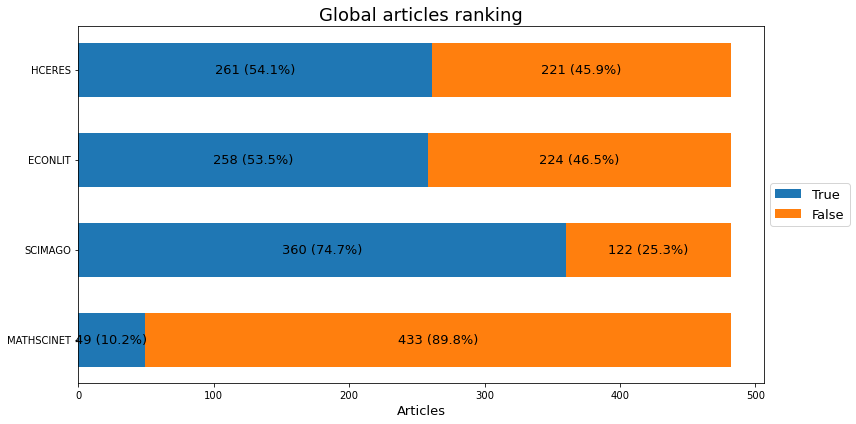

==> Create ranking plot Global for HCERES (filemane=global, params={})
  ==> Saved figure at "./exports/rankings_global_hceres.png"


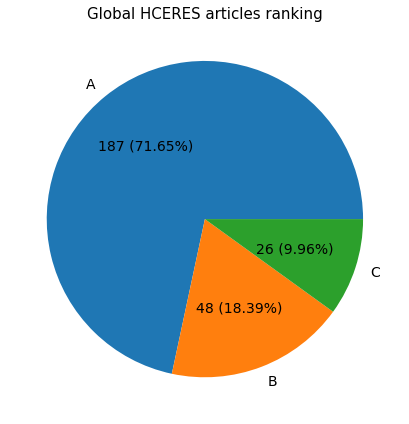

  ==> Saved figure at "./exports/rankings_global_distribution_of_articles_in_journal_classification_referentials.png"


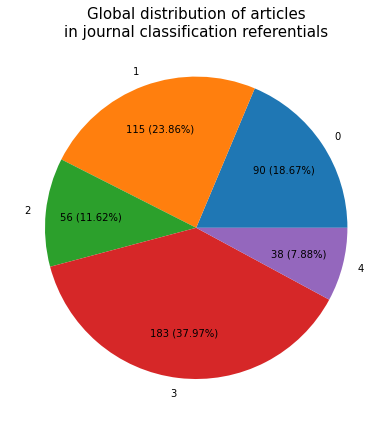

==> Create Scimago / HCERES matrix (filemane=global)
  ==> Saved Excel at "./exports/rankings_global_hceres_scimago_matrix.xlsx"
  ==> Saved Excel at "./exports/rankings_global_hceres_scimago_matrix_2.xlsx"
==> Process scimago ranking for Global (filemane=global)
  ==> Saved CSV at "./exports/rankings_global_scimago.csv"
  ==> Rework dataframe to group the less used categories (quantile=0.6)
  ==> Saved CSV at "./exports/rankings_global_scimago_filtered_0.csv"
  ==> Saved figure at "./exports/rankings_global_scimago_categories_0.png"


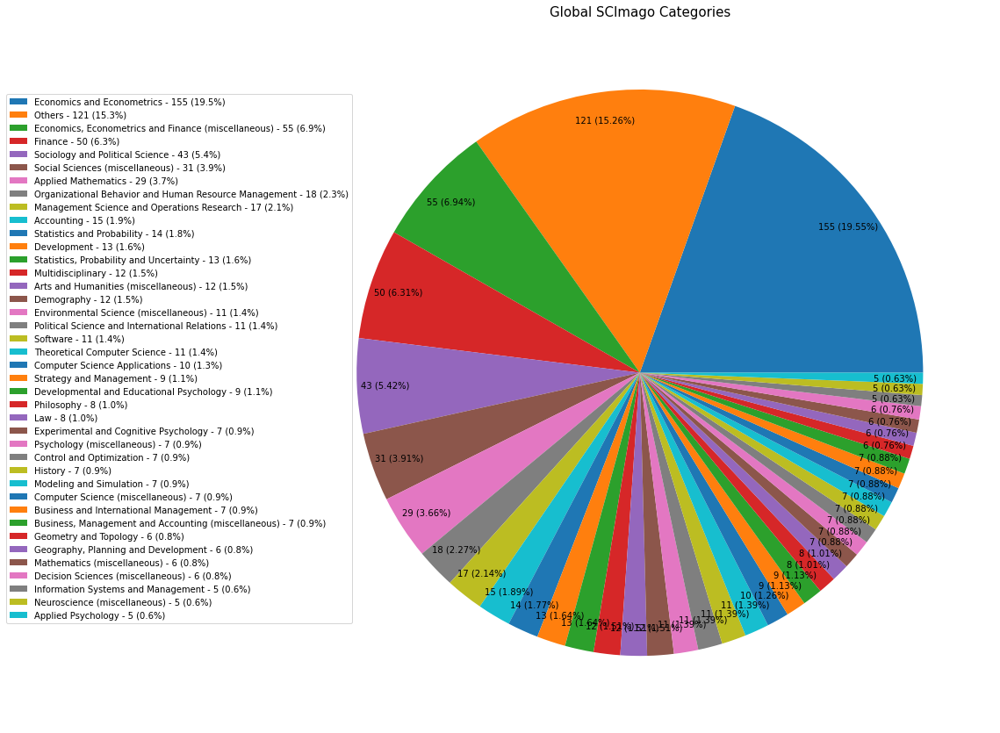

  ==> Saved figure at "./exports/rankings_global_scimago_sjr_q_score_0.png"


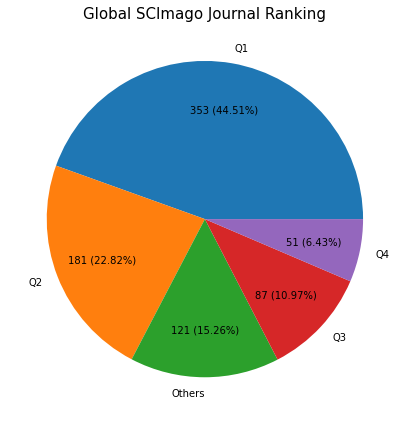

,uri_s,journalTitle_s,journalIssn_s,ECONLIT,MATHSCINET,SCIMAGO_CATEGORIES,SJR_BEST_QUARTILE,SCIMAGO,HCERES_CONRS_RANK,HCERES_FNEGE_RANK,HCERES_RANK,HCERES,NUMBER_OF_REFERENTIALS
0,https://hal.archives-ouvertes.fr/hal-03228974,History of Political Economy,0018-2702,True,False,History (Q1); Economics and Econometrics (Q2),Q1,True,1,NaN,A,True,3
1,https://hal.archives-ouvertes.fr/hal-03228955,Œconomia - History/Methodology/Philosophy,2113-5207,True,False,NaN,NaN,False,3,NaN,B,True,2
2,https://hal.archives-ouvertes.fr/hal-03231804,Chinese Business Review,1537-1506,False,False,NaN,NaN,False,NaN,NaN,NaN,False,0
3,https://hal.archives-ouvertes.fr/hal-03232617,Pôle Sud - Revue de science politique de l'Eur...,1262-1676,False,False,NaN,NaN,False,NaN,NaN,NaN,False,0
4,https://hal.archives-ouvertes.fr/hal-02098605,Scientific Reports,2045-2322,False,False,Multidisciplinary (Q1),Q1,True,NaN,NaN,NaN,False,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
477,https://hal.archives-ouvertes.fr/hal-02367200v3,Mathematical Finance,NaN,False,False,NaN,NaN,False,NaN,NaN,NaN,False,0
478,https://halshs.archives-ouvertes.fr/halshs-023...,Journal of Economic Behavior and Organization,NaN,False,False,NaN,NaN,False,NaN,NaN,NaN,False,0
479,https://halshs.archives-ouvertes.fr/halshs-032...,Economie et Statistique / Economics and Statis...,NaN,False,False,NaN,NaN,False,NaN,NaN,NaN,False,0
480,https://hal.archives-ouvertes.fr/hal-02093378,Journal of Public Economic Theory,NaN,False,False,NaN,NaN,False,NaN,NaN,NaN,False,0


In [64]:
ranking_df = rankings(df, title='Global', filename='global')
scimago_hceres_matrix(ranking_df, filename='global')
scimago_rankings(ranking_df, title='Global', filename='global', quantile=0.6)
ranking_df

### By Teams

=> process team: N/A
==> Process generic ranking for N/A: (filemane=by_teams_N_A)
  ==> Saved CSV at "./exports/rankings_by_teams_N_A.png"
  ==> Saved CSV at "./exports/rankings_by_teams_N_A_count.csv"
  ==> Saved figure at "./exports/rankings_by_teams_N_A_general.png"


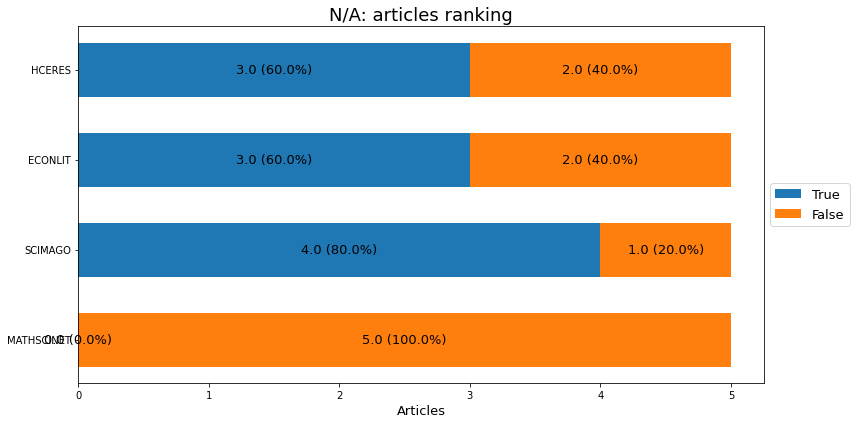

==> Create ranking plot N/A: for HCERES (filemane=by_teams_N_A, params={})
  ==> Saved figure at "./exports/rankings_by_teams_N_A_hceres.png"


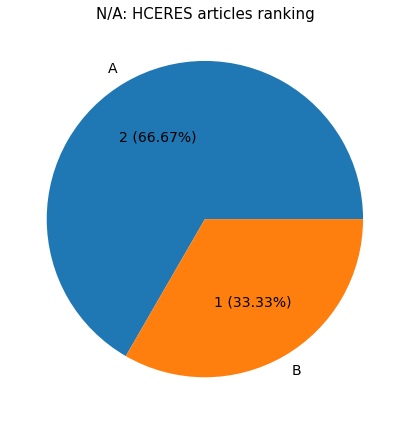

  ==> Saved figure at "./exports/rankings_by_teams_N_A_distribution_of_articles_in_journal_classification_referentials.png"


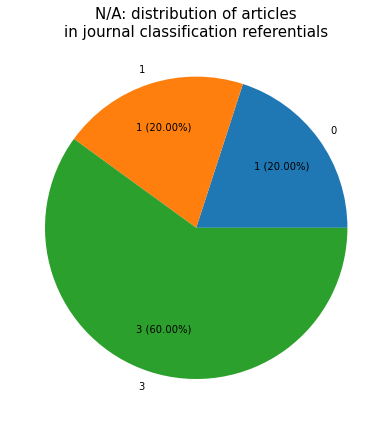

==> Create Scimago / HCERES matrix (filemane=by_teams_N_A)
  ==> Saved Excel at "./exports/rankings_by_teams_N_A_hceres_scimago_matrix.xlsx"
  ==> Saved Excel at "./exports/rankings_by_teams_N_A_hceres_scimago_matrix_2.xlsx"
==> Process scimago ranking for N/A: (filemane=by_teams_N_A)
  ==> Saved CSV at "./exports/rankings_by_teams_N_A_scimago.csv"
  ==> Saved CSV at "./exports/rankings_by_teams_N_A_scimago_filtered_0.csv"
  ==> Saved figure at "./exports/rankings_by_teams_N_A_scimago_categories_0.png"


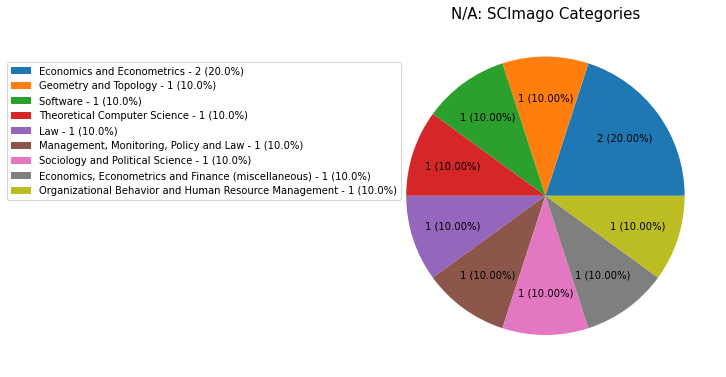

  ==> Saved figure at "./exports/rankings_by_teams_N_A_scimago_sjr_q_score_0.png"


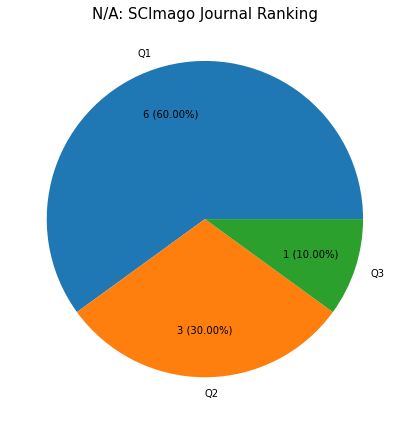

==> Process scimago ranking for N/A: (filemane=by_teams_N_A)
  ==> Saved CSV at "./exports/rankings_by_teams_N_A_scimago.csv"
  ==> Saved CSV at "./exports/rankings_by_teams_N_A_scimago_filtered_1.csv"
  ==> Saved figure at "./exports/rankings_by_teams_N_A_scimago_categories_1.png"


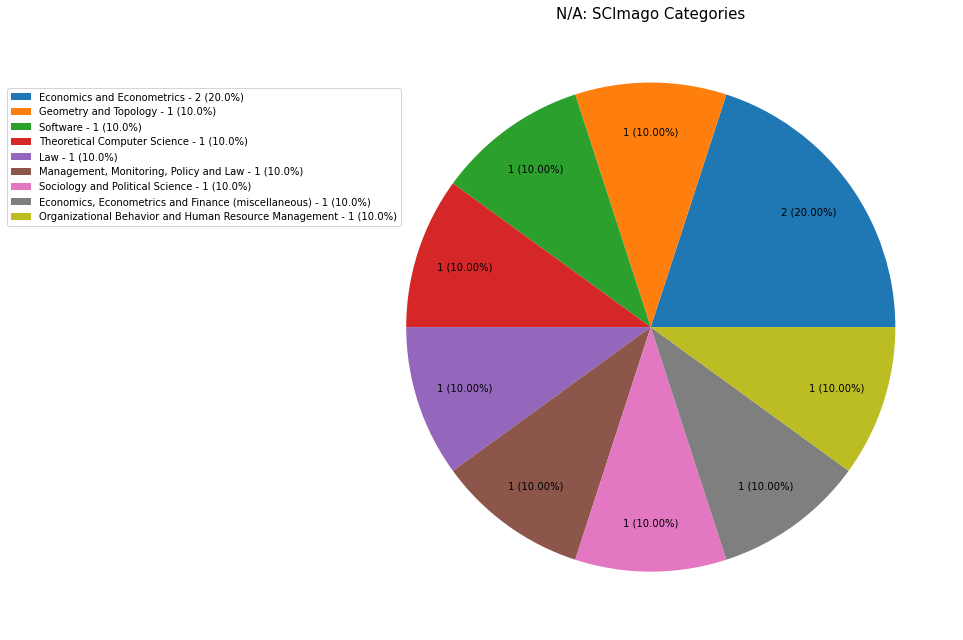

  ==> Saved figure at "./exports/rankings_by_teams_N_A_scimago_sjr_q_score_1.png"


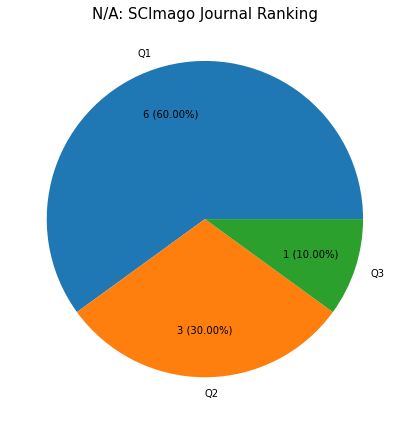

==> Process scimago ranking for N/A: (filemane=by_teams_N_A)
  ==> Saved CSV at "./exports/rankings_by_teams_N_A_scimago.csv"
  ==> Rework dataframe to group the less used categories (quantile=0.005)
  ==> Saved CSV at "./exports/rankings_by_teams_N_A_scimago_filtered_2.csv"
  ==> Saved figure at "./exports/rankings_by_teams_N_A_scimago_categories_2.png"


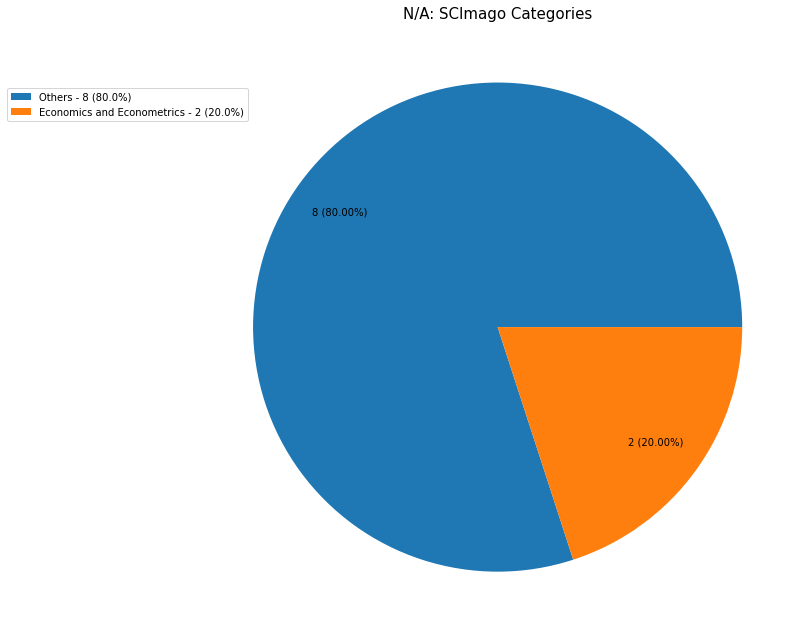

  ==> Saved figure at "./exports/rankings_by_teams_N_A_scimago_sjr_q_score_2.png"


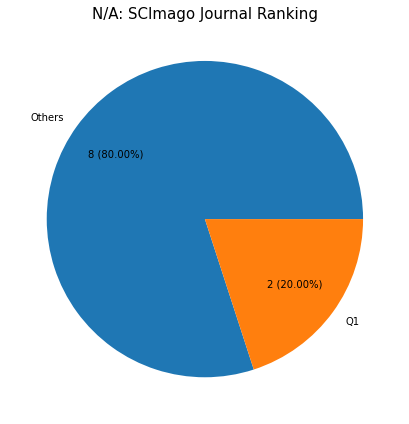

=> process team: globalisation financière
==> Process generic ranking for globalisation financière: (filemane=by_teams_globalisation_financiere)
  ==> Saved CSV at "./exports/rankings_by_teams_globalisation_financiere.png"
  ==> Saved CSV at "./exports/rankings_by_teams_globalisation_financiere_count.csv"
  ==> Saved figure at "./exports/rankings_by_teams_globalisation_financiere_general.png"


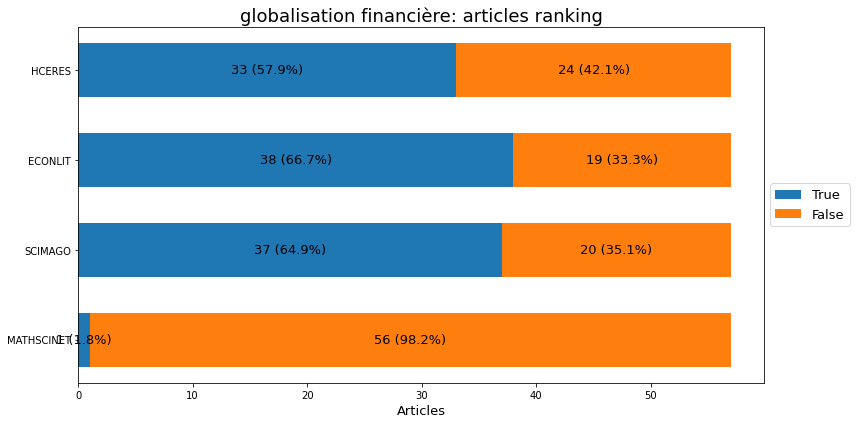

==> Create ranking plot globalisation financière: for HCERES (filemane=by_teams_globalisation_financiere, params={})
  ==> Saved figure at "./exports/rankings_by_teams_globalisation_financiere_hceres.png"


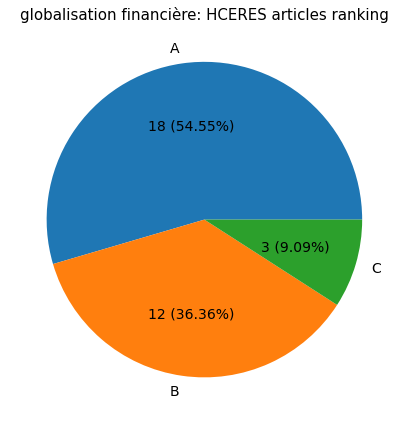

  ==> Saved figure at "./exports/rankings_by_teams_globalisation_financiere_distribution_of_articles_in_journal_classification_referentials.png"


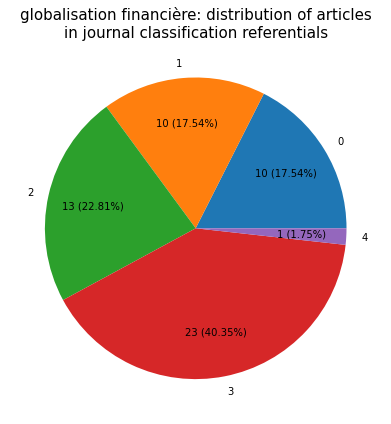

==> Create Scimago / HCERES matrix (filemane=by_teams_globalisation_financiere)
  ==> Saved Excel at "./exports/rankings_by_teams_globalisation_financiere_hceres_scimago_matrix.xlsx"
  ==> Saved Excel at "./exports/rankings_by_teams_globalisation_financiere_hceres_scimago_matrix_2.xlsx"
==> Process scimago ranking for globalisation financière: (filemane=by_teams_globalisation_financiere)
  ==> Saved CSV at "./exports/rankings_by_teams_globalisation_financiere_scimago.csv"
  ==> Saved CSV at "./exports/rankings_by_teams_globalisation_financiere_scimago_filtered_0.csv"
  ==> Saved figure at "./exports/rankings_by_teams_globalisation_financiere_scimago_categories_0.png"


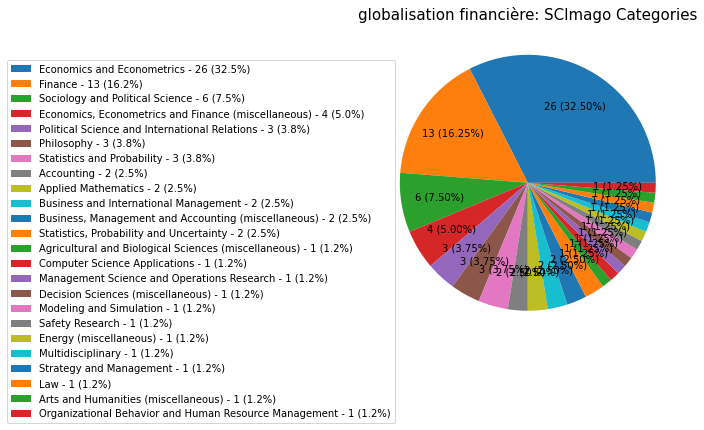

  ==> Saved figure at "./exports/rankings_by_teams_globalisation_financiere_scimago_sjr_q_score_0.png"


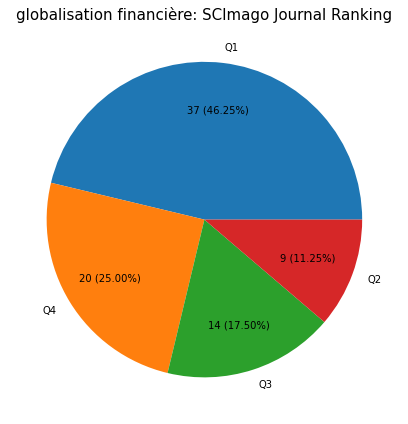

==> Process scimago ranking for globalisation financière: (filemane=by_teams_globalisation_financiere)
  ==> Saved CSV at "./exports/rankings_by_teams_globalisation_financiere_scimago.csv"
  ==> Saved CSV at "./exports/rankings_by_teams_globalisation_financiere_scimago_filtered_1.csv"
  ==> Saved figure at "./exports/rankings_by_teams_globalisation_financiere_scimago_categories_1.png"


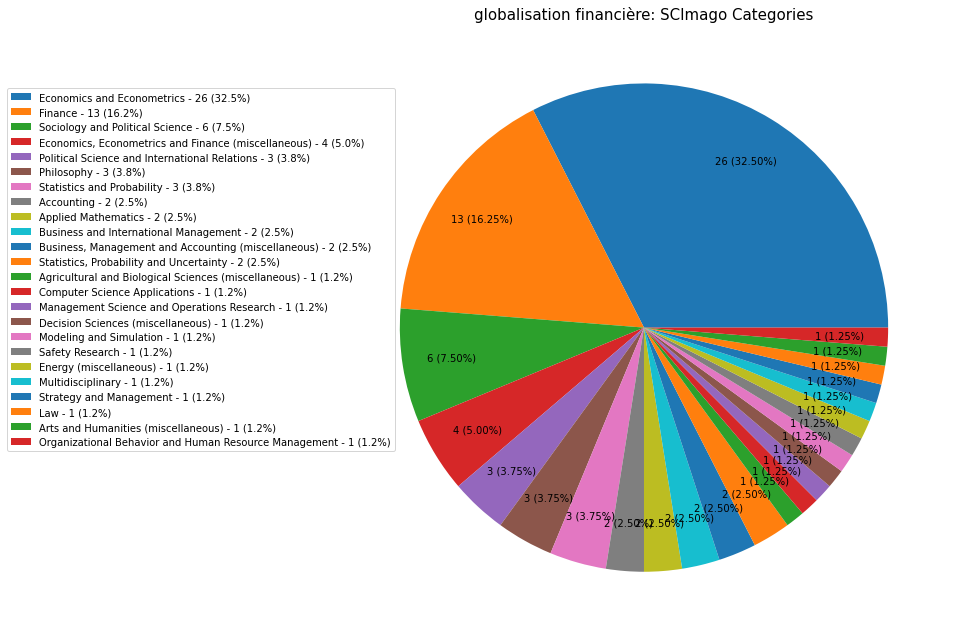

  ==> Saved figure at "./exports/rankings_by_teams_globalisation_financiere_scimago_sjr_q_score_1.png"


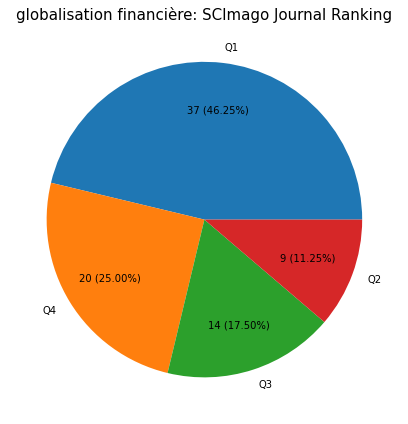

==> Process scimago ranking for globalisation financière: (filemane=by_teams_globalisation_financiere)
  ==> Saved CSV at "./exports/rankings_by_teams_globalisation_financiere_scimago.csv"
  ==> Rework dataframe to group the less used categories (quantile=0.005)
  ==> Saved CSV at "./exports/rankings_by_teams_globalisation_financiere_scimago_filtered_2.csv"
  ==> Saved figure at "./exports/rankings_by_teams_globalisation_financiere_scimago_categories_2.png"


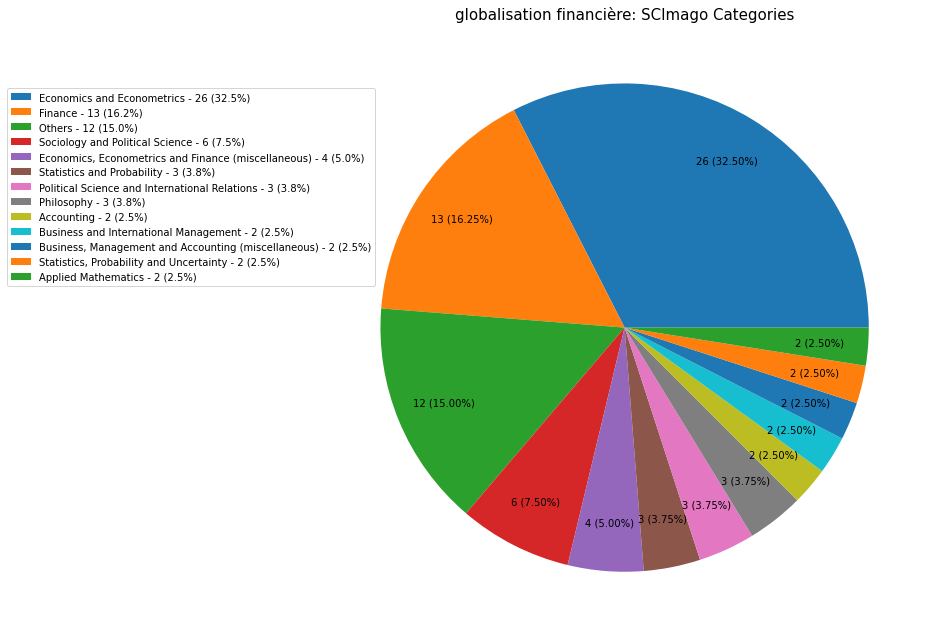

  ==> Saved figure at "./exports/rankings_by_teams_globalisation_financiere_scimago_sjr_q_score_2.png"


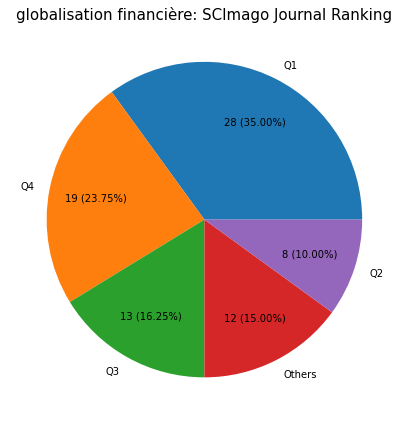

=> process team: microéconomie théorique
==> Process generic ranking for microéconomie théorique: (filemane=by_teams_microeconomie_theorique)
  ==> Saved CSV at "./exports/rankings_by_teams_microeconomie_theorique.png"
  ==> Saved CSV at "./exports/rankings_by_teams_microeconomie_theorique_count.csv"
  ==> Saved figure at "./exports/rankings_by_teams_microeconomie_theorique_general.png"


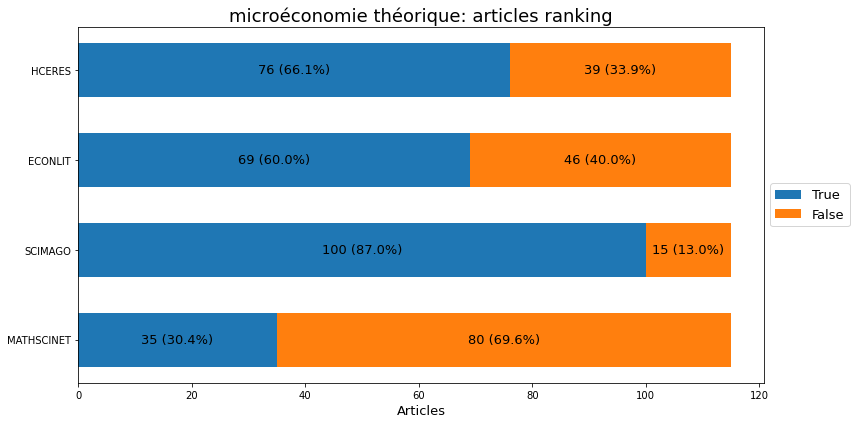

==> Create ranking plot microéconomie théorique: for HCERES (filemane=by_teams_microeconomie_theorique, params={})
  ==> Saved figure at "./exports/rankings_by_teams_microeconomie_theorique_hceres.png"


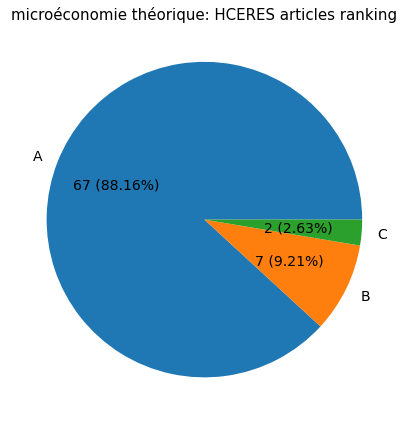

  ==> Saved figure at "./exports/rankings_by_teams_microeconomie_theorique_distribution_of_articles_in_journal_classification_referentials.png"


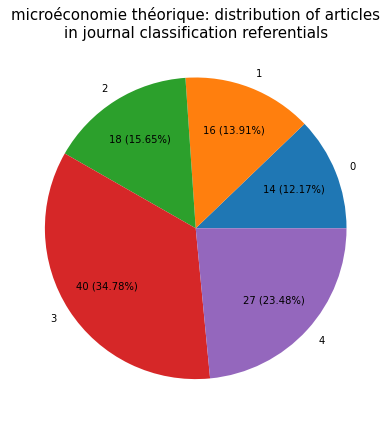

==> Create Scimago / HCERES matrix (filemane=by_teams_microeconomie_theorique)
  ==> Saved Excel at "./exports/rankings_by_teams_microeconomie_theorique_hceres_scimago_matrix.xlsx"
  ==> Saved Excel at "./exports/rankings_by_teams_microeconomie_theorique_hceres_scimago_matrix_2.xlsx"
==> Process scimago ranking for microéconomie théorique: (filemane=by_teams_microeconomie_theorique)
  ==> Saved CSV at "./exports/rankings_by_teams_microeconomie_theorique_scimago.csv"
  ==> Saved CSV at "./exports/rankings_by_teams_microeconomie_theorique_scimago_filtered_0.csv"
  ==> Saved figure at "./exports/rankings_by_teams_microeconomie_theorique_scimago_categories_0.png"


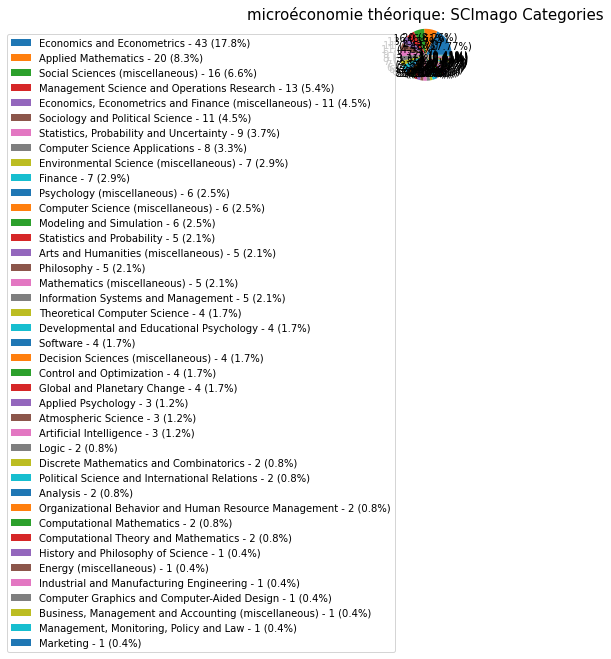

  ==> Saved figure at "./exports/rankings_by_teams_microeconomie_theorique_scimago_sjr_q_score_0.png"


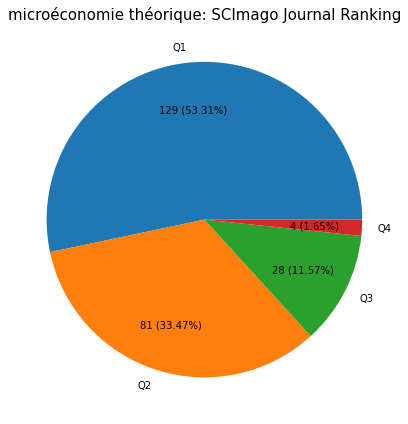

==> Process scimago ranking for microéconomie théorique: (filemane=by_teams_microeconomie_theorique)
  ==> Saved CSV at "./exports/rankings_by_teams_microeconomie_theorique_scimago.csv"
  ==> Saved CSV at "./exports/rankings_by_teams_microeconomie_theorique_scimago_filtered_1.csv"
  ==> Saved figure at "./exports/rankings_by_teams_microeconomie_theorique_scimago_categories_1.png"


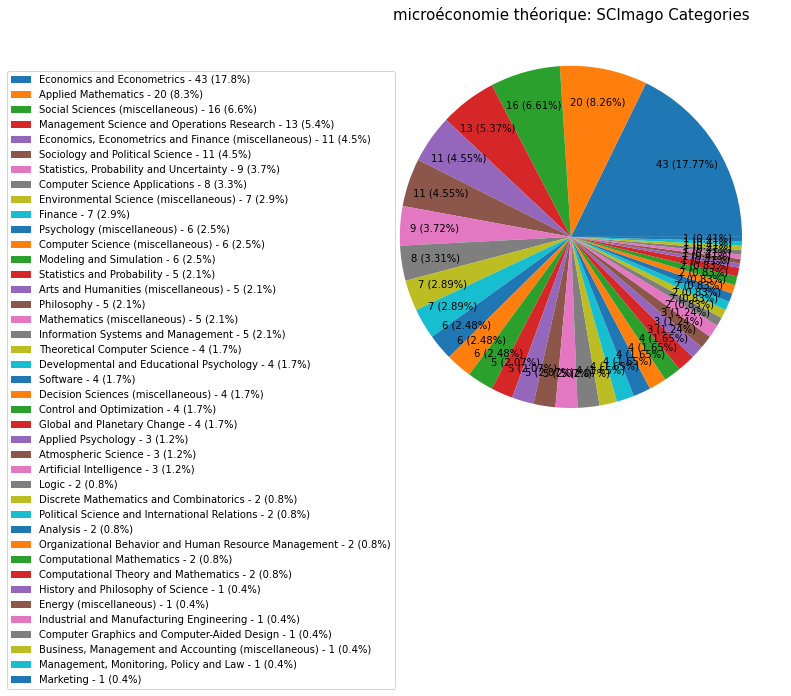

  ==> Saved figure at "./exports/rankings_by_teams_microeconomie_theorique_scimago_sjr_q_score_1.png"


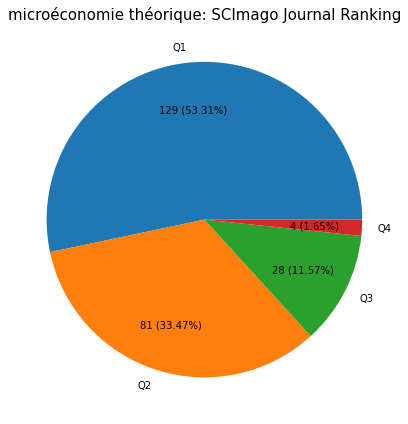

==> Process scimago ranking for microéconomie théorique: (filemane=by_teams_microeconomie_theorique)
  ==> Saved CSV at "./exports/rankings_by_teams_microeconomie_theorique_scimago.csv"
  ==> Rework dataframe to group the less used categories (quantile=0.005)
  ==> Saved CSV at "./exports/rankings_by_teams_microeconomie_theorique_scimago_filtered_2.csv"
  ==> Saved figure at "./exports/rankings_by_teams_microeconomie_theorique_scimago_categories_2.png"


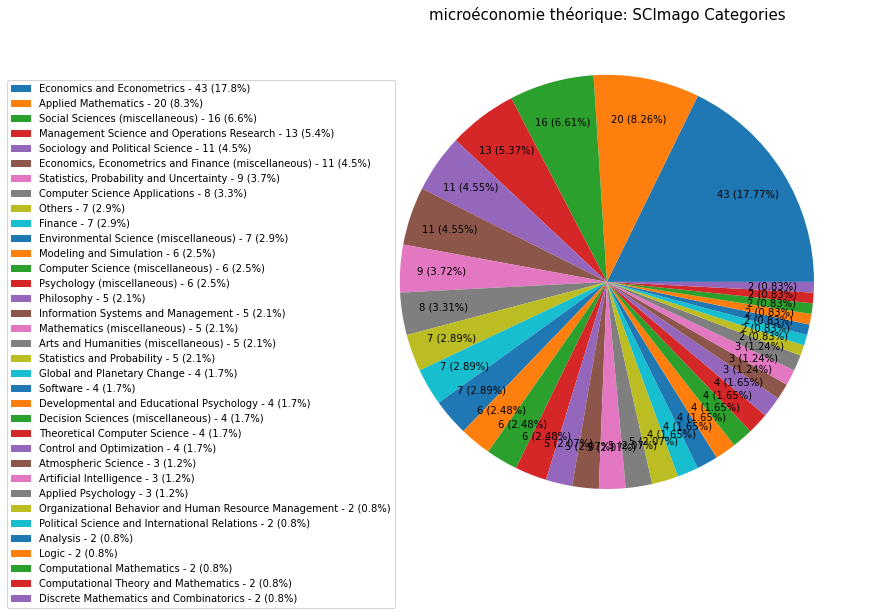

  ==> Saved figure at "./exports/rankings_by_teams_microeconomie_theorique_scimago_sjr_q_score_2.png"


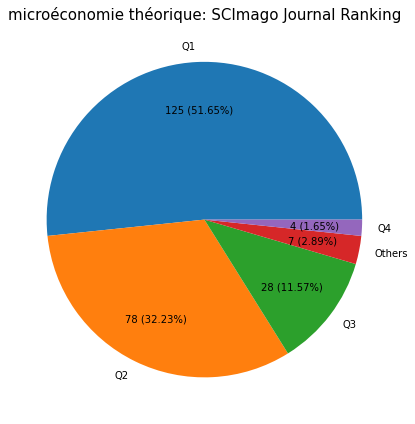

=> process team: modélisation financière
==> Process generic ranking for modélisation financière: (filemane=by_teams_modelisation_financiere)
  ==> Saved CSV at "./exports/rankings_by_teams_modelisation_financiere.png"
  ==> Saved CSV at "./exports/rankings_by_teams_modelisation_financiere_count.csv"
  ==> Saved figure at "./exports/rankings_by_teams_modelisation_financiere_general.png"


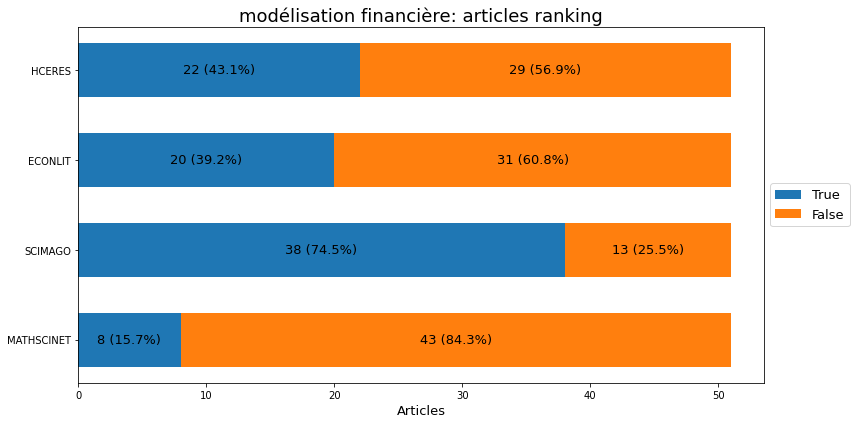

==> Create ranking plot modélisation financière: for HCERES (filemane=by_teams_modelisation_financiere, params={})
  ==> Saved figure at "./exports/rankings_by_teams_modelisation_financiere_hceres.png"


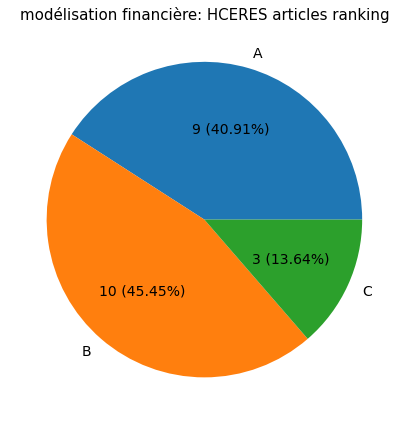

  ==> Saved figure at "./exports/rankings_by_teams_modelisation_financiere_distribution_of_articles_in_journal_classification_referentials.png"


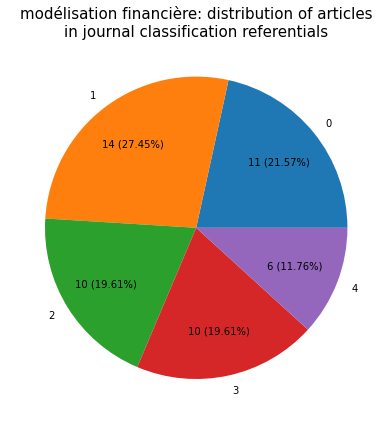

==> Create Scimago / HCERES matrix (filemane=by_teams_modelisation_financiere)
  ==> Saved Excel at "./exports/rankings_by_teams_modelisation_financiere_hceres_scimago_matrix.xlsx"
  ==> Saved Excel at "./exports/rankings_by_teams_modelisation_financiere_hceres_scimago_matrix_2.xlsx"
==> Process scimago ranking for modélisation financière: (filemane=by_teams_modelisation_financiere)
  ==> Saved CSV at "./exports/rankings_by_teams_modelisation_financiere_scimago.csv"
  ==> Saved CSV at "./exports/rankings_by_teams_modelisation_financiere_scimago_filtered_0.csv"
  ==> Saved figure at "./exports/rankings_by_teams_modelisation_financiere_scimago_categories_0.png"


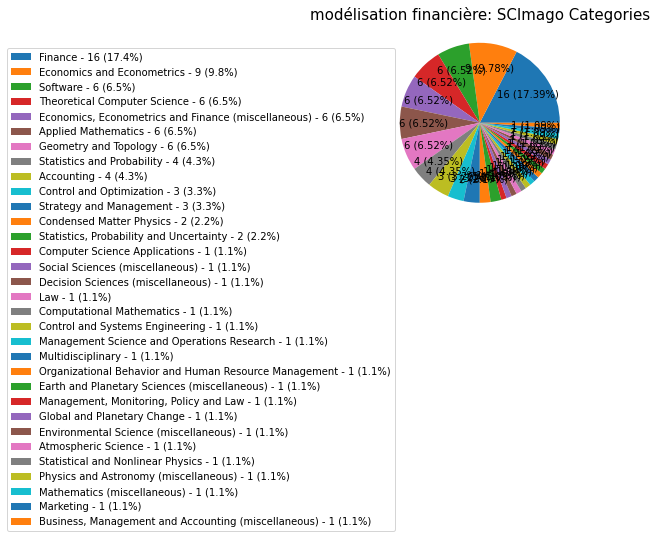

  ==> Saved figure at "./exports/rankings_by_teams_modelisation_financiere_scimago_sjr_q_score_0.png"


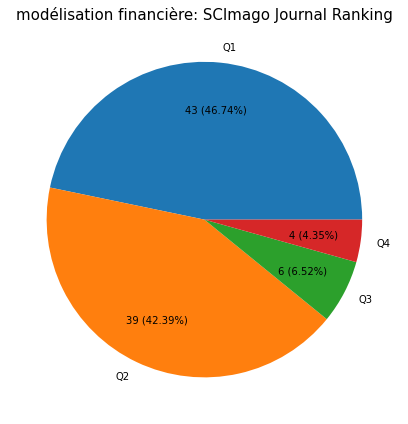

==> Process scimago ranking for modélisation financière: (filemane=by_teams_modelisation_financiere)
  ==> Saved CSV at "./exports/rankings_by_teams_modelisation_financiere_scimago.csv"
  ==> Saved CSV at "./exports/rankings_by_teams_modelisation_financiere_scimago_filtered_1.csv"
  ==> Saved figure at "./exports/rankings_by_teams_modelisation_financiere_scimago_categories_1.png"


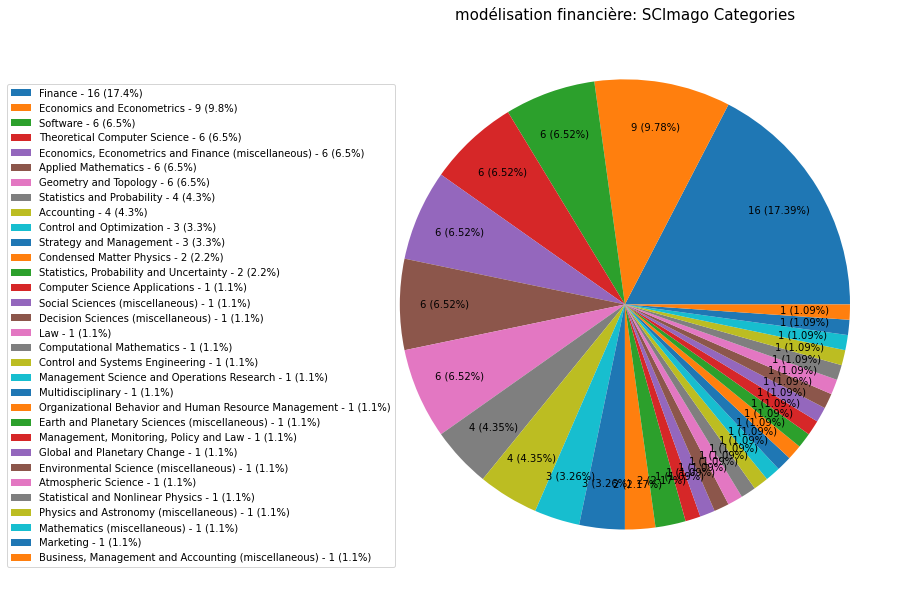

  ==> Saved figure at "./exports/rankings_by_teams_modelisation_financiere_scimago_sjr_q_score_1.png"


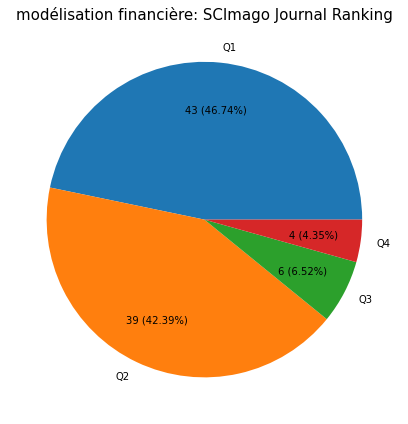

==> Process scimago ranking for modélisation financière: (filemane=by_teams_modelisation_financiere)
  ==> Saved CSV at "./exports/rankings_by_teams_modelisation_financiere_scimago.csv"
  ==> Rework dataframe to group the less used categories (quantile=0.005)
  ==> Saved CSV at "./exports/rankings_by_teams_modelisation_financiere_scimago_filtered_2.csv"
  ==> Saved figure at "./exports/rankings_by_teams_modelisation_financiere_scimago_categories_2.png"


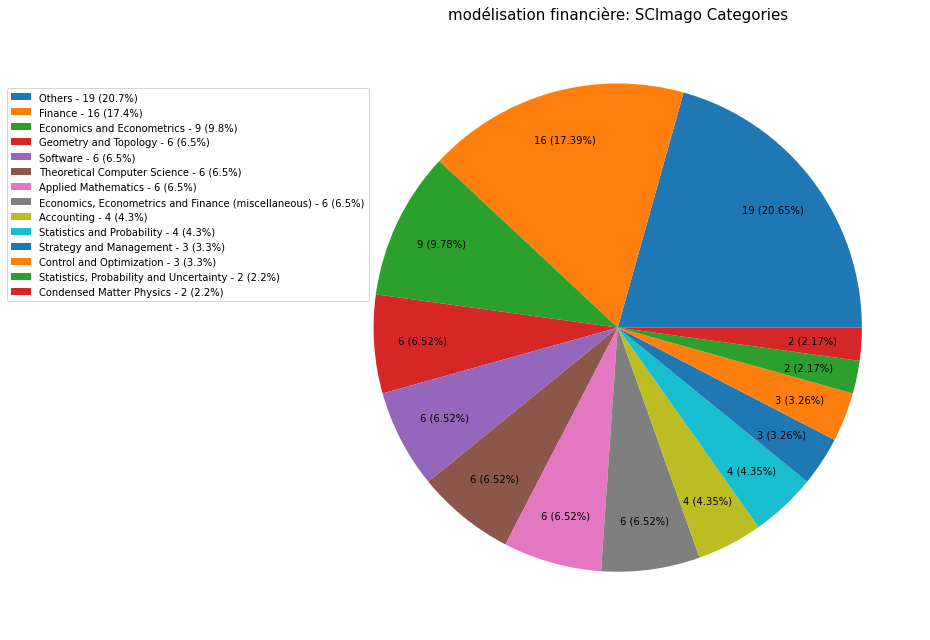

  ==> Saved figure at "./exports/rankings_by_teams_modelisation_financiere_scimago_sjr_q_score_2.png"


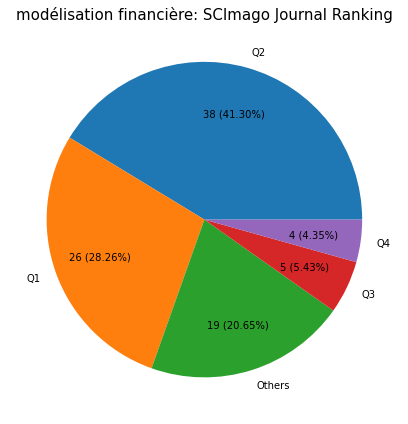

=> process team: politiques publiques
==> Process generic ranking for politiques publiques: (filemane=by_teams_politiques_publiques)
  ==> Saved CSV at "./exports/rankings_by_teams_politiques_publiques.png"
  ==> Saved CSV at "./exports/rankings_by_teams_politiques_publiques_count.csv"
  ==> Saved figure at "./exports/rankings_by_teams_politiques_publiques_general.png"


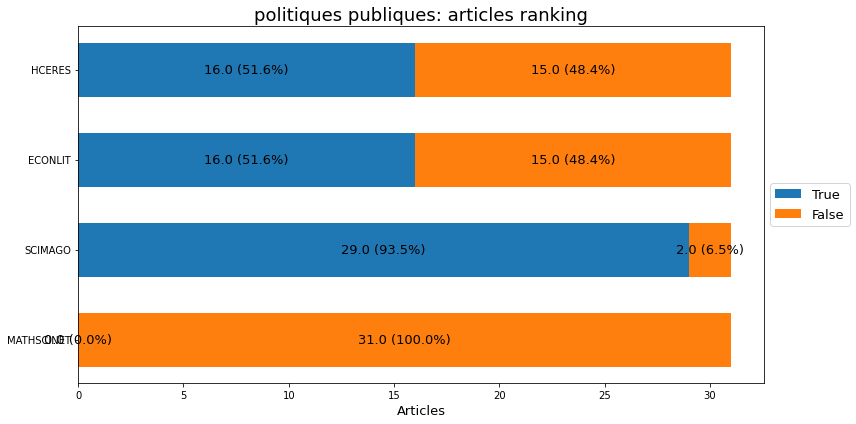

==> Create ranking plot politiques publiques: for HCERES (filemane=by_teams_politiques_publiques, params={})
  ==> Saved figure at "./exports/rankings_by_teams_politiques_publiques_hceres.png"


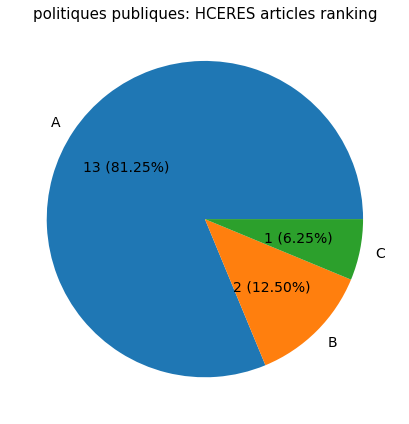

  ==> Saved figure at "./exports/rankings_by_teams_politiques_publiques_distribution_of_articles_in_journal_classification_referentials.png"


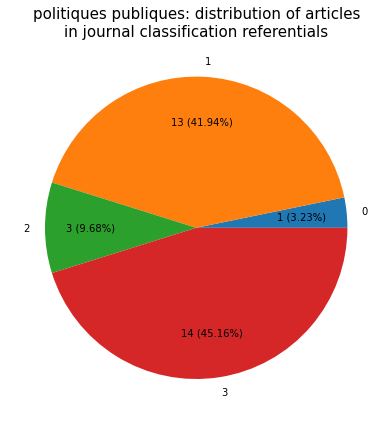

==> Create Scimago / HCERES matrix (filemane=by_teams_politiques_publiques)
  ==> Saved Excel at "./exports/rankings_by_teams_politiques_publiques_hceres_scimago_matrix.xlsx"
  ==> Saved Excel at "./exports/rankings_by_teams_politiques_publiques_hceres_scimago_matrix_2.xlsx"
==> Process scimago ranking for politiques publiques: (filemane=by_teams_politiques_publiques)
  ==> Saved CSV at "./exports/rankings_by_teams_politiques_publiques_scimago.csv"
  ==> Saved CSV at "./exports/rankings_by_teams_politiques_publiques_scimago_filtered_0.csv"
  ==> Saved figure at "./exports/rankings_by_teams_politiques_publiques_scimago_categories_0.png"


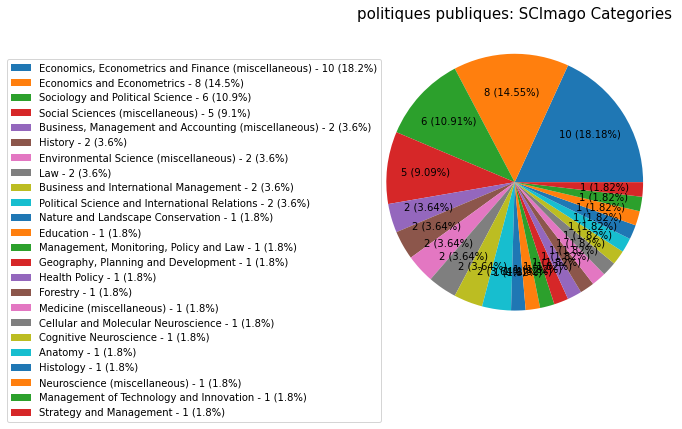

  ==> Saved figure at "./exports/rankings_by_teams_politiques_publiques_scimago_sjr_q_score_0.png"


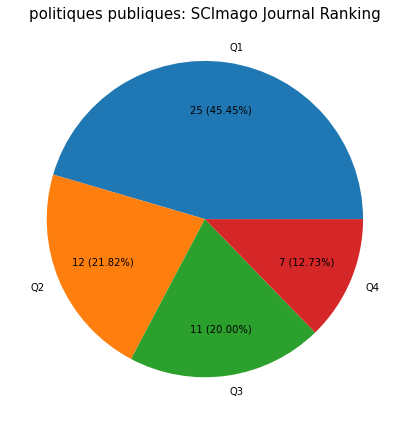

==> Process scimago ranking for politiques publiques: (filemane=by_teams_politiques_publiques)
  ==> Saved CSV at "./exports/rankings_by_teams_politiques_publiques_scimago.csv"
  ==> Saved CSV at "./exports/rankings_by_teams_politiques_publiques_scimago_filtered_1.csv"
  ==> Saved figure at "./exports/rankings_by_teams_politiques_publiques_scimago_categories_1.png"


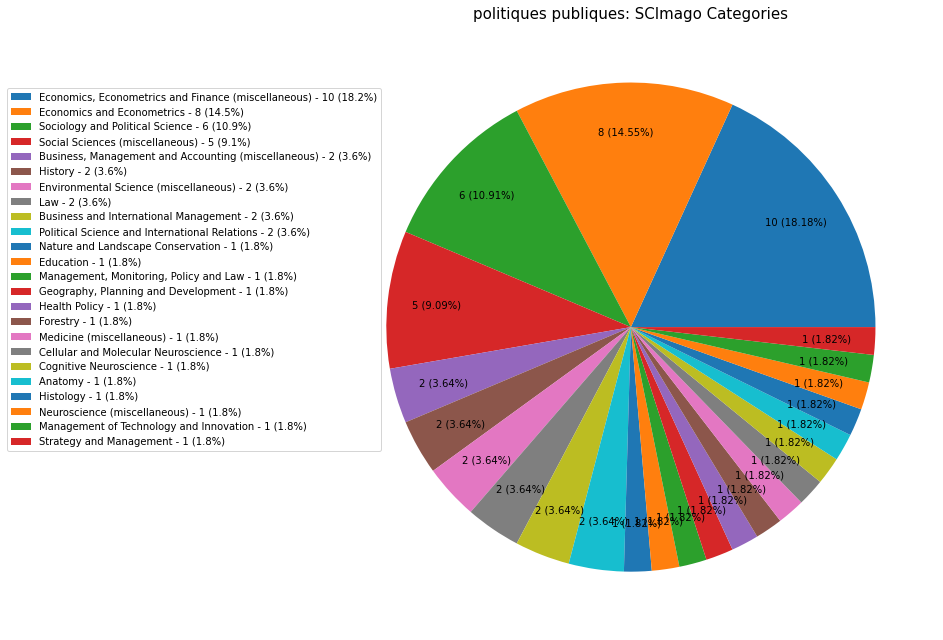

  ==> Saved figure at "./exports/rankings_by_teams_politiques_publiques_scimago_sjr_q_score_1.png"


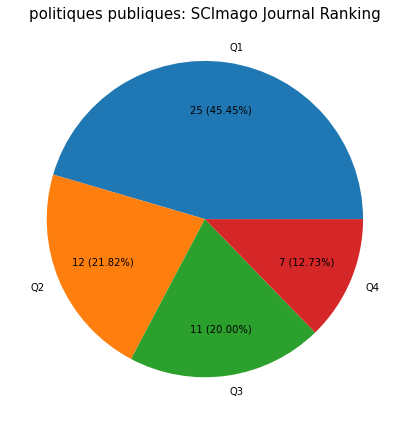

==> Process scimago ranking for politiques publiques: (filemane=by_teams_politiques_publiques)
  ==> Saved CSV at "./exports/rankings_by_teams_politiques_publiques_scimago.csv"
  ==> Rework dataframe to group the less used categories (quantile=0.005)
  ==> Saved CSV at "./exports/rankings_by_teams_politiques_publiques_scimago_filtered_2.csv"
  ==> Saved figure at "./exports/rankings_by_teams_politiques_publiques_scimago_categories_2.png"


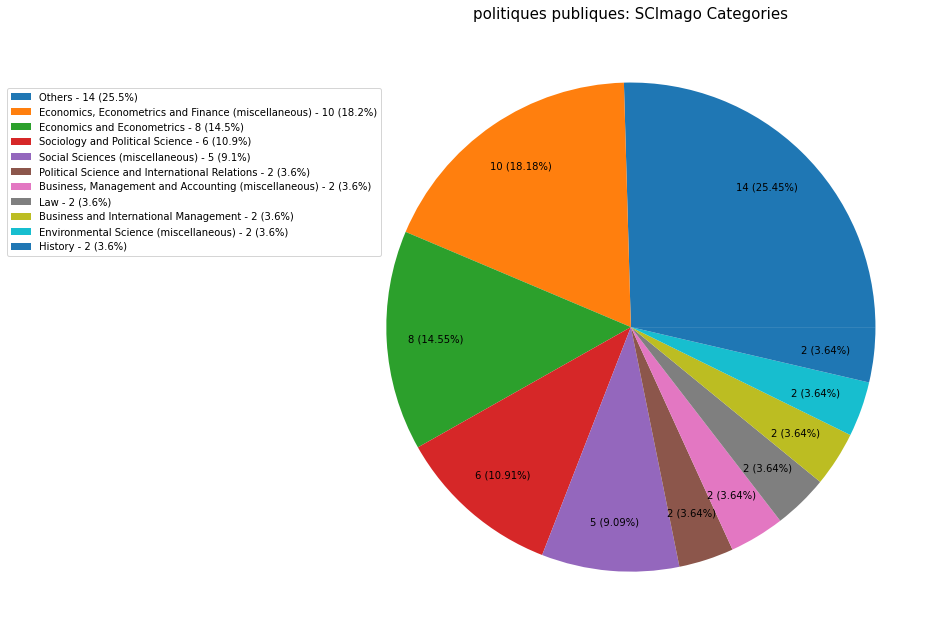

  ==> Saved figure at "./exports/rankings_by_teams_politiques_publiques_scimago_sjr_q_score_2.png"


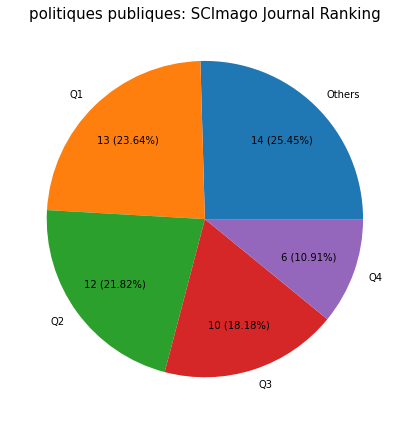

=> process team: sciences du comportement
==> Process generic ranking for sciences du comportement: (filemane=by_teams_sciences_du_comportement)
  ==> Saved CSV at "./exports/rankings_by_teams_sciences_du_comportement.png"
  ==> Saved CSV at "./exports/rankings_by_teams_sciences_du_comportement_count.csv"
  ==> Saved figure at "./exports/rankings_by_teams_sciences_du_comportement_general.png"


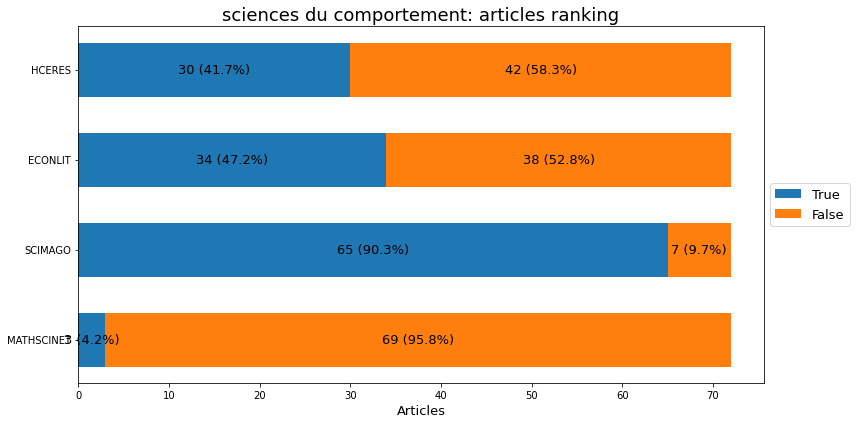

==> Create ranking plot sciences du comportement: for HCERES (filemane=by_teams_sciences_du_comportement, params={})
  ==> Saved figure at "./exports/rankings_by_teams_sciences_du_comportement_hceres.png"


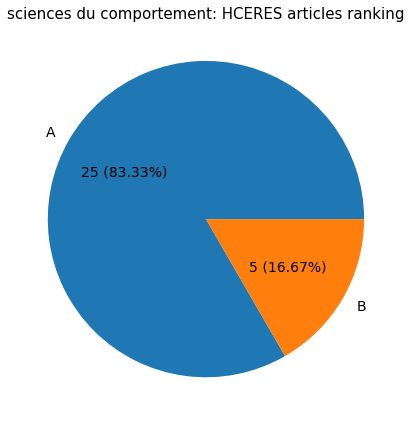

  ==> Saved figure at "./exports/rankings_by_teams_sciences_du_comportement_distribution_of_articles_in_journal_classification_referentials.png"


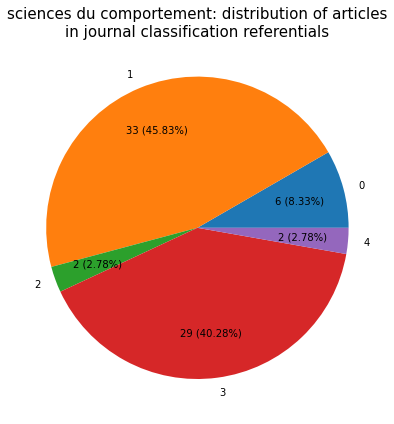

==> Create Scimago / HCERES matrix (filemane=by_teams_sciences_du_comportement)
  ==> Saved Excel at "./exports/rankings_by_teams_sciences_du_comportement_hceres_scimago_matrix.xlsx"
  ==> Saved Excel at "./exports/rankings_by_teams_sciences_du_comportement_hceres_scimago_matrix_2.xlsx"
==> Process scimago ranking for sciences du comportement: (filemane=by_teams_sciences_du_comportement)
  ==> Saved CSV at "./exports/rankings_by_teams_sciences_du_comportement_scimago.csv"
  ==> Saved CSV at "./exports/rankings_by_teams_sciences_du_comportement_scimago_filtered_0.csv"


/tmp/ipykernel_478/2119042945.py:20: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


  ==> Saved figure at "./exports/rankings_by_teams_sciences_du_comportement_scimago_categories_0.png"


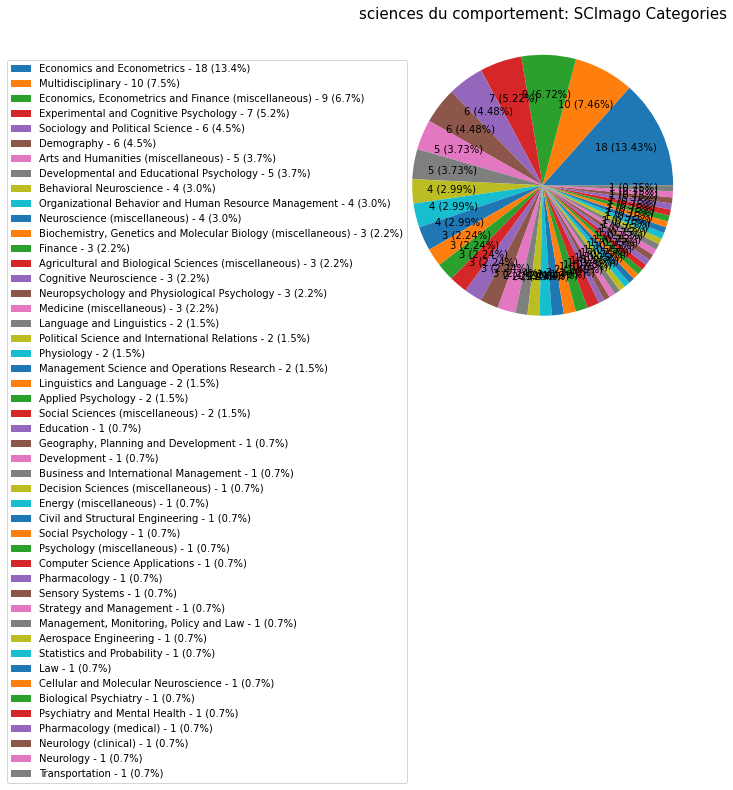

  ==> Saved figure at "./exports/rankings_by_teams_sciences_du_comportement_scimago_sjr_q_score_0.png"


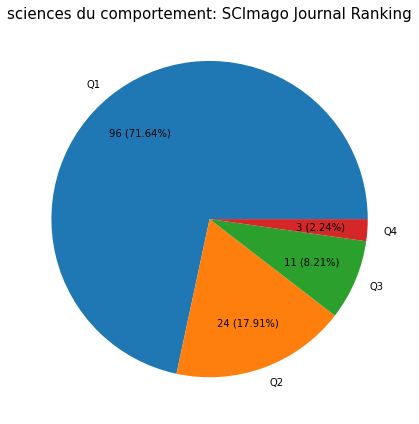

==> Process scimago ranking for sciences du comportement: (filemane=by_teams_sciences_du_comportement)
  ==> Saved CSV at "./exports/rankings_by_teams_sciences_du_comportement_scimago.csv"
  ==> Saved CSV at "./exports/rankings_by_teams_sciences_du_comportement_scimago_filtered_1.csv"
  ==> Saved figure at "./exports/rankings_by_teams_sciences_du_comportement_scimago_categories_1.png"


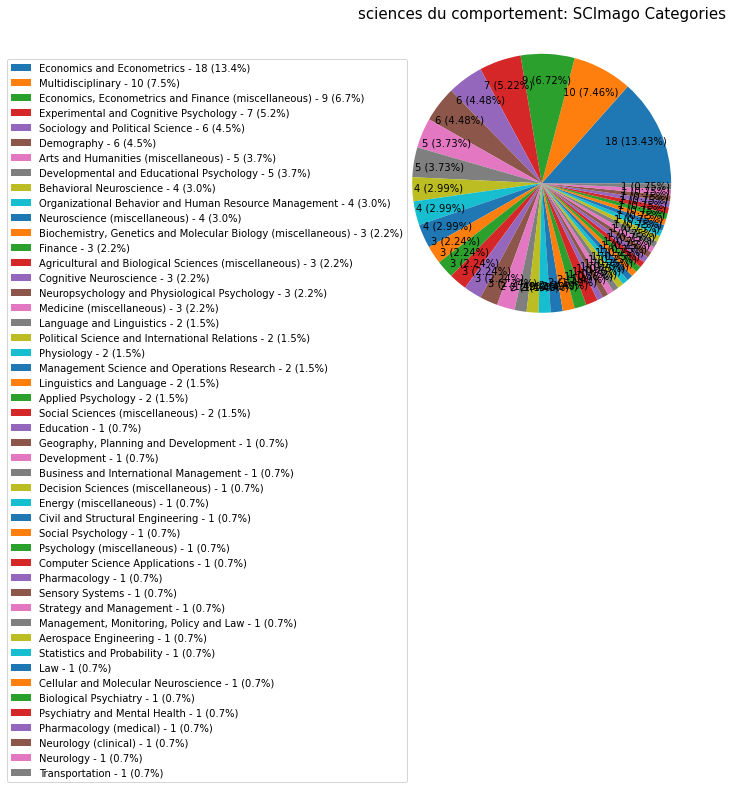

  ==> Saved figure at "./exports/rankings_by_teams_sciences_du_comportement_scimago_sjr_q_score_1.png"


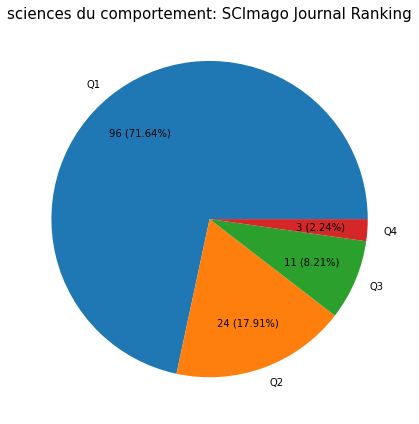

==> Process scimago ranking for sciences du comportement: (filemane=by_teams_sciences_du_comportement)
  ==> Saved CSV at "./exports/rankings_by_teams_sciences_du_comportement_scimago.csv"
  ==> Rework dataframe to group the less used categories (quantile=0.005)
  ==> Saved CSV at "./exports/rankings_by_teams_sciences_du_comportement_scimago_filtered_2.csv"
  ==> Saved figure at "./exports/rankings_by_teams_sciences_du_comportement_scimago_categories_2.png"


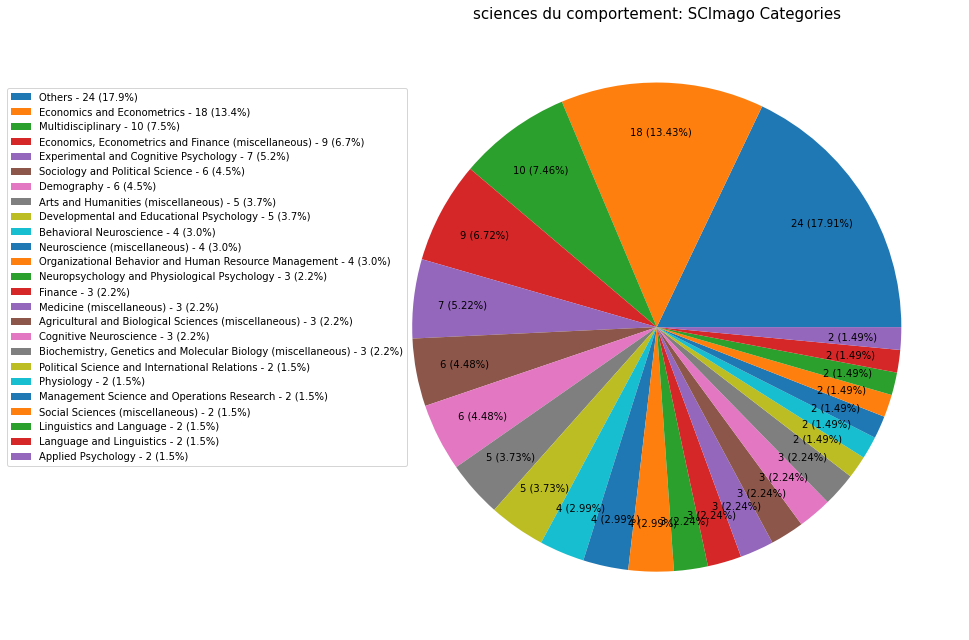

  ==> Saved figure at "./exports/rankings_by_teams_sciences_du_comportement_scimago_sjr_q_score_2.png"


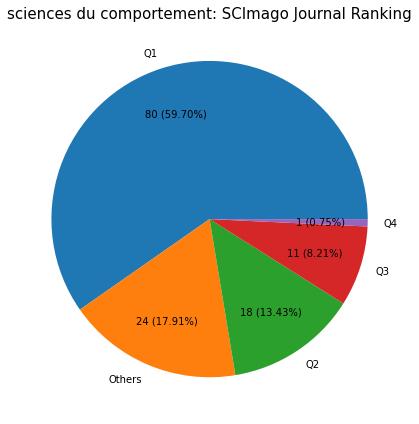

=> process team: économie du développement
==> Process generic ranking for économie du développement: (filemane=by_teams_economie_du_developpement)
  ==> Saved CSV at "./exports/rankings_by_teams_economie_du_developpement.png"
  ==> Saved CSV at "./exports/rankings_by_teams_economie_du_developpement_count.csv"
  ==> Saved figure at "./exports/rankings_by_teams_economie_du_developpement_general.png"


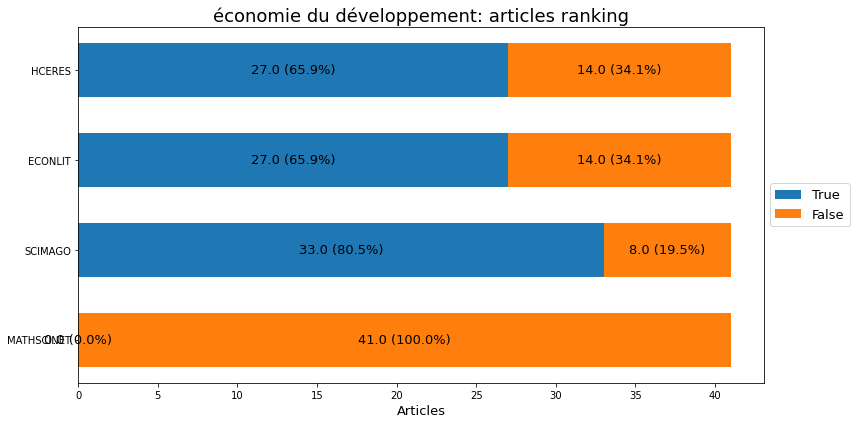

==> Create ranking plot économie du développement: for HCERES (filemane=by_teams_economie_du_developpement, params={})
  ==> Saved figure at "./exports/rankings_by_teams_economie_du_developpement_hceres.png"


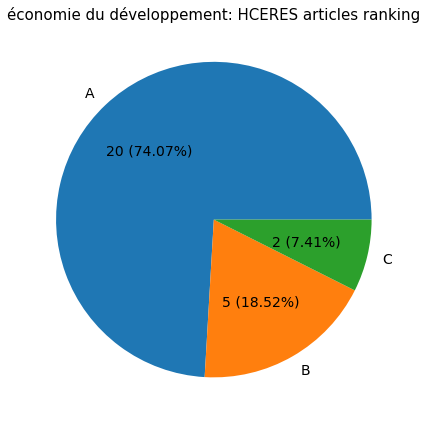

  ==> Saved figure at "./exports/rankings_by_teams_economie_du_developpement_distribution_of_articles_in_journal_classification_referentials.png"


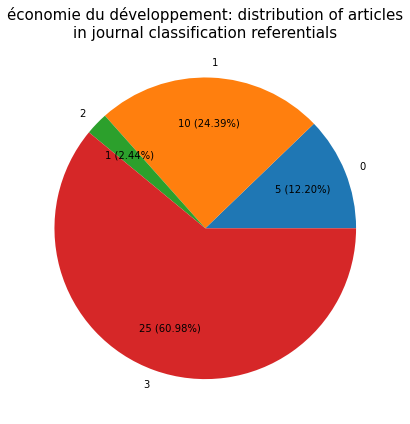

==> Create Scimago / HCERES matrix (filemane=by_teams_economie_du_developpement)
  ==> Saved Excel at "./exports/rankings_by_teams_economie_du_developpement_hceres_scimago_matrix.xlsx"
  ==> Saved Excel at "./exports/rankings_by_teams_economie_du_developpement_hceres_scimago_matrix_2.xlsx"
==> Process scimago ranking for économie du développement: (filemane=by_teams_economie_du_developpement)
  ==> Saved CSV at "./exports/rankings_by_teams_economie_du_developpement_scimago.csv"
  ==> Saved CSV at "./exports/rankings_by_teams_economie_du_developpement_scimago_filtered_0.csv"
  ==> Saved figure at "./exports/rankings_by_teams_economie_du_developpement_scimago_categories_0.png"


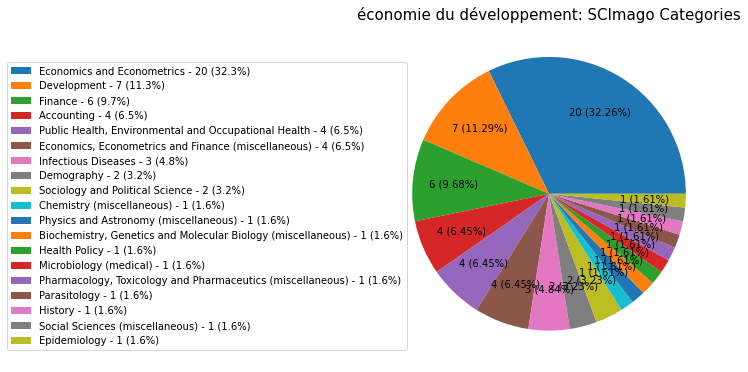

  ==> Saved figure at "./exports/rankings_by_teams_economie_du_developpement_scimago_sjr_q_score_0.png"


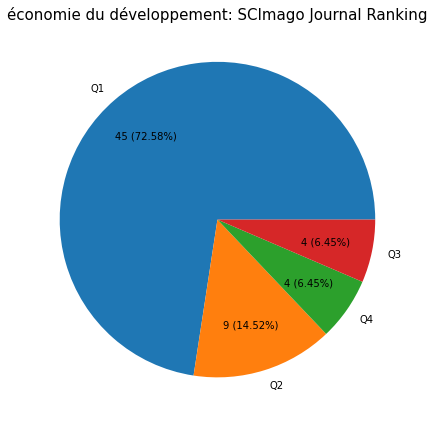

==> Process scimago ranking for économie du développement: (filemane=by_teams_economie_du_developpement)
  ==> Saved CSV at "./exports/rankings_by_teams_economie_du_developpement_scimago.csv"
  ==> Saved CSV at "./exports/rankings_by_teams_economie_du_developpement_scimago_filtered_1.csv"
  ==> Saved figure at "./exports/rankings_by_teams_economie_du_developpement_scimago_categories_1.png"


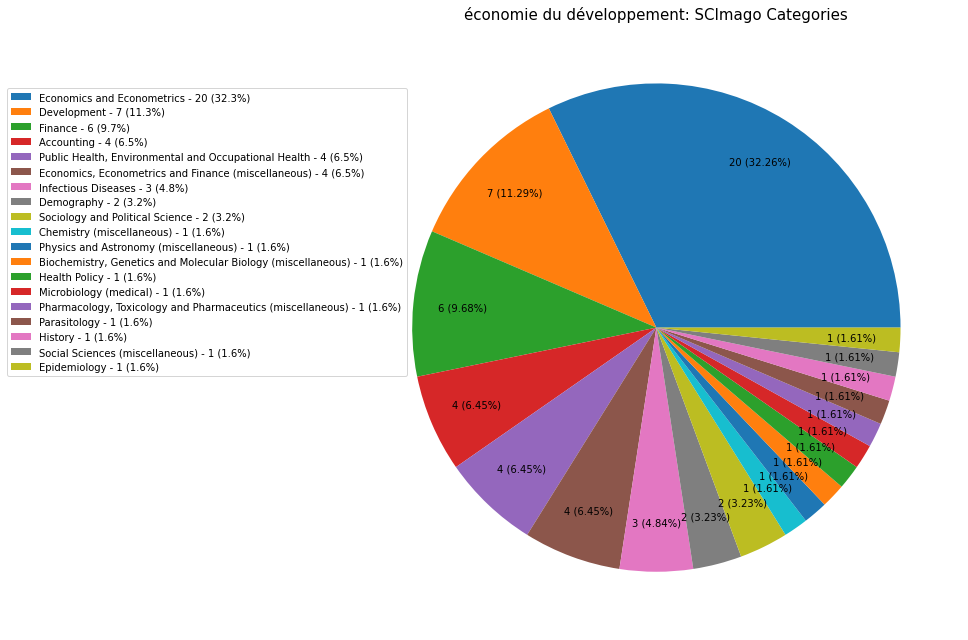

  ==> Saved figure at "./exports/rankings_by_teams_economie_du_developpement_scimago_sjr_q_score_1.png"


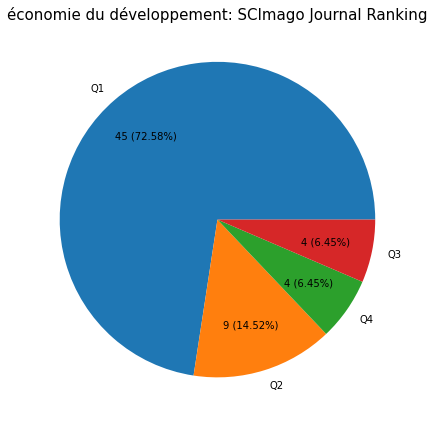

==> Process scimago ranking for économie du développement: (filemane=by_teams_economie_du_developpement)
  ==> Saved CSV at "./exports/rankings_by_teams_economie_du_developpement_scimago.csv"
  ==> Rework dataframe to group the less used categories (quantile=0.005)
  ==> Saved CSV at "./exports/rankings_by_teams_economie_du_developpement_scimago_filtered_2.csv"
  ==> Saved figure at "./exports/rankings_by_teams_economie_du_developpement_scimago_categories_2.png"


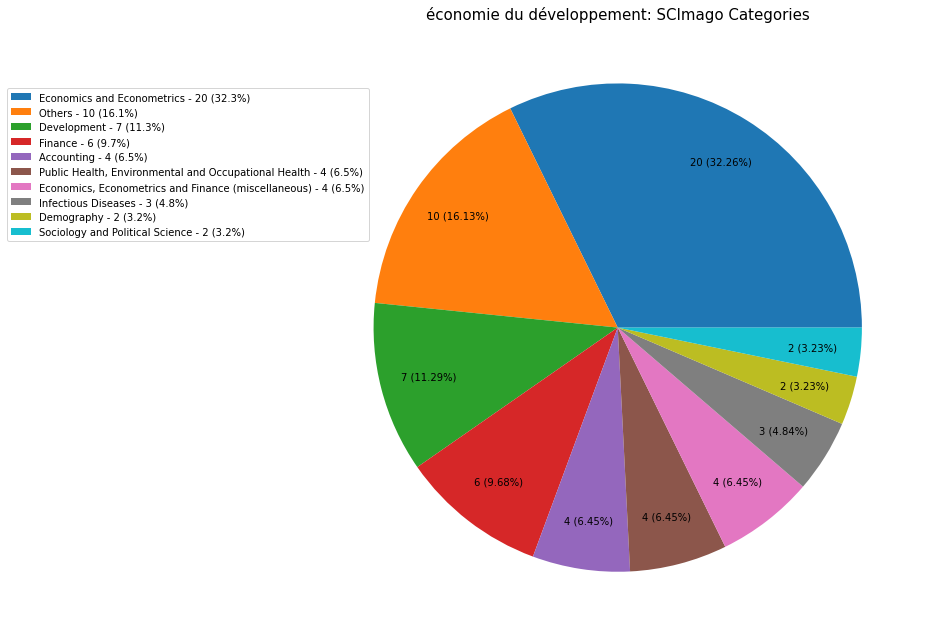

  ==> Saved figure at "./exports/rankings_by_teams_economie_du_developpement_scimago_sjr_q_score_2.png"


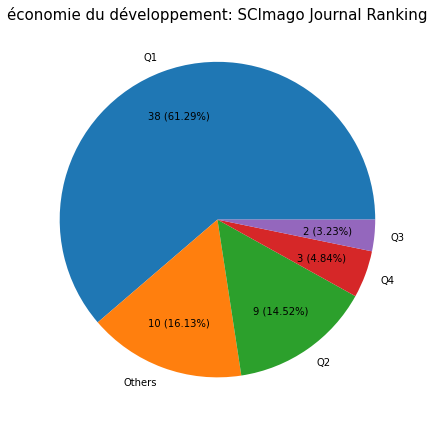

=> process team: économie internationale
==> Process generic ranking for économie internationale: (filemane=by_teams_economie_internationale)
  ==> Saved CSV at "./exports/rankings_by_teams_economie_internationale.png"
  ==> Saved CSV at "./exports/rankings_by_teams_economie_internationale_count.csv"
  ==> Saved figure at "./exports/rankings_by_teams_economie_internationale_general.png"


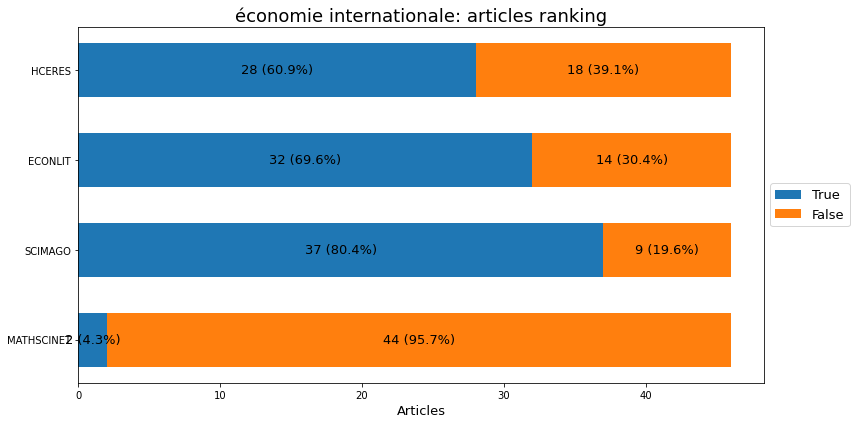

==> Create ranking plot économie internationale: for HCERES (filemane=by_teams_economie_internationale, params={})
  ==> Saved figure at "./exports/rankings_by_teams_economie_internationale_hceres.png"


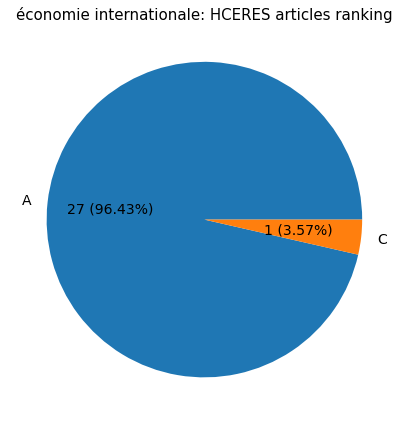

  ==> Saved figure at "./exports/rankings_by_teams_economie_internationale_distribution_of_articles_in_journal_classification_referentials.png"


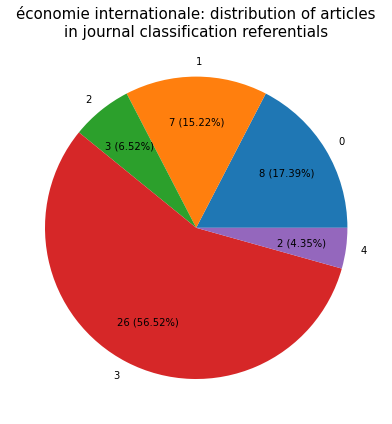

==> Create Scimago / HCERES matrix (filemane=by_teams_economie_internationale)
  ==> Saved Excel at "./exports/rankings_by_teams_economie_internationale_hceres_scimago_matrix.xlsx"
  ==> Saved Excel at "./exports/rankings_by_teams_economie_internationale_hceres_scimago_matrix_2.xlsx"
==> Process scimago ranking for économie internationale: (filemane=by_teams_economie_internationale)
  ==> Saved CSV at "./exports/rankings_by_teams_economie_internationale_scimago.csv"
  ==> Saved CSV at "./exports/rankings_by_teams_economie_internationale_scimago_filtered_0.csv"
  ==> Saved figure at "./exports/rankings_by_teams_economie_internationale_scimago_categories_0.png"


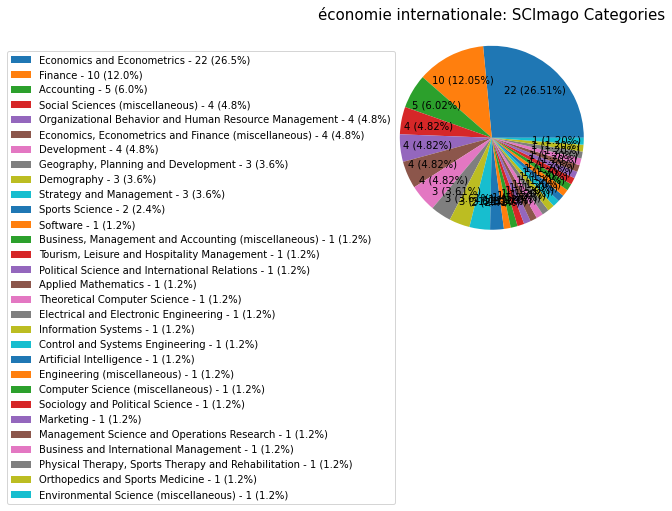

  ==> Saved figure at "./exports/rankings_by_teams_economie_internationale_scimago_sjr_q_score_0.png"


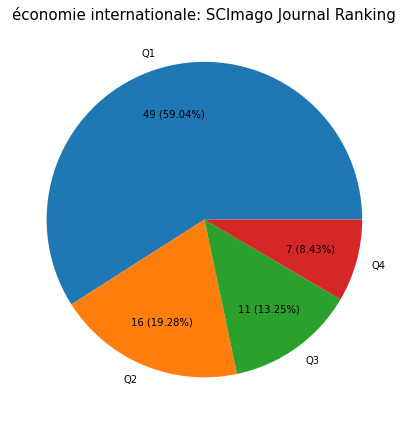

==> Process scimago ranking for économie internationale: (filemane=by_teams_economie_internationale)
  ==> Saved CSV at "./exports/rankings_by_teams_economie_internationale_scimago.csv"
  ==> Saved CSV at "./exports/rankings_by_teams_economie_internationale_scimago_filtered_1.csv"
  ==> Saved figure at "./exports/rankings_by_teams_economie_internationale_scimago_categories_1.png"


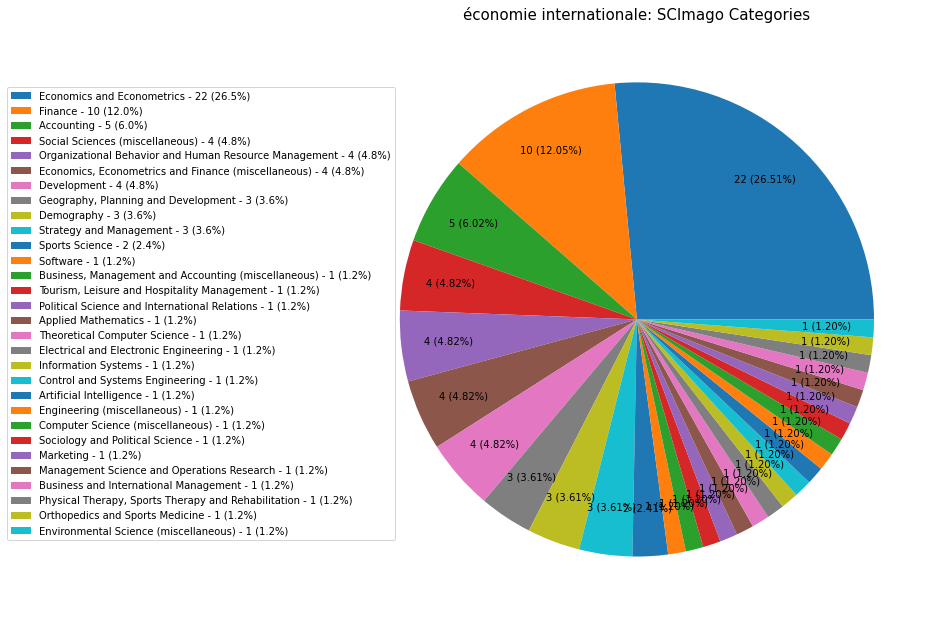

  ==> Saved figure at "./exports/rankings_by_teams_economie_internationale_scimago_sjr_q_score_1.png"


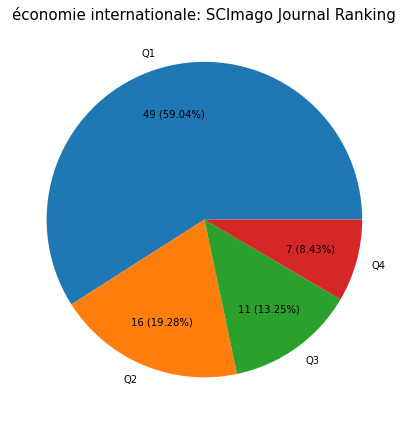

==> Process scimago ranking for économie internationale: (filemane=by_teams_economie_internationale)
  ==> Saved CSV at "./exports/rankings_by_teams_economie_internationale_scimago.csv"
  ==> Rework dataframe to group the less used categories (quantile=0.005)
  ==> Saved CSV at "./exports/rankings_by_teams_economie_internationale_scimago_filtered_2.csv"
  ==> Saved figure at "./exports/rankings_by_teams_economie_internationale_scimago_categories_2.png"


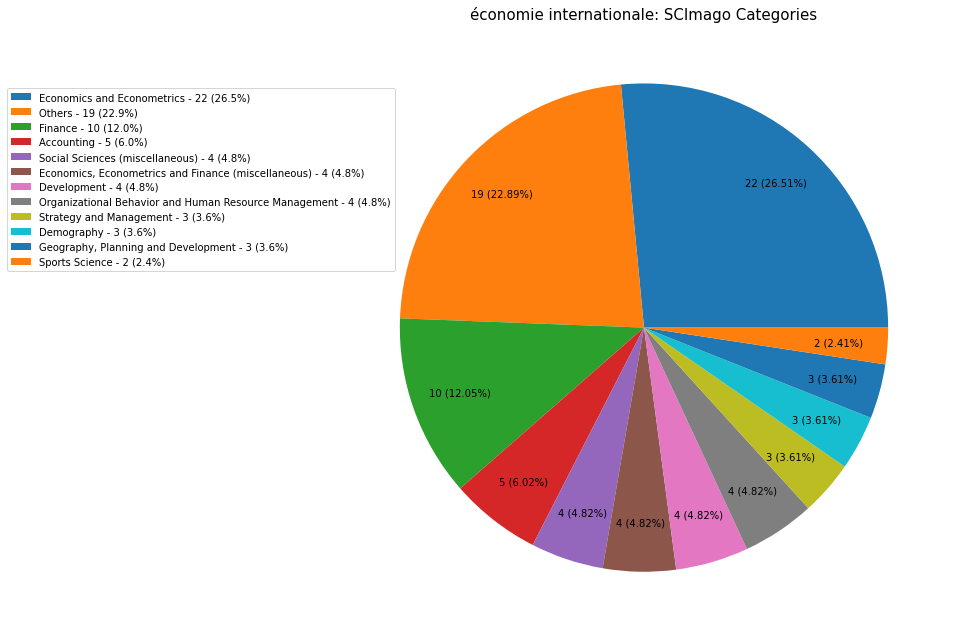

  ==> Saved figure at "./exports/rankings_by_teams_economie_internationale_scimago_sjr_q_score_2.png"


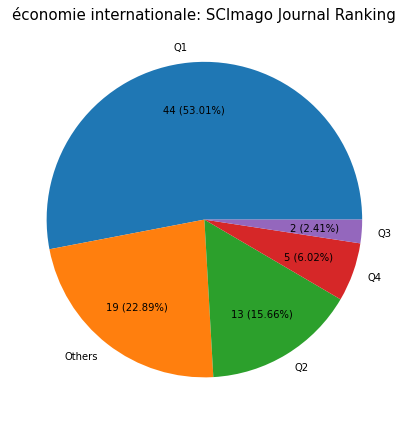

=> process team: économie politique
==> Process generic ranking for économie politique: (filemane=by_teams_economie_politique)
  ==> Saved CSV at "./exports/rankings_by_teams_economie_politique.png"
  ==> Saved CSV at "./exports/rankings_by_teams_economie_politique_count.csv"
  ==> Saved figure at "./exports/rankings_by_teams_economie_politique_general.png"


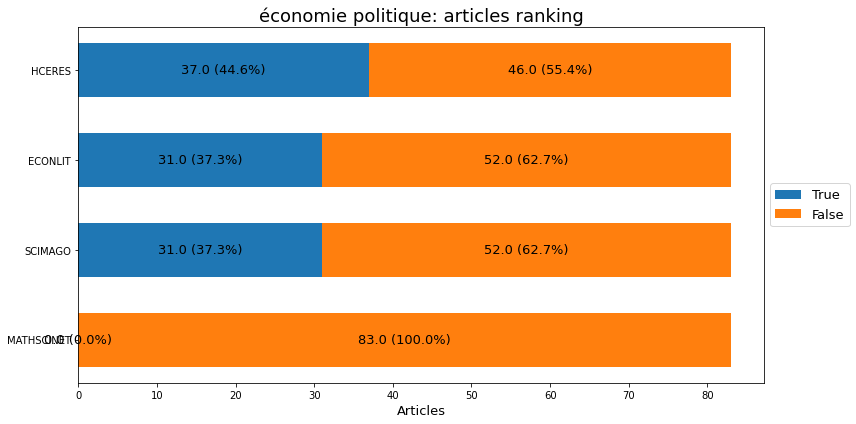

==> Create ranking plot économie politique: for HCERES (filemane=by_teams_economie_politique, params={})
  ==> Saved figure at "./exports/rankings_by_teams_economie_politique_hceres.png"


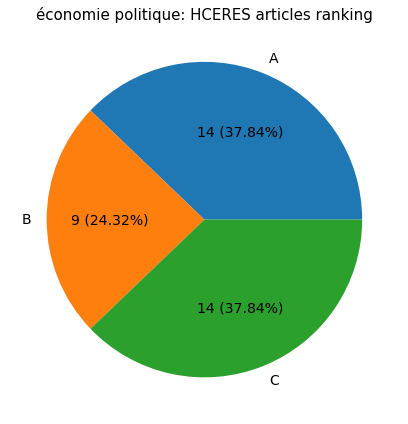

  ==> Saved figure at "./exports/rankings_by_teams_economie_politique_distribution_of_articles_in_journal_classification_referentials.png"


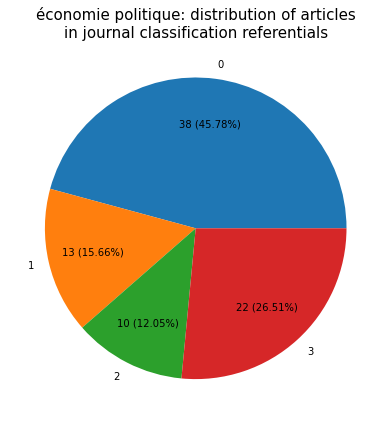

==> Create Scimago / HCERES matrix (filemane=by_teams_economie_politique)
  ==> Saved Excel at "./exports/rankings_by_teams_economie_politique_hceres_scimago_matrix.xlsx"
  ==> Saved Excel at "./exports/rankings_by_teams_economie_politique_hceres_scimago_matrix_2.xlsx"
==> Process scimago ranking for économie politique: (filemane=by_teams_economie_politique)
  ==> Saved CSV at "./exports/rankings_by_teams_economie_politique_scimago.csv"
  ==> Saved CSV at "./exports/rankings_by_teams_economie_politique_scimago_filtered_0.csv"
  ==> Saved figure at "./exports/rankings_by_teams_economie_politique_scimago_categories_0.png"


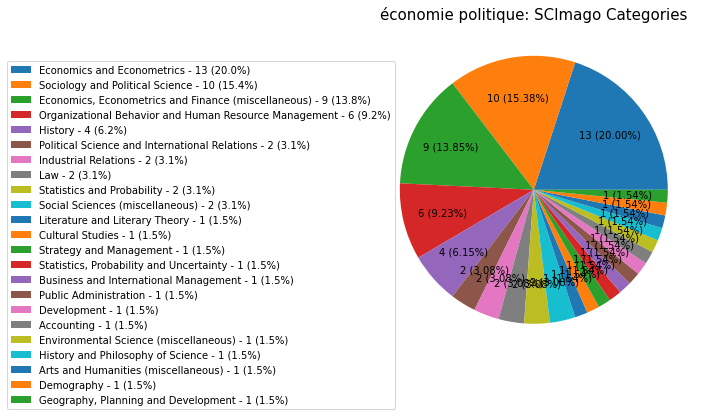

  ==> Saved figure at "./exports/rankings_by_teams_economie_politique_scimago_sjr_q_score_0.png"


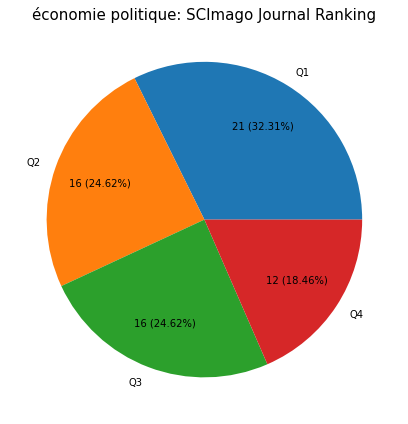

==> Process scimago ranking for économie politique: (filemane=by_teams_economie_politique)
  ==> Saved CSV at "./exports/rankings_by_teams_economie_politique_scimago.csv"
  ==> Saved CSV at "./exports/rankings_by_teams_economie_politique_scimago_filtered_1.csv"
  ==> Saved figure at "./exports/rankings_by_teams_economie_politique_scimago_categories_1.png"


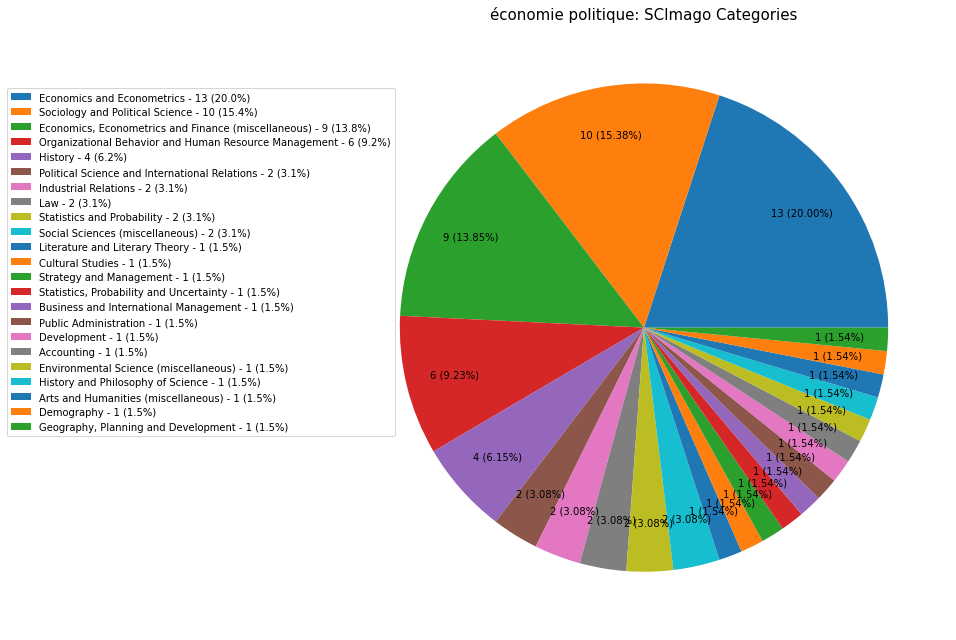

  ==> Saved figure at "./exports/rankings_by_teams_economie_politique_scimago_sjr_q_score_1.png"


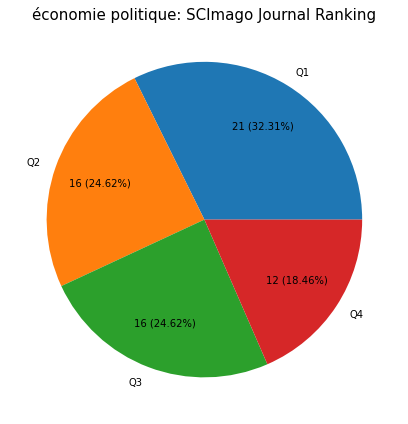

==> Process scimago ranking for économie politique: (filemane=by_teams_economie_politique)
  ==> Saved CSV at "./exports/rankings_by_teams_economie_politique_scimago.csv"
  ==> Rework dataframe to group the less used categories (quantile=0.005)
  ==> Saved CSV at "./exports/rankings_by_teams_economie_politique_scimago_filtered_2.csv"
  ==> Saved figure at "./exports/rankings_by_teams_economie_politique_scimago_categories_2.png"


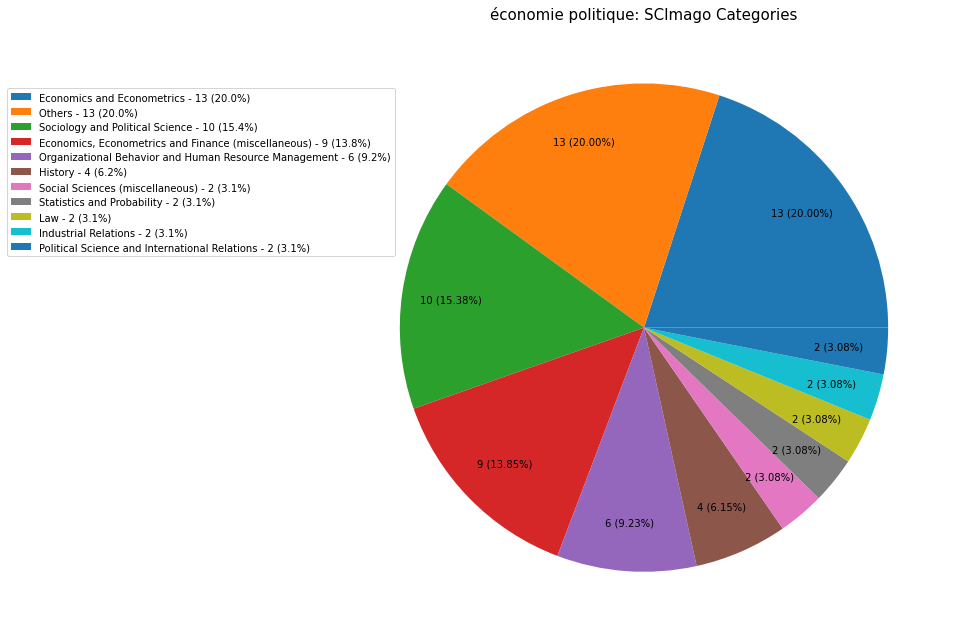

  ==> Saved figure at "./exports/rankings_by_teams_economie_politique_scimago_sjr_q_score_2.png"


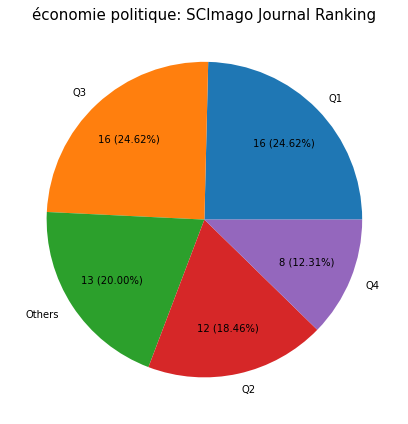

All teams have been process


In [65]:
for _team_name in teams['EQUIPE'].drop_duplicates().tolist():
    _team_filename_part = NON_ALPHA_NUMERIC_REGEX.sub("_", unidecode.unidecode(_team_name))
    print(f'=> process team: {_team_name}')
    # Proportions of ranking by team
    by_teams_df = dft.merge(df, on='uri_s')
    by_teams_df = by_teams_df[(by_teams_df.EQUIPE == _team_name)]
    by_teams_df = by_teams_df.drop_duplicates(subset=['uri_s'], ignore_index=True)
    # Processing and plot for the current team
    by_teams_ranking_df = rankings(dataframe=by_teams_df, title=f'{_team_name}:', filename=f'by_teams_{_team_filename_part}')
    scimago_hceres_matrix(dataframe=by_teams_ranking_df, filename=f'by_teams_{_team_filename_part}')
    # Printing multiple graph to take the best one
    scimago_rankings(
        dataframe=by_teams_ranking_df,
        title=f'{_team_name}:',
        filename=f'by_teams_{_team_filename_part}',
        suffix=0,
        quantile=0,
        category_params=dict(figsize=(9, 6), pctdistance=0.7)
    )
    scimago_rankings(
        dataframe=by_teams_ranking_df,
        title=f'{_team_name}:',
        filename=f'by_teams_{_team_filename_part}',
        suffix=1,
        quantile=0,
        category_params=dict(figsize=(18, 9), pctdistance=0.8)
    )
    scimago_rankings(
        dataframe=by_teams_ranking_df,
        title=f'{_team_name}:',
        filename=f'by_teams_{_team_filename_part}',
        suffix=2,
        quantile=0.005,
        category_params=dict(figsize=(18, 9), pctdistance=0.8)
    )
print('All teams have been process')

### By Themes

=> process theme: N/A
==> Process generic ranking for N/A: (filemane=by_themes_N_A)
  ==> Saved CSV at "./exports/rankings_by_themes_N_A.png"
  ==> Saved CSV at "./exports/rankings_by_themes_N_A_count.csv"
  ==> Saved figure at "./exports/rankings_by_themes_N_A_general.png"


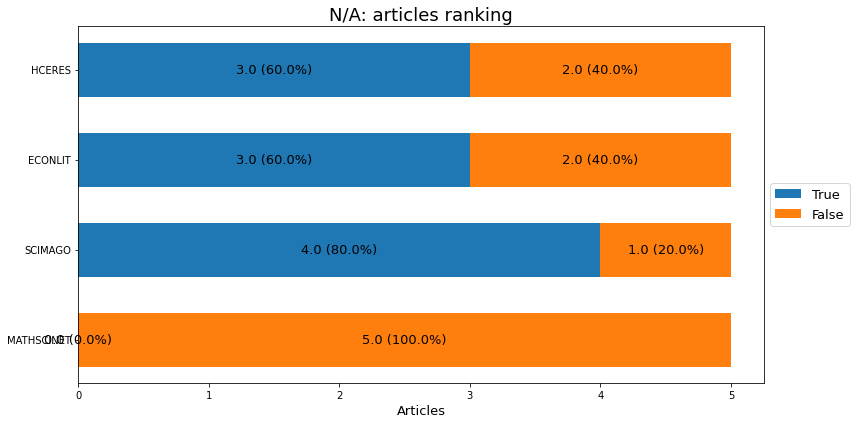

==> Create ranking plot N/A: for HCERES (filemane=by_themes_N_A, params={})
  ==> Saved figure at "./exports/rankings_by_themes_N_A_hceres.png"


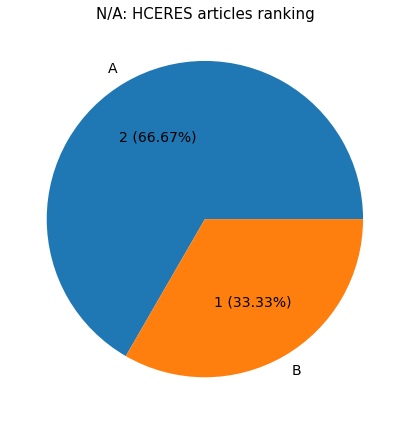

  ==> Saved figure at "./exports/rankings_by_themes_N_A_distribution_of_articles_in_journal_classification_referentials.png"


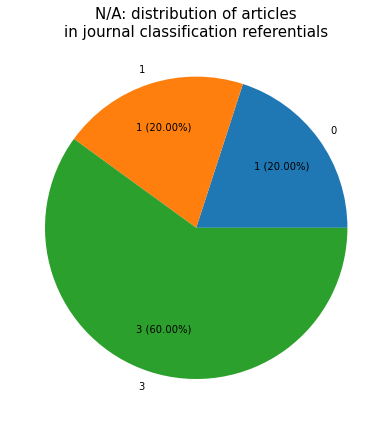

==> Create Scimago / HCERES matrix (filemane=by_themes_N_A)
  ==> Saved Excel at "./exports/rankings_by_themes_N_A_hceres_scimago_matrix.xlsx"
  ==> Saved Excel at "./exports/rankings_by_themes_N_A_hceres_scimago_matrix_2.xlsx"
==> Process scimago ranking for N/A: (filemane=by_themes_N_A)
  ==> Saved CSV at "./exports/rankings_by_themes_N_A_scimago.csv"
  ==> Saved CSV at "./exports/rankings_by_themes_N_A_scimago_filtered_0.csv"
  ==> Saved figure at "./exports/rankings_by_themes_N_A_scimago_categories_0.png"


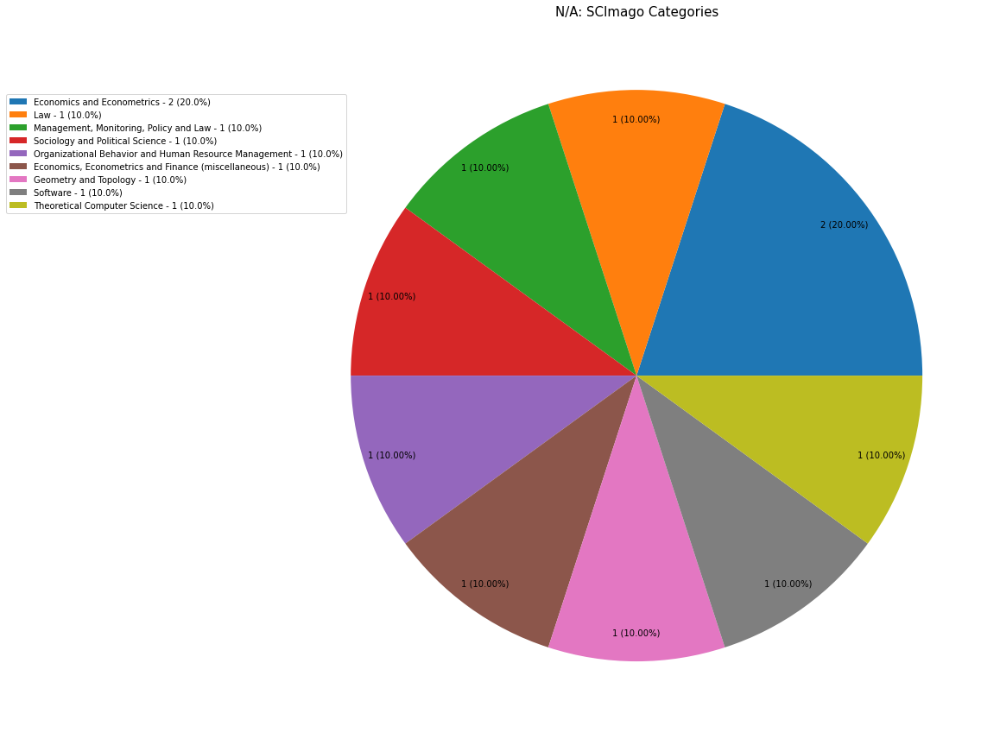

  ==> Saved figure at "./exports/rankings_by_themes_N_A_scimago_sjr_q_score_0.png"


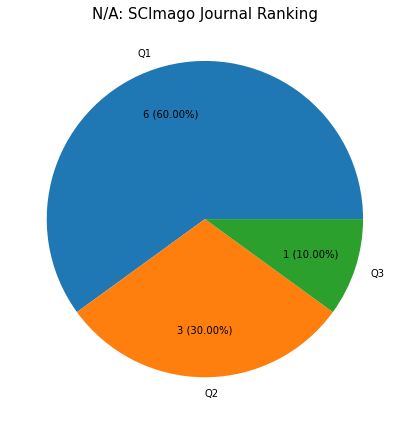

==> Process scimago ranking for N/A: (filemane=by_themes_N_A)
  ==> Saved CSV at "./exports/rankings_by_themes_N_A_scimago.csv"
  ==> Rework dataframe to group the less used categories (quantile=1e-05)
  ==> Saved CSV at "./exports/rankings_by_themes_N_A_scimago_filtered_1.csv"
  ==> Saved figure at "./exports/rankings_by_themes_N_A_scimago_categories_1.png"


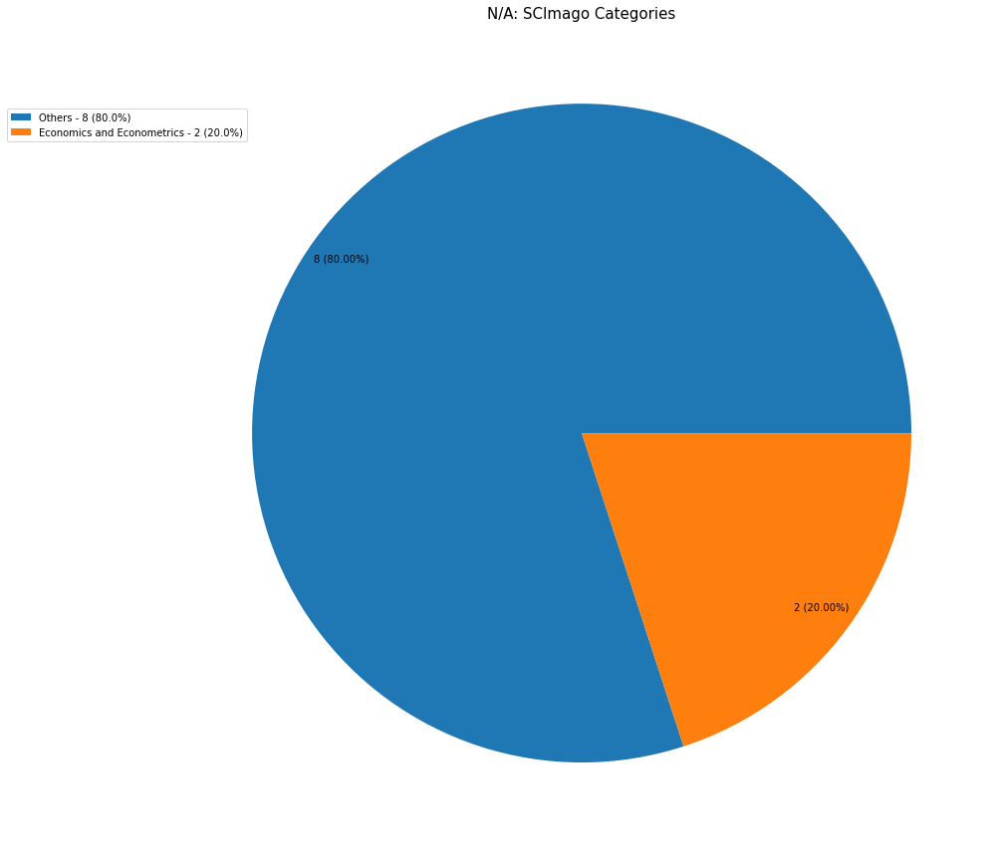

  ==> Saved figure at "./exports/rankings_by_themes_N_A_scimago_sjr_q_score_1.png"


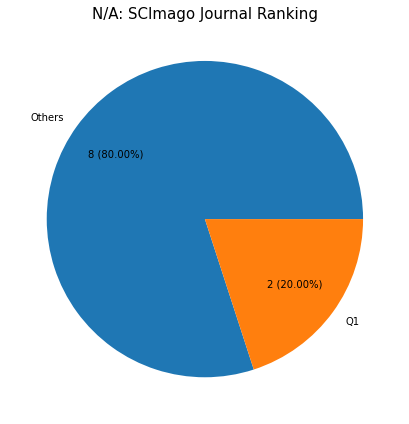

==> Process scimago ranking for N/A: (filemane=by_themes_N_A)
  ==> Saved CSV at "./exports/rankings_by_themes_N_A_scimago.csv"
  ==> Rework dataframe to group the less used categories (quantile=0.3)
  ==> Saved CSV at "./exports/rankings_by_themes_N_A_scimago_filtered_2.csv"
  ==> Saved figure at "./exports/rankings_by_themes_N_A_scimago_categories_2.png"


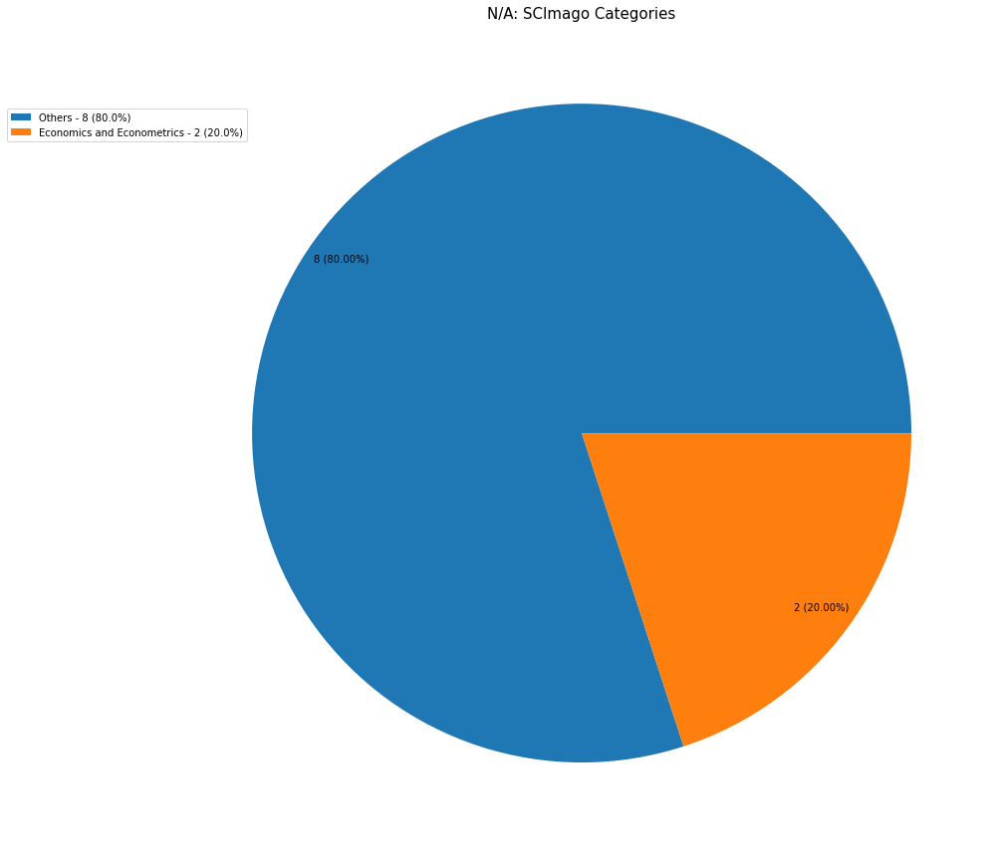

  ==> Saved figure at "./exports/rankings_by_themes_N_A_scimago_sjr_q_score_2.png"


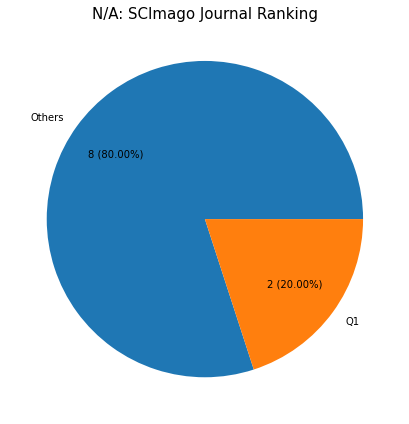

=> process theme: thème 1
==> Process generic ranking for thème 1: (filemane=by_themes_theme_1)
  ==> Saved CSV at "./exports/rankings_by_themes_theme_1.png"
  ==> Saved CSV at "./exports/rankings_by_themes_theme_1_count.csv"
  ==> Saved figure at "./exports/rankings_by_themes_theme_1_general.png"


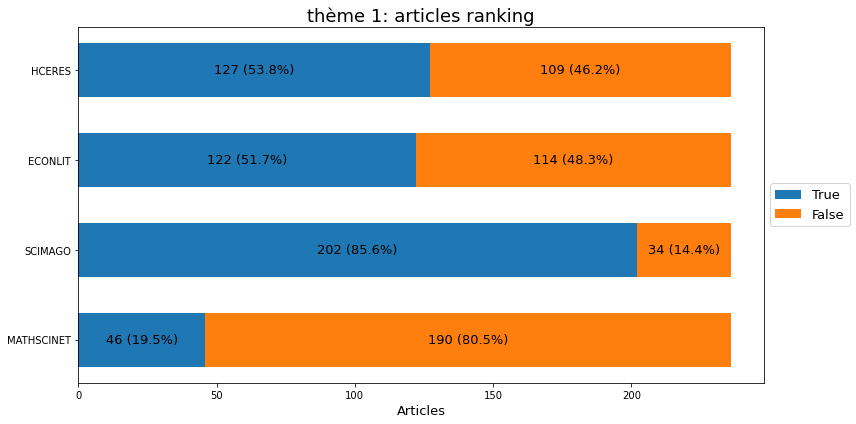

==> Create ranking plot thème 1: for HCERES (filemane=by_themes_theme_1, params={})
  ==> Saved figure at "./exports/rankings_by_themes_theme_1_hceres.png"


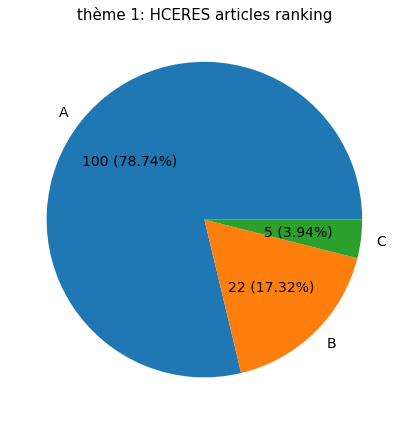

  ==> Saved figure at "./exports/rankings_by_themes_theme_1_distribution_of_articles_in_journal_classification_referentials.png"


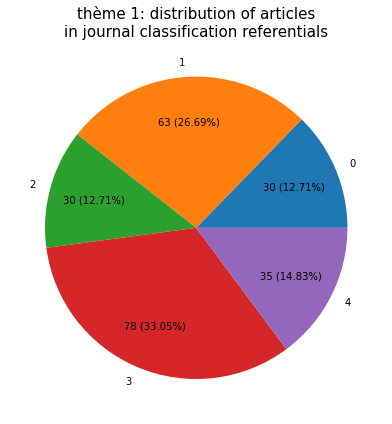

==> Create Scimago / HCERES matrix (filemane=by_themes_theme_1)
  ==> Saved Excel at "./exports/rankings_by_themes_theme_1_hceres_scimago_matrix.xlsx"
  ==> Saved Excel at "./exports/rankings_by_themes_theme_1_hceres_scimago_matrix_2.xlsx"
==> Process scimago ranking for thème 1: (filemane=by_themes_theme_1)
  ==> Saved CSV at "./exports/rankings_by_themes_theme_1_scimago.csv"
  ==> Saved CSV at "./exports/rankings_by_themes_theme_1_scimago_filtered_0.csv"
  ==> Saved figure at "./exports/rankings_by_themes_theme_1_scimago_categories_0.png"


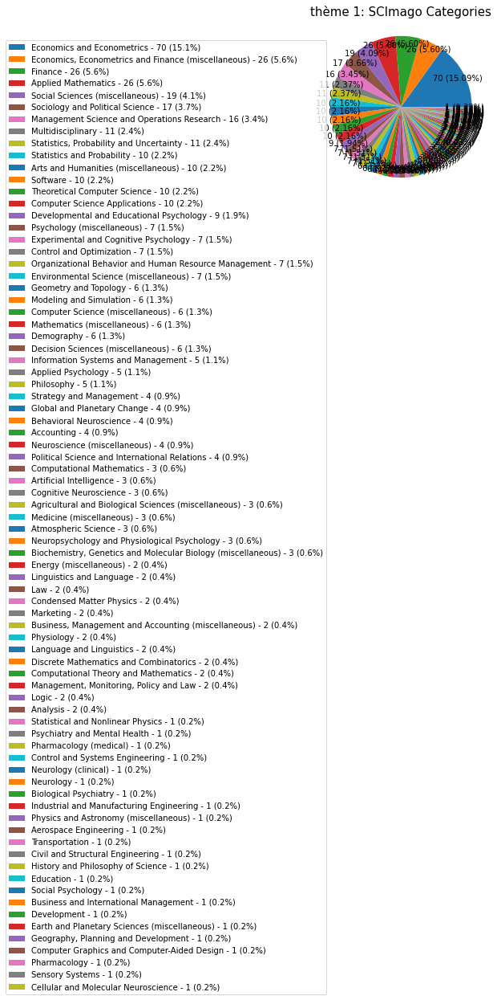

  ==> Saved figure at "./exports/rankings_by_themes_theme_1_scimago_sjr_q_score_0.png"


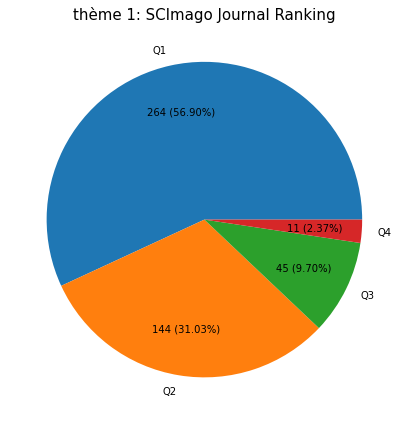

==> Process scimago ranking for thème 1: (filemane=by_themes_theme_1)
  ==> Saved CSV at "./exports/rankings_by_themes_theme_1_scimago.csv"
  ==> Rework dataframe to group the less used categories (quantile=1e-05)
  ==> Saved CSV at "./exports/rankings_by_themes_theme_1_scimago_filtered_1.csv"
  ==> Saved figure at "./exports/rankings_by_themes_theme_1_scimago_categories_1.png"


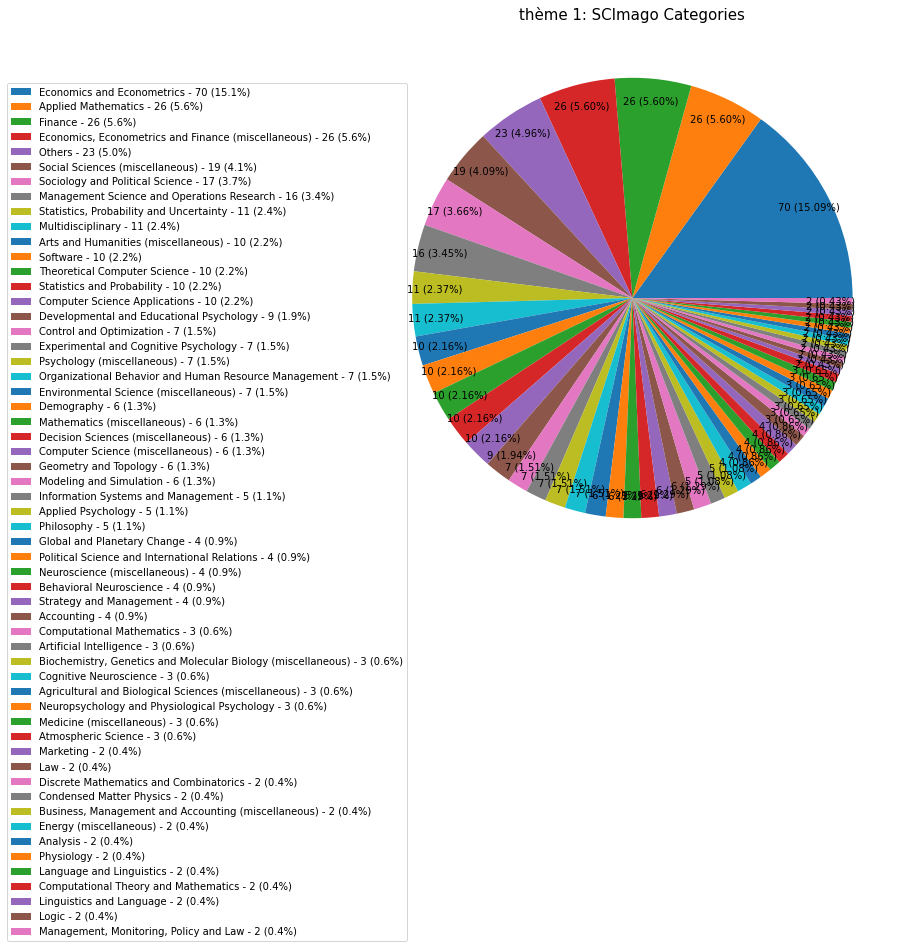

  ==> Saved figure at "./exports/rankings_by_themes_theme_1_scimago_sjr_q_score_1.png"


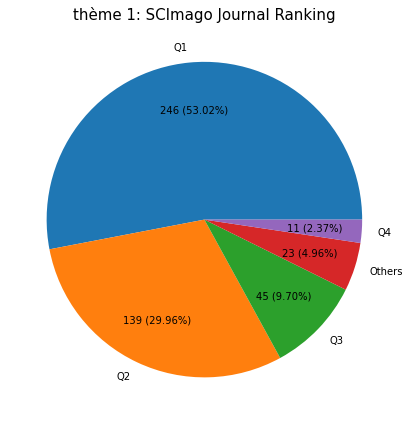

==> Process scimago ranking for thème 1: (filemane=by_themes_theme_1)
  ==> Saved CSV at "./exports/rankings_by_themes_theme_1_scimago.csv"
  ==> Rework dataframe to group the less used categories (quantile=0.3)
  ==> Saved CSV at "./exports/rankings_by_themes_theme_1_scimago_filtered_2.csv"
  ==> Saved figure at "./exports/rankings_by_themes_theme_1_scimago_categories_2.png"


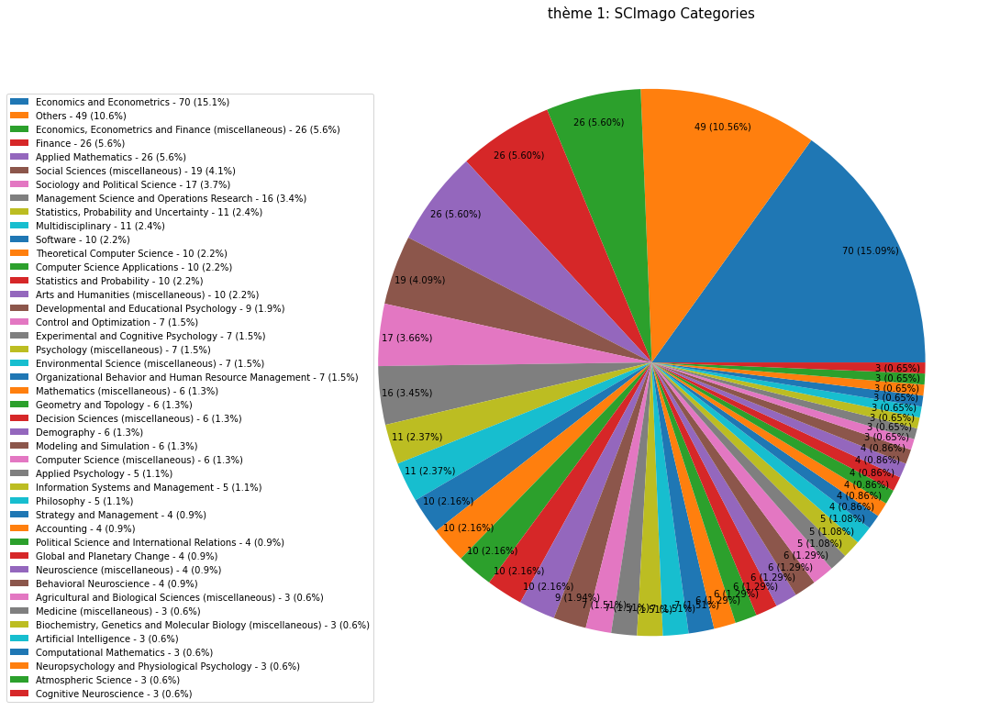

  ==> Saved figure at "./exports/rankings_by_themes_theme_1_scimago_sjr_q_score_2.png"


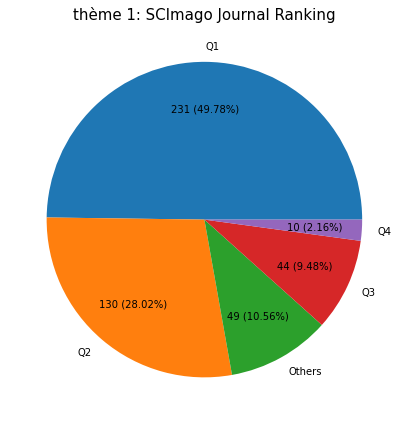

=> process theme: thème 2
==> Process generic ranking for thème 2: (filemane=by_themes_theme_2)
  ==> Saved CSV at "./exports/rankings_by_themes_theme_2.png"
  ==> Saved CSV at "./exports/rankings_by_themes_theme_2_count.csv"
  ==> Saved figure at "./exports/rankings_by_themes_theme_2_general.png"


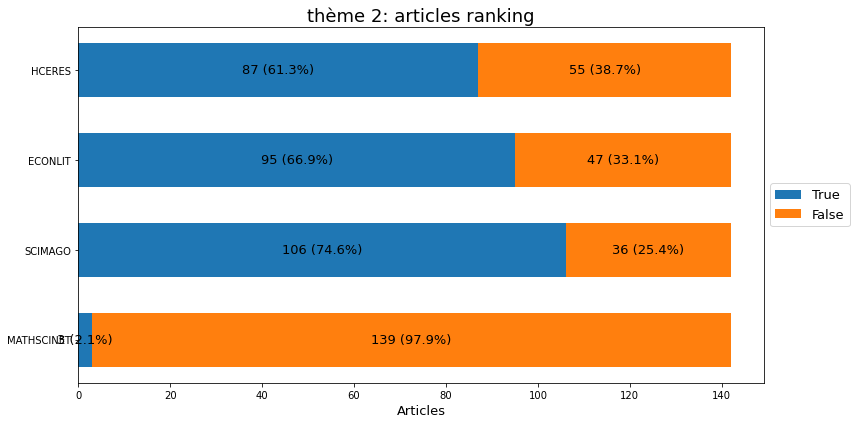

==> Create ranking plot thème 2: for HCERES (filemane=by_themes_theme_2, params={})
  ==> Saved figure at "./exports/rankings_by_themes_theme_2_hceres.png"


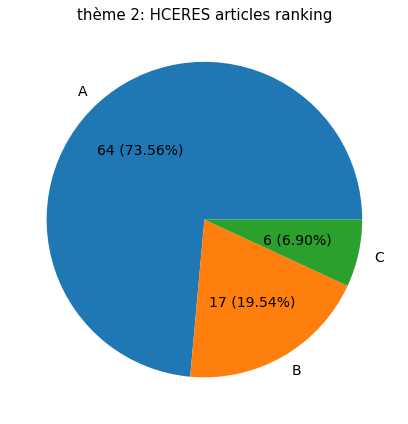

  ==> Saved figure at "./exports/rankings_by_themes_theme_2_distribution_of_articles_in_journal_classification_referentials.png"


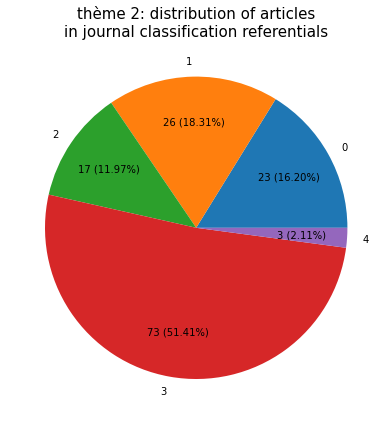

==> Create Scimago / HCERES matrix (filemane=by_themes_theme_2)
  ==> Saved Excel at "./exports/rankings_by_themes_theme_2_hceres_scimago_matrix.xlsx"
  ==> Saved Excel at "./exports/rankings_by_themes_theme_2_hceres_scimago_matrix_2.xlsx"
==> Process scimago ranking for thème 2: (filemane=by_themes_theme_2)
  ==> Saved CSV at "./exports/rankings_by_themes_theme_2_scimago.csv"
  ==> Saved CSV at "./exports/rankings_by_themes_theme_2_scimago_filtered_0.csv"
  ==> Saved figure at "./exports/rankings_by_themes_theme_2_scimago_categories_0.png"


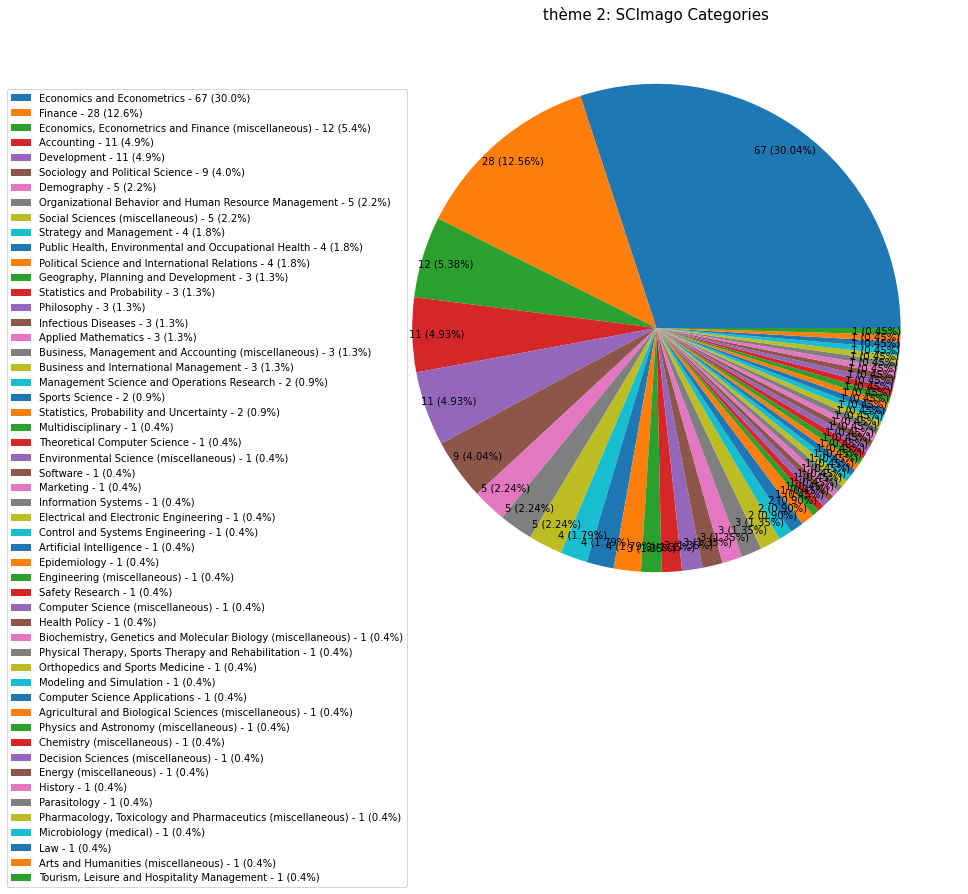

  ==> Saved figure at "./exports/rankings_by_themes_theme_2_scimago_sjr_q_score_0.png"


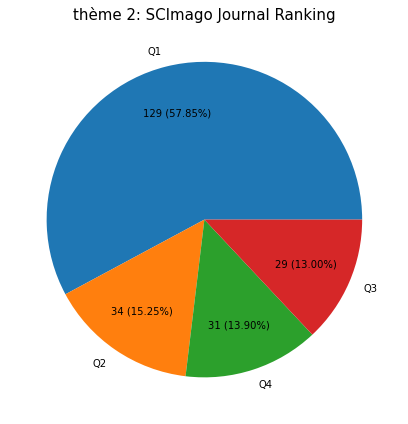

==> Process scimago ranking for thème 2: (filemane=by_themes_theme_2)
  ==> Saved CSV at "./exports/rankings_by_themes_theme_2_scimago.csv"
  ==> Rework dataframe to group the less used categories (quantile=1e-05)
  ==> Saved CSV at "./exports/rankings_by_themes_theme_2_scimago_filtered_1.csv"
  ==> Saved figure at "./exports/rankings_by_themes_theme_2_scimago_categories_1.png"


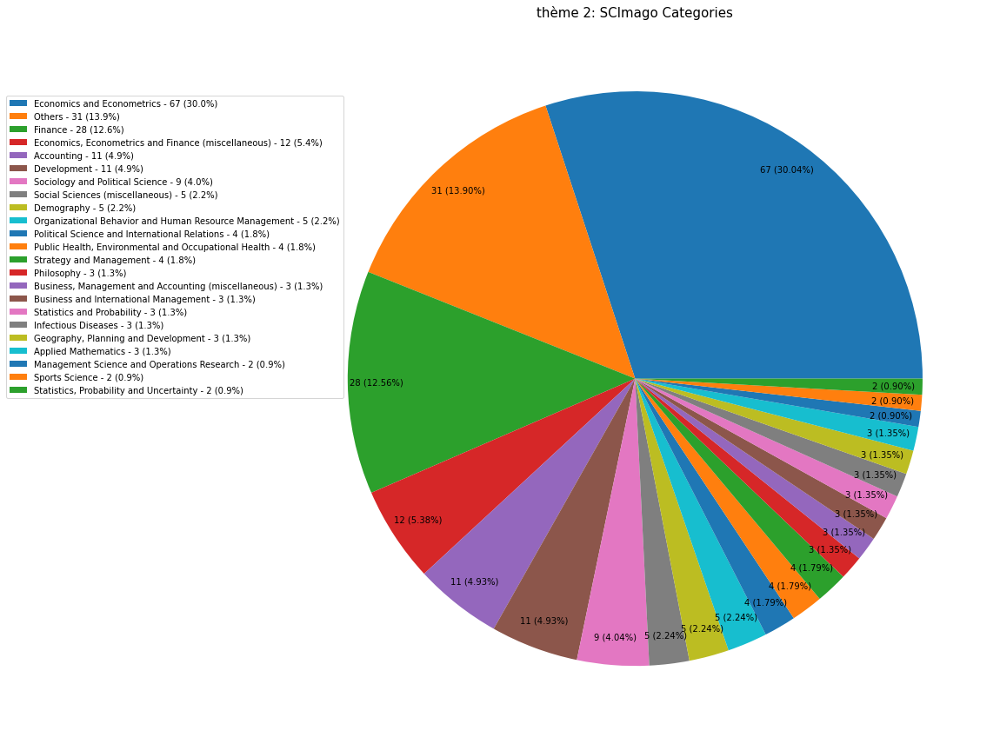

  ==> Saved figure at "./exports/rankings_by_themes_theme_2_scimago_sjr_q_score_1.png"


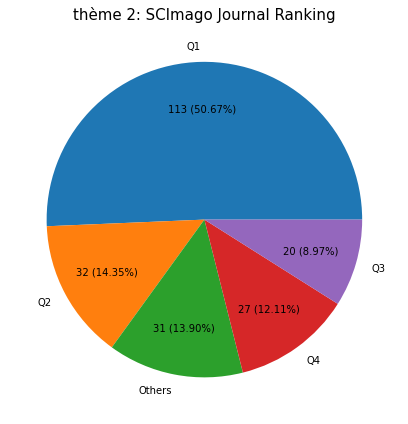

==> Process scimago ranking for thème 2: (filemane=by_themes_theme_2)
  ==> Saved CSV at "./exports/rankings_by_themes_theme_2_scimago.csv"
  ==> Rework dataframe to group the less used categories (quantile=0.3)
  ==> Saved CSV at "./exports/rankings_by_themes_theme_2_scimago_filtered_2.csv"
  ==> Saved figure at "./exports/rankings_by_themes_theme_2_scimago_categories_2.png"


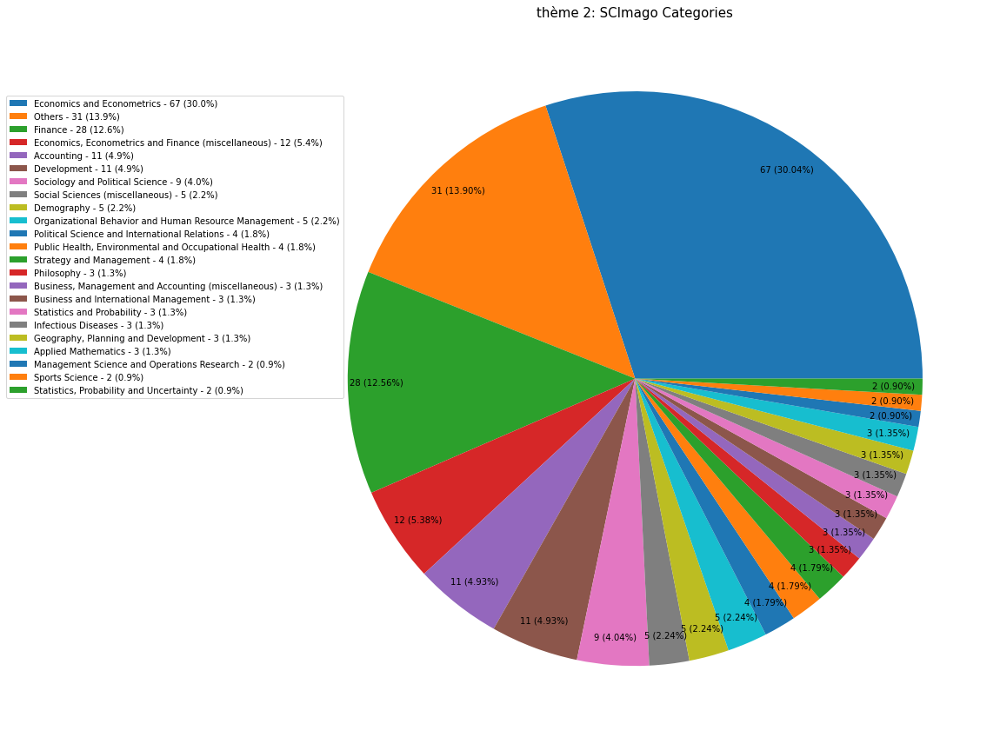

  ==> Saved figure at "./exports/rankings_by_themes_theme_2_scimago_sjr_q_score_2.png"


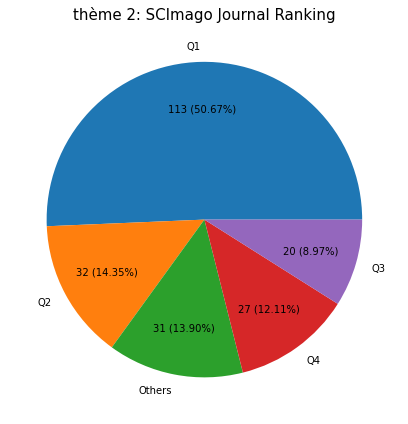

=> process theme: thème 3
==> Process generic ranking for thème 3: (filemane=by_themes_theme_3)
  ==> Saved CSV at "./exports/rankings_by_themes_theme_3.png"
  ==> Saved CSV at "./exports/rankings_by_themes_theme_3_count.csv"
  ==> Saved figure at "./exports/rankings_by_themes_theme_3_general.png"


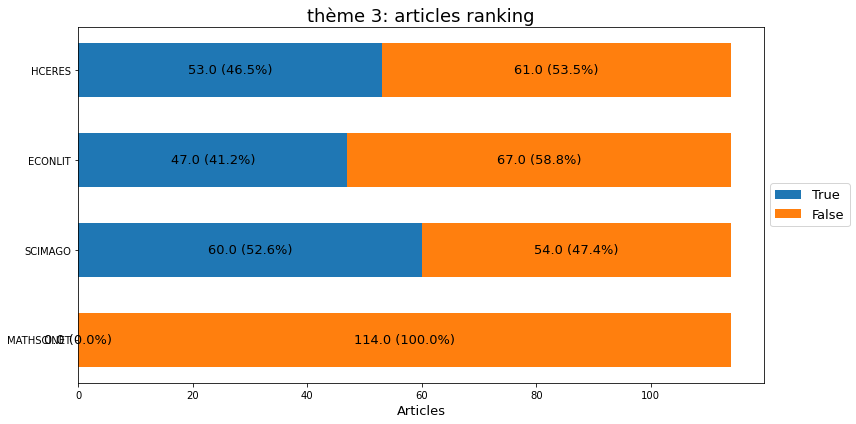

==> Create ranking plot thème 3: for HCERES (filemane=by_themes_theme_3, params={})
  ==> Saved figure at "./exports/rankings_by_themes_theme_3_hceres.png"


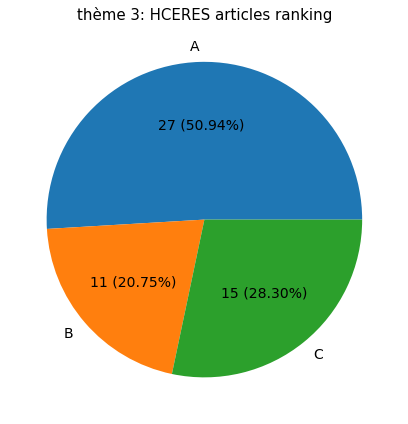

  ==> Saved figure at "./exports/rankings_by_themes_theme_3_distribution_of_articles_in_journal_classification_referentials.png"


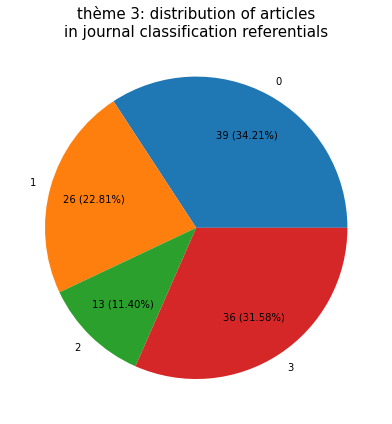

==> Create Scimago / HCERES matrix (filemane=by_themes_theme_3)
  ==> Saved Excel at "./exports/rankings_by_themes_theme_3_hceres_scimago_matrix.xlsx"
  ==> Saved Excel at "./exports/rankings_by_themes_theme_3_hceres_scimago_matrix_2.xlsx"
==> Process scimago ranking for thème 3: (filemane=by_themes_theme_3)
  ==> Saved CSV at "./exports/rankings_by_themes_theme_3_scimago.csv"
  ==> Saved CSV at "./exports/rankings_by_themes_theme_3_scimago_filtered_0.csv"
  ==> Saved figure at "./exports/rankings_by_themes_theme_3_scimago_categories_0.png"


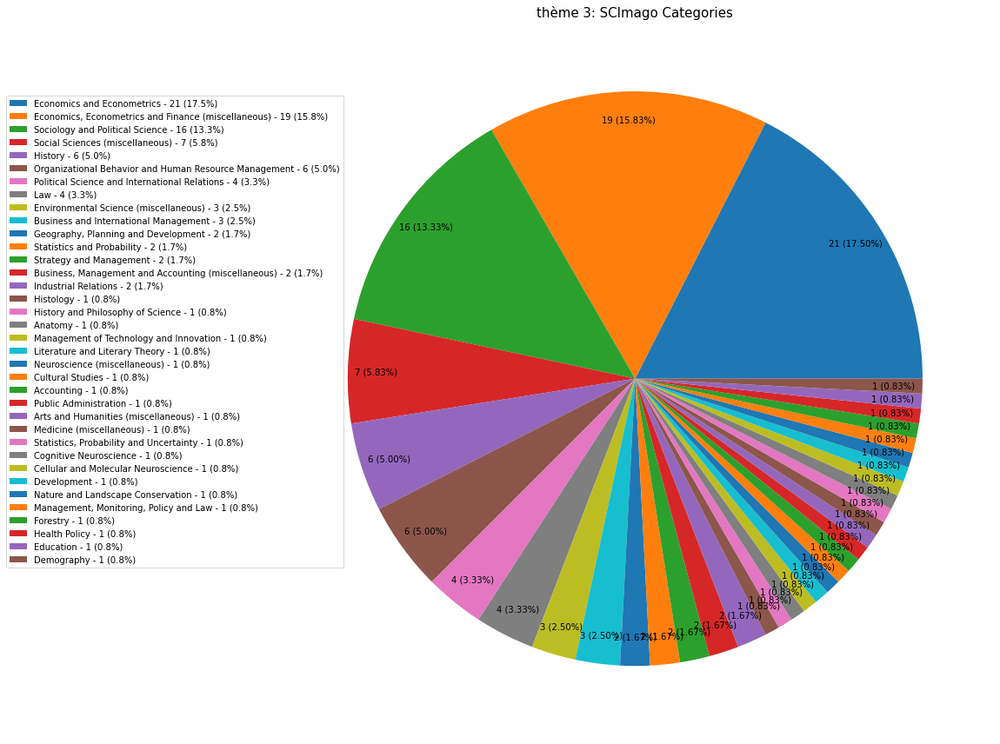

  ==> Saved figure at "./exports/rankings_by_themes_theme_3_scimago_sjr_q_score_0.png"


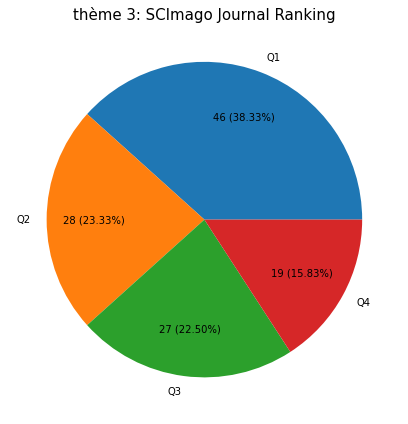

==> Process scimago ranking for thème 3: (filemane=by_themes_theme_3)
  ==> Saved CSV at "./exports/rankings_by_themes_theme_3_scimago.csv"
  ==> Rework dataframe to group the less used categories (quantile=1e-05)
  ==> Saved CSV at "./exports/rankings_by_themes_theme_3_scimago_filtered_1.csv"
  ==> Saved figure at "./exports/rankings_by_themes_theme_3_scimago_categories_1.png"


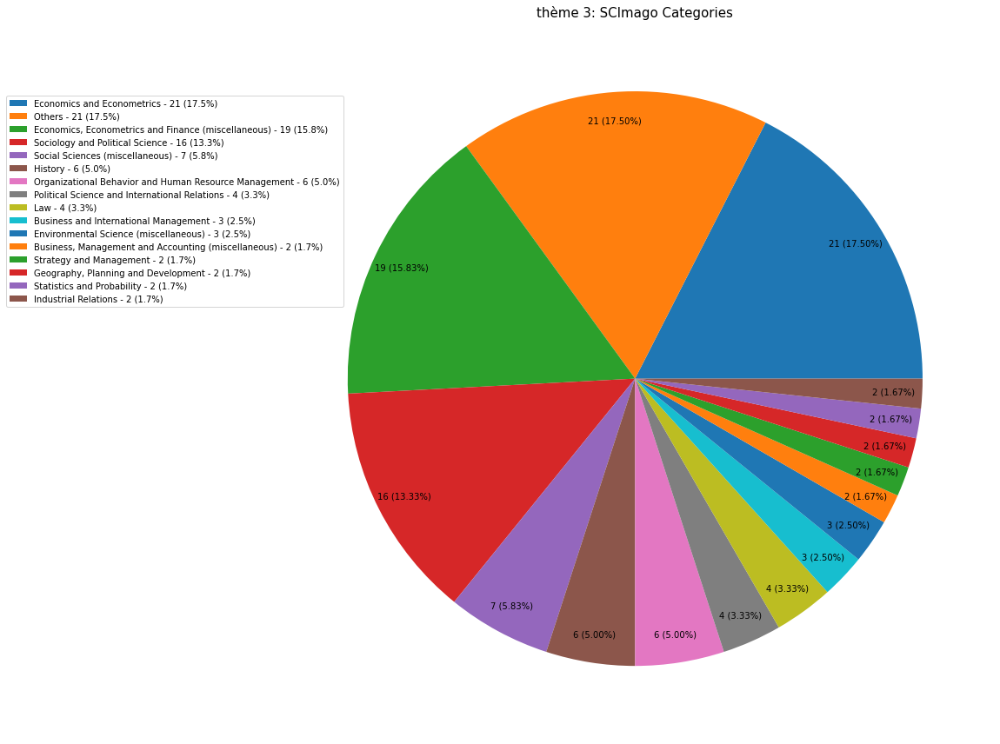

  ==> Saved figure at "./exports/rankings_by_themes_theme_3_scimago_sjr_q_score_1.png"


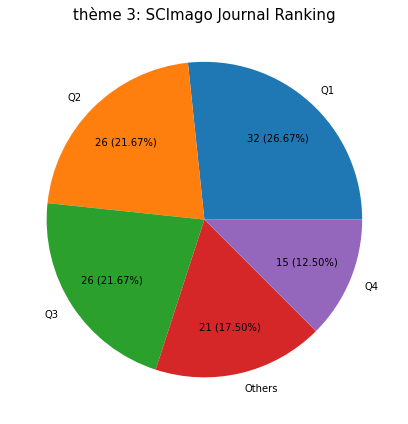

==> Process scimago ranking for thème 3: (filemane=by_themes_theme_3)
  ==> Saved CSV at "./exports/rankings_by_themes_theme_3_scimago.csv"
  ==> Rework dataframe to group the less used categories (quantile=0.3)
  ==> Saved CSV at "./exports/rankings_by_themes_theme_3_scimago_filtered_2.csv"
  ==> Saved figure at "./exports/rankings_by_themes_theme_3_scimago_categories_2.png"


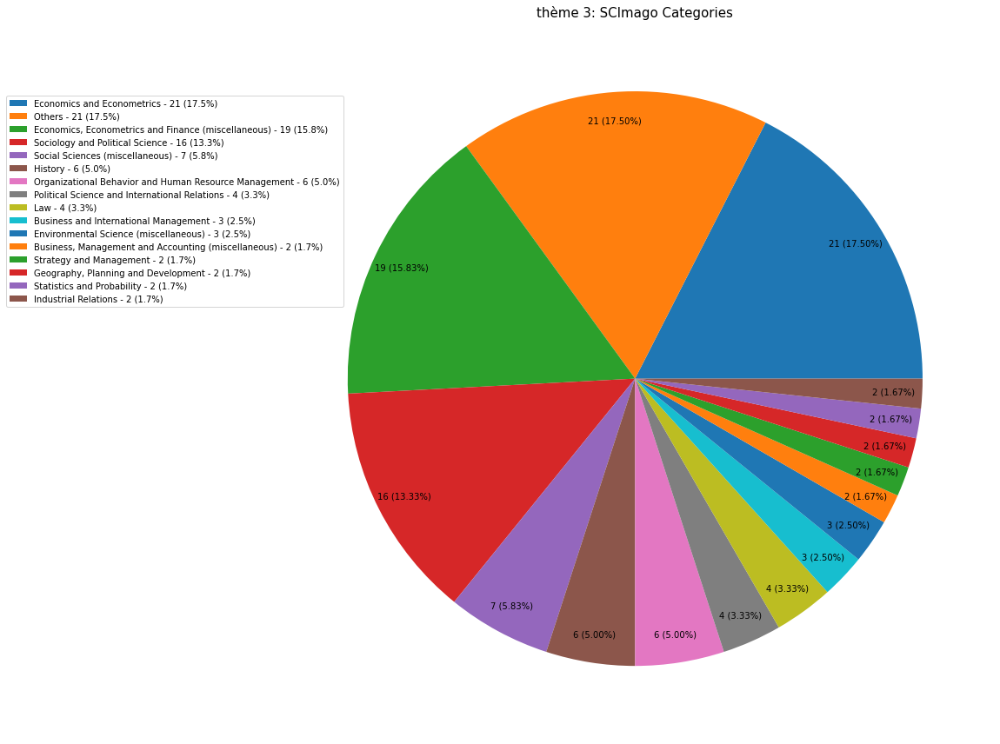

  ==> Saved figure at "./exports/rankings_by_themes_theme_3_scimago_sjr_q_score_2.png"


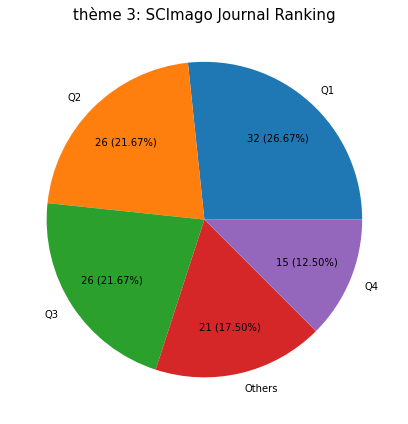

All themes have been process


In [66]:
for _theme in sorted(teams['THEME'].drop_duplicates().tolist()):
    _theme_filename_part = NON_ALPHA_NUMERIC_REGEX.sub("_", unidecode.unidecode(_theme))
    print(f'=> process theme: {_theme}')
    # Proportions of ranking by theme
    by_themes_df = df.merge(dft, on='uri_s')
    by_themes_df = by_themes_df[(by_themes_df.THEME == _theme)]
    by_themes_df = by_themes_df.drop_duplicates(subset=['uri_s'], ignore_index=True)
    # Processing and plot for the current themes
    by_themes_ranking_df = rankings(dataframe=by_themes_df, title=f'{_theme}:', filename=f'by_themes_{_theme_filename_part}')
    scimago_hceres_matrix(dataframe=by_themes_ranking_df, filename=f'by_themes_{_theme_filename_part}')
    # Printing multiple graph to take the best one
    scimago_rankings(dataframe=by_themes_ranking_df, title=f'{_theme}:', filename=f'by_themes_{_theme_filename_part}', suffix=0, quantile=0, category_params=dict())
    scimago_rankings(dataframe=by_themes_ranking_df, title=f'{_theme}:', filename=f'by_themes_{_theme_filename_part}', suffix=1, quantile=0.00001,)
    scimago_rankings(dataframe=by_themes_ranking_df, title=f'{_theme}:', filename=f'by_themes_{_theme_filename_part}', suffix=2, quantile=0.3)
    
print('All themes have been process')